In [2]:
#Connecting Google Colab to Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#https://drive.google.com/drive/folders/16RQztUqCfJOlbooHqYlJrp6Q7iL65uZB?usp=sharing

In [54]:
#Importing necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

##Analysis on the Application Dataset

In [46]:
#Reading and checking the shape of the loan application dataset
df = pd.read_csv("/content/drive/MyDrive/MS chapter/application_data.csv")
df.shape

(307511, 122)

In [ ]:
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df.info("all")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Dtype  
---   ------                        -----  
 0    SK_ID_CURR                    int64  
 1    TARGET                        int64  
 2    NAME_CONTRACT_TYPE            object 
 3    CODE_GENDER                   object 
 4    FLAG_OWN_CAR                  object 
 5    FLAG_OWN_REALTY               object 
 6    CNT_CHILDREN                  int64  
 7    AMT_INCOME_TOTAL              float64
 8    AMT_CREDIT                    float64
 9    AMT_ANNUITY                   float64
 10   AMT_GOODS_PRICE               float64
 11   NAME_TYPE_SUITE               object 
 12   NAME_INCOME_TYPE              object 
 13   NAME_EDUCATION_TYPE           object 
 14   NAME_FAMILY_STATUS            object 
 15   NAME_HOUSING_TYPE             object 
 16   REGION_POPULATION_RELATIVE    float64
 17   DAYS_BIRTH                    int64  
 18   DA

In [ ]:
df.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [ ]:
#Checking the null value percentage across the columns
df.isnull().sum()*100/len(df)

SK_ID_CURR                     0.000000
TARGET                         0.000000
NAME_CONTRACT_TYPE             0.000000
CODE_GENDER                    0.000000
FLAG_OWN_CAR                   0.000000
                                ...    
AMT_REQ_CREDIT_BUREAU_DAY     13.501631
AMT_REQ_CREDIT_BUREAU_WEEK    13.501631
AMT_REQ_CREDIT_BUREAU_MON     13.501631
AMT_REQ_CREDIT_BUREAU_QRT     13.501631
AMT_REQ_CREDIT_BUREAU_YEAR    13.501631
Length: 122, dtype: float64

Removing columns which have more than 50% null values

In [5]:
perc = 50.0
min_count =  int(((100-perc)/100)*df.shape[0] + 1)
df = df.dropna( axis=1, 
                thresh=min_count)
df.shape

(307511, 81)

So, 25 columns are dropped having more than 50% null values

In [6]:
percent_missing = df.isnull().sum() * 100 / len(df)
missing_value_df = pd.DataFrame({'column_name': df.columns,
                                 'percent_missing': percent_missing})
missing_value_df.sort_values('percent_missing', ascending=False, inplace=True)

In [ ]:
missing_value_df

,column_name,percent_missing
FLOORSMAX_AVG,FLOORSMAX_AVG,49.760822
FLOORSMAX_MODE,FLOORSMAX_MODE,49.760822
FLOORSMAX_MEDI,FLOORSMAX_MEDI,49.760822
YEARS_BEGINEXPLUATATION_AVG,YEARS_BEGINEXPLUATATION_AVG,48.781019
YEARS_BEGINEXPLUATATION_MODE,YEARS_BEGINEXPLUATATION_MODE,48.781019
...,...,...
NAME_HOUSING_TYPE,NAME_HOUSING_TYPE,0.000000
NAME_FAMILY_STATUS,NAME_FAMILY_STATUS,0.000000
NAME_EDUCATION_TYPE,NAME_EDUCATION_TYPE,0.000000
NAME_INCOME_TYPE,NAME_INCOME_TYPE,0.000000


In [7]:
#Imputing missing values with 0 which is the most occuring value
df['DAYS_LAST_PHONE_CHANGE'] = df.DAYS_LAST_PHONE_CHANGE.fillna(0)

In [8]:
#Obtaning the absolute values to get proper analysis
df[["DAYS_BIRTH", "DAYS_EMPLOYED", "DAYS_REGISTRATION", "DAYS_ID_PUBLISH", 
                "DAYS_LAST_PHONE_CHANGE"]] = abs(df[["DAYS_BIRTH", "DAYS_EMPLOYED", "DAYS_REGISTRATION", 
                                                                 "DAYS_ID_PUBLISH", "DAYS_LAST_PHONE_CHANGE"]])

#Imputing missing values

In [9]:
#Imputing missing values
#Strategy : Median for numeric columns and Mode imputation for Object or Categorical ones
for i in df.columns:
  if (df[i].dtype=='float64') | (df[i].dtype=='int64'):
    df[i].fillna(df[i].median(), inplace=True)
  else:
    df[i].fillna(df[i].mode()[0], inplace=True)

In [ ]:
#Proof of no null values
df.isnull().sum().sum()

0

#Outlier Treatment
We could check the outlier by plotting a boxplot on individual feature or else we could achieve the same for all numeric variables using a function which is reusable 

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


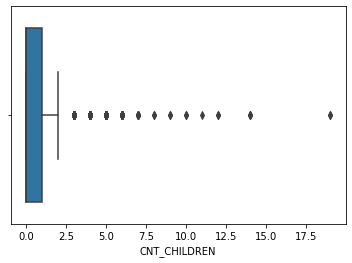

In [ ]:
#Checking for Outliers
sns.boxplot(df['CNT_CHILDREN'])
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


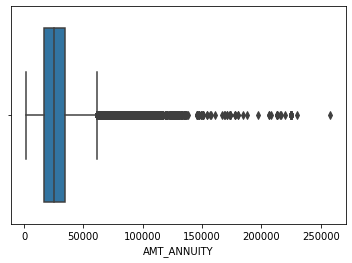

In [ ]:
#Checking for Outliers
sns.boxplot(df.AMT_ANNUITY)
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


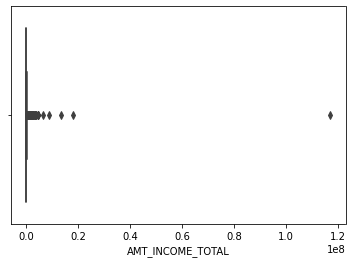

In [ ]:
#Checking for Outliers
sns.boxplot(df['AMT_INCOME_TOTAL'])
plt.show()

In [10]:
#separating numeric and categorical features
numeric_data = df.select_dtypes(include=[np.number])
categorical_data = df.select_dtypes(exclude=[np.number])

print(numeric_data.shape[1])
print(categorical_data.shape[1])

68
13


In [11]:
#Removing outliers and storing the treated columns into original dataframe
standard_deviations = 3
numeric_data=numeric_data[numeric_data.apply(lambda x: np.abs(x - x.mean()) / x.std() < standard_deviations).all(axis=1)]
df.select_dtypes('number').columns = numeric_data.columns

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


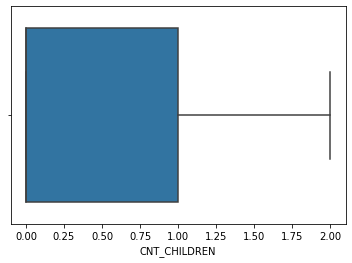

In [ ]:
sns.boxplot(numeric_data['CNT_CHILDREN'])
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


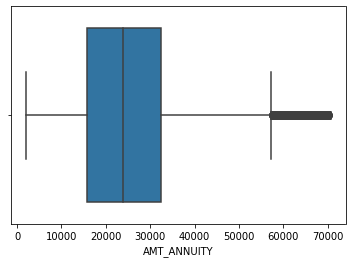

In [ ]:
sns.boxplot(numeric_data.AMT_ANNUITY)
plt.show()

In [ ]:
#Alternative Old School Method to remove outliers
#Calculating IQR
Q1 = np.percentile(df['AMT_ANNUITY'], 25,
                   interpolation = 'midpoint')
 
Q3 = np.percentile(df['AMT_ANNUITY'], 75,
                   interpolation = 'midpoint')
IQR = Q3 - Q1
# Upper bound
upper = np.where(df['AMT_ANNUITY'] >= (Q3+1.5*IQR))
# Lower bound
lower = np.where(df['AMT_ANNUITY'] <= (Q1-1.5*IQR))
 
''' Removing the Outliers '''
df['AMT_ANNUITY'] = df['AMT_ANNUITY'].drop(upper[0], inplace = True)
df['AMT_ANNUITY'] = df['AMT_ANNUITY'].drop(lower[0], inplace = True)

#Data Imbalance

In [12]:
#Imbalance Ratio
target0_df=df.loc[df["TARGET"]==0]
target1_df=df.loc[df["TARGET"]==1]
round(len(target0_df)/len(target1_df),2)

11.39

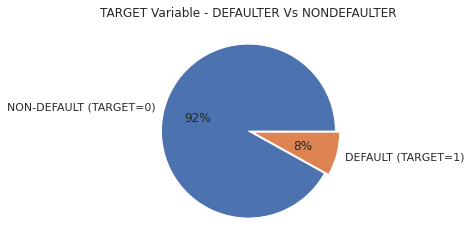

In [ ]:
plt.pie(df['TARGET'].value_counts(normalize=True)*100,labels=['NON-DEFAULT (TARGET=0)','DEFAULT (TARGET=1)'],explode=(0,0.05),autopct='%1.f%%')
plt.title('TARGET Variable - DEFAULTER Vs NONDEFAULTER')
plt.show()

#Feature Engineering:
Extracting information from the existing data and creating new columns

In [13]:
#Converting days to years upto 2 decimal places
df['AGE_IN_YEARS'] = round(df['DAYS_BIRTH']/365,2)

#Converting days to years upto 2 decimal places
df['EMPLOYMENT_YEARS'] = round(df['DAYS_EMPLOYED']/365,2)

# Creating a Bucket for age
#df['AGE_IN_YEARS_RANGE'] = pd.cut(df['AGE_IN_YEARS'],bins=[0,20,25,30,35,40,45,50,55,60,65,70],labels=["0-20",'20-25','25-30','30-35','35-40','40-45','45-50','50-55','55-60','60-65','above 65'])

# Creating a Bucket for Employment years
#df['EMPLOYMENT_YEARS_RANGE'] = pd.cut(df['EMPLOYMENT_YEARS'],bins=[0,5,10,15,20,25,30,35,40,45,50,55],labels=["0-5",'5-10','10-15','15-20','20-25','25-30','30-35','35-40','40-45','45-50','above 50'])

#Converting to lakhs upto 2 decimal places
df['AMT_INCOME_TOTAL_in_lakhs'] = round(df['AMT_INCOME_TOTAL']/100000,2)

#Converting to lakhs upto 2 decimal places
df['AMT_CREDIT_in_lakhs'] = round(df['AMT_CREDIT']/100000,2)

#Creating buckets
#df['AMT_CREDIT_in_lakhs_Range'] = pd.cut(df['AMT_CREDIT_in_lakhs'],bins = [0,5,10,15,20,25,30,35,40,45], labels = ['0-5L','5-10L','10-15L','15-20L','20-25L','25-30L','30-35L','35-40L','Above 40L'])

# Creating a Bucket for AMT_INCOME_TOTAL
#df['AMT_INCOME_TOTAL_RANGE'] = pd.cut(df['AMT_INCOME_TOTAL_in_lakhs'],bins = [0,1,2,3,4,5,6,7,8,9,10,100], labels = ['0-1L','1-2L','2-3L','3-4L','4-5L','5-6L','6-7L','7-8L','8-9L','9-10L','Above 10L'])

#Remove rogue outlier values to prevent distortions in analysis
df['EMPLOYMENT_YEARS'] = df.EMPLOYMENT_YEARS.replace(df.EMPLOYMENT_YEARS.max(),np.NaN)

#Add a column to understand the ratio
df['Credit_Ratio'] = round(df.AMT_CREDIT/df.AMT_INCOME_TOTAL,2)
#df['Credit_Ratio'].head()

In [ ]:
df.sample(6)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE_IN_YEARS,EMPLOYMENT_YEARS,AGE_IN_YEARS_RANGE,AMT_INCOME_TOTAL_in_lakhs,AMT_CREDIT_in_lakhs,Credit_Ratio
12115,114130,0,Cash loans,F,N,Y,0,90000.0,381528.0,24840.0,...,0.0,0.0,0.0,0.0,41.81,4.62,40-45,0.90,3.82,4.24
203752,336218,0,Cash loans,M,Y,N,0,315000.0,1125000.0,36292.5,...,0.0,0.0,0.0,1.0,30.07,4.57,30-35,3.15,11.25,3.57
226007,361772,0,Cash loans,M,N,Y,0,90000.0,225000.0,24363.0,...,0.0,0.0,0.0,5.0,67.89,NaN,above 65,0.90,2.25,2.50
82189,195313,0,Cash loans,F,N,N,1,112500.0,450000.0,20979.0,...,0.0,0.0,2.0,3.0,25.06,2.51,25-30,1.12,4.50,4.00
295388,442222,0,Cash loans,M,Y,Y,1,117000.0,225000.0,11911.5,...,0.0,0.0,0.0,0.0,27.39,5.85,25-30,1.17,2.25,1.92
90163,204678,0,Cash loans,F,Y,Y,0,180000.0,555273.0,16366.5,...,0.0,0.0,0.0,0.0,55.94,NaN,55-60,1.80,5.55,3.08


In [14]:
#separating numeric and categorical features
numeric_data = df.select_dtypes(include=[np.number])
categorical_data = df.select_dtypes(exclude=[np.number])

In [15]:
#Strategy : Median for numeric columns and Mode imputation for Object or Categorical ones
for i in df.columns:
  if (df[i].dtype=='float64') | (df[i].dtype=='int64'):
    df[i].fillna(df[i].median(), inplace=True)
  else:
    df[i].fillna(df[i].mode()[0], inplace=True)

In [16]:
print("Shape of the dataset: ", df.shape)
print("Number of numeric columns: ", numeric_data.shape[1])
print("Number of categorical features: ", categorical_data.shape[1])
print("Number of null values: ",df.isnull().sum().sum())

Shape of the dataset:  (307511, 86)
Number of numeric columns:  73
Number of categorical features:  13
Number of null values:  0


#Segmented Analysis

Finding the top 10 correlated features in the numeric dataset

In [23]:
numeric_data2 = numeric_data.copy()

In [24]:
# Select lower triangle of correlation matrix
corr_matrix = numeric_data2.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
# Find index of feature columns with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  This is separate from the ipykernel package so we can avoid doing imports until


In [25]:
# Drop features 
numeric_data2 = numeric_data2.drop(numeric_data2[to_drop], axis=1)

In [26]:
def get_redundant_pairs(df):
    '''Get diagonal and lower triangular pairs of correlation matrix'''
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

def get_top_abs_correlations(df, n=10):
    au_corr = df.corr().abs().unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[0:n]

print("Top Absolute Correlations")
print(get_top_abs_correlations(numeric_data2, 10))

Top Absolute Correlations
CNT_CHILDREN                CNT_FAM_MEMBERS                0.879160
REG_REGION_NOT_WORK_REGION  LIVE_REGION_NOT_WORK_REGION    0.860627
DEF_30_CNT_SOCIAL_CIRCLE    DEF_60_CNT_SOCIAL_CIRCLE       0.860556
REG_CITY_NOT_WORK_CITY      LIVE_CITY_NOT_WORK_CITY        0.825575
AMT_CREDIT                  AMT_ANNUITY                    0.770127
                            Credit_Ratio                   0.651096
FLOORSMAX_AVG               TOTALAREA_MODE                 0.648137
DAYS_BIRTH                  DAYS_EMPLOYED                  0.623941
DAYS_EMPLOYED               FLAG_DOCUMENT_6                0.597951
REGION_POPULATION_RELATIVE  REGION_RATING_CLIENT           0.532877
dtype: float64


In [34]:
get_top_abs_correlations(numeric_data2, 10).to_frame().style.background_gradient(cmap='coolwarm').set_precision(3)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  """Entry point for launching an IPython kernel.


#Checking top 10 correlations influened to the customers with payment difficulties

In [20]:
target0_df=df.loc[df["TARGET"]==0]
target1_df=df.loc[df["TARGET"]==1]

In [21]:
target_payment_difficulties = target1_df.copy()

In [27]:
target_payment_difficulties = target_payment_difficulties.drop(target_payment_difficulties[to_drop], axis=1)
target_payment_difficulties.select_dtypes('number').columns = numeric_data2.columns

In [28]:
cat_df = target_payment_difficulties.select_dtypes('object')
dfDummies = pd.get_dummies(cat_df,drop_first=True)

In [29]:
target_payment_difficulties = target_payment_difficulties.drop(target_payment_difficulties.select_dtypes('object'),axis=1)
target_payment_difficulties = pd.concat([target_payment_difficulties,dfDummies],axis=1)

In [ ]:
print("Top Absolute Correlations")
print(get_top_abs_correlations(target_payment_difficulties, 10))

Top Absolute Correlations
DAYS_EMPLOYED                         ORGANIZATION_TYPE_XNA                                0.999892
NAME_INCOME_TYPE_Pensioner            ORGANIZATION_TYPE_XNA                                0.998478
DAYS_EMPLOYED                         NAME_INCOME_TYPE_Pensioner                           0.998371
CNT_CHILDREN                          CNT_FAM_MEMBERS                                      0.885484
DEF_30_CNT_SOCIAL_CIRCLE              DEF_60_CNT_SOCIAL_CIRCLE                             0.869016
REG_REGION_NOT_WORK_REGION            LIVE_REGION_NOT_WORK_REGION                          0.847885
NAME_EDUCATION_TYPE_Higher education  NAME_EDUCATION_TYPE_Secondary / secondary special    0.842219
NAME_TYPE_SUITE_Family                NAME_TYPE_SUITE_Unaccompanied                        0.798179
REG_CITY_NOT_WORK_CITY                LIVE_CITY_NOT_WORK_CITY                              0.778540
AMT_CREDIT                            AMT_ANNUITY                         

In [36]:
get_top_abs_correlations(target_payment_difficulties, 10).to_frame().style.background_gradient(cmap='coolwarm').set_precision(3)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  """Entry point for launching an IPython kernel.


,,0
DAYS_EMPLOYED,ORGANIZATION_TYPE_XNA,1.000
NAME_INCOME_TYPE_Pensioner,ORGANIZATION_TYPE_XNA,0.998
DAYS_EMPLOYED,NAME_INCOME_TYPE_Pensioner,0.998
CNT_CHILDREN,CNT_FAM_MEMBERS,0.885
DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,0.869
REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,0.848
NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Secondary / secondary special,0.842
NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Unaccompanied,0.798
REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,0.779
AMT_CREDIT,AMT_ANNUITY,0.752


Comparison on mean values

In [17]:
target_all_other_cases = target0_df.copy()
target_payment_difficulties = target1_df.copy()

In [ ]:
from statistics import mean
print("Mean value of amount annuity for all customers: ",round(mean(df['AMT_ANNUITY']),2))
print("Mean value of amount annuity for target_payment_difficulties customers: ",round(mean(target_payment_difficulties['AMT_ANNUITY']),2))
print("Mean value of amount annuity for target_all_other_cases: ",round(mean(target_all_other_cases['AMT_ANNUITY']),2))

Mean value of amount annuity for all customers:  27108.49
Mean value of amount annuity for target_payment_difficulties customers:  26481.74
Mean value of amount annuity for target_all_other_cases:  27163.53


In [ ]:
from statistics import median
print("Median value of age(years) for all customers: ",round(median(df['AGE_IN_YEARS']),2))
print("Median value of age(years) annuity for target_payment_difficulties customers: ",round(median(target_payment_difficulties['AGE_IN_YEARS']),2))
print("Median value of age(years) annuity for target_all_other_cases: ",round(median(target_all_other_cases['AGE_IN_YEARS']),2))

Median value of age(years) for all customers:  43.15
Median value of age(years) annuity for target_payment_difficulties customers:  39.13
Median value of age(years) annuity for target_all_other_cases:  43.5


In [ ]:
from statistics import mean
print("Mean value of amount income for all customers: ",round(mean(df['AMT_INCOME_TOTAL']),2))
print("Mean value of amount income for target_payment_difficulties customers: ",round(mean(target_payment_difficulties['AMT_INCOME_TOTAL']),2))
print("Mean value of amount income for target_all_other_cases: ",round(mean(target_all_other_cases['AMT_INCOME_TOTAL']),2))

Mean value of amount income for all customers:  168797.92
Mean value of amount income for target_payment_difficulties customers:  165611.76
Mean value of amount income for target_all_other_cases:  169077.72


#Observation:
So, we can see mean value of ammount annuity and income and median value of age of the customers with payment difficulties are significantly lower than the customers in general and with all other cases   

#Univariate Analysis

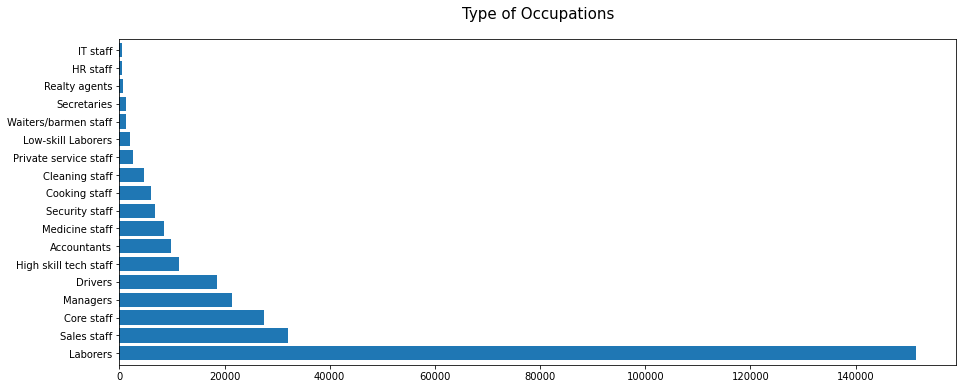

In [ ]:
#Plotting.a bar graph for the variable Occupation Type to understand the disctribution by various occupations
#Imputing null values with "Unknown" as using mode may distort the picture because of presence of large number of null values
#df["OCCUPATION_TYPE"] = df["OCCUPATION_TYPE"].fillna("Unknown")
plt.figure(figsize = [15,6])
df["OCCUPATION_TYPE"].value_counts().plot.barh(width = .8)
plt.title("Type of Occupations", fontdict={"fontsize":15}, pad =20)
plt.show()

Univariate analysis on numeric columns

In [ ]:
def Uni_Analysis_Numarical(dataframe, column):
    sns.set(style='darkgrid')
    plt.figure(figsize=(25, 5))
    
    plt.subplot(1, 3, 1)
    sns.boxplot(data=dataframe, x=column, orient='v').set(title='Box Plot')
    
    plt.subplot(1, 3, 2)
    sns.distplot(dataframe[column].dropna()).set(title='Distplot')
    plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


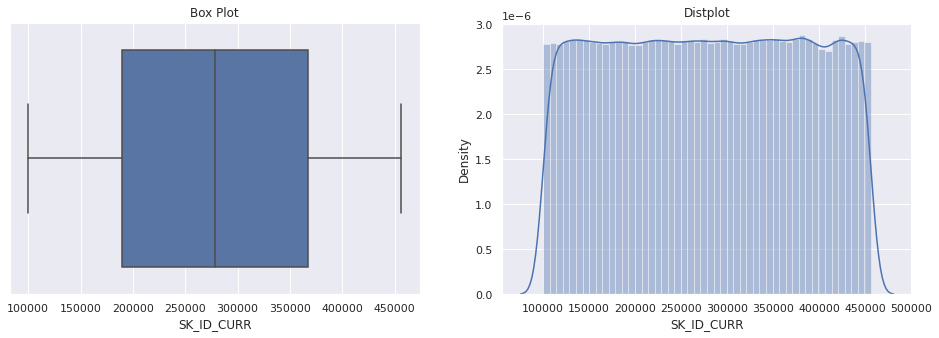

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


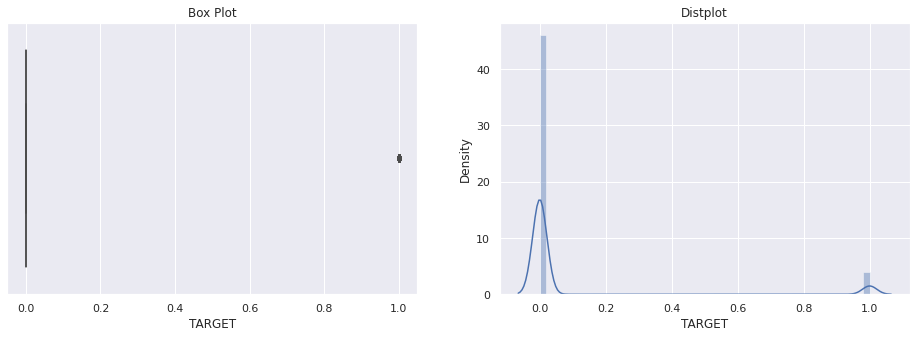

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


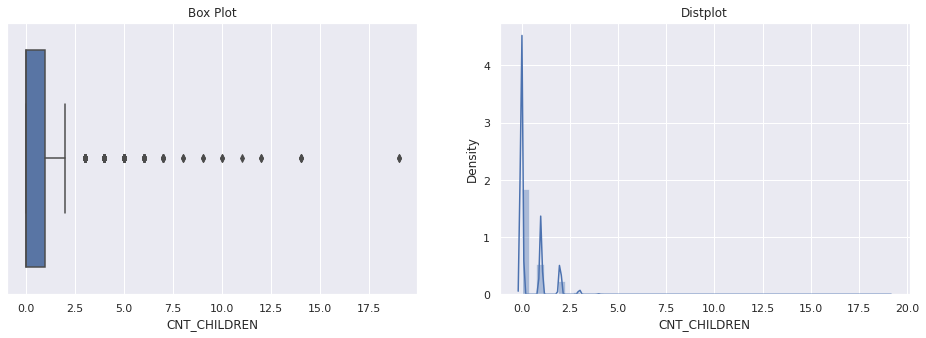

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


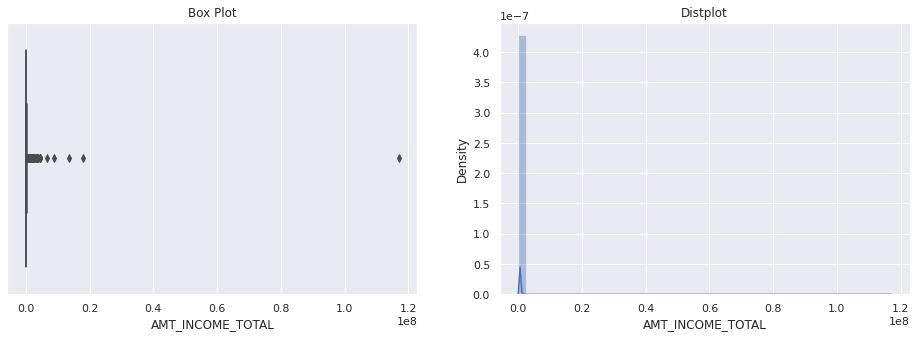

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


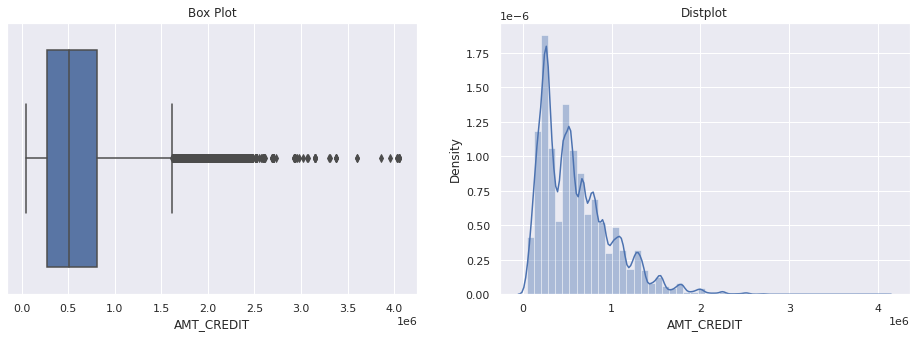

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


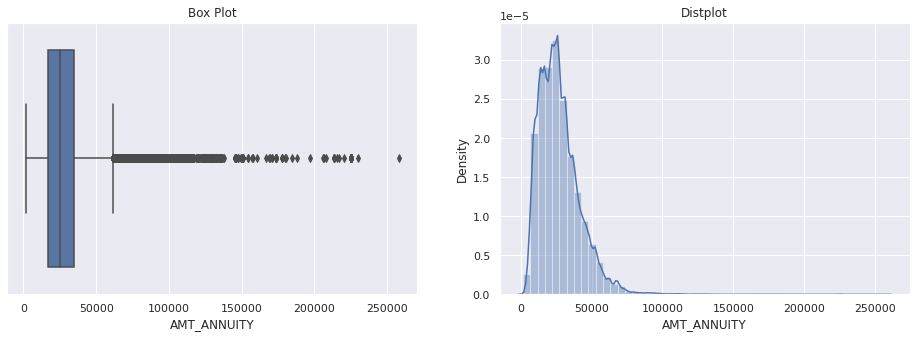

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


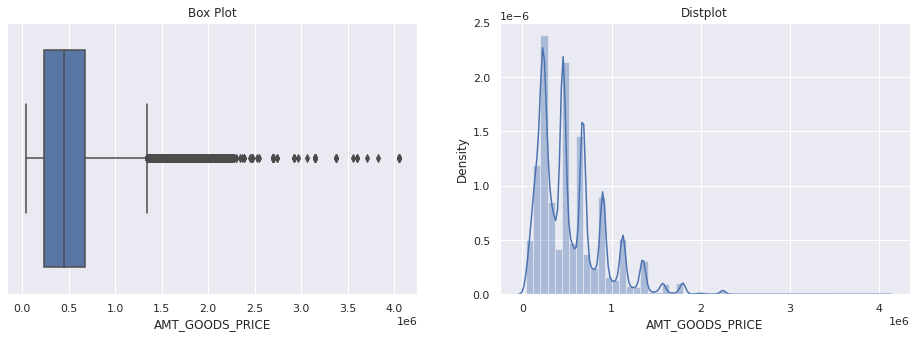

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


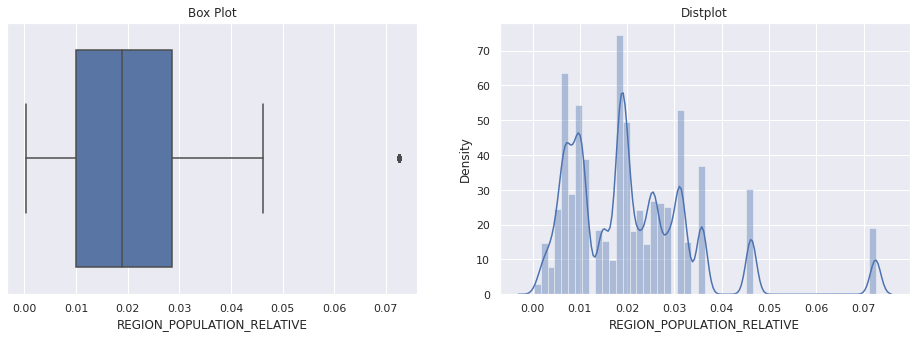

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


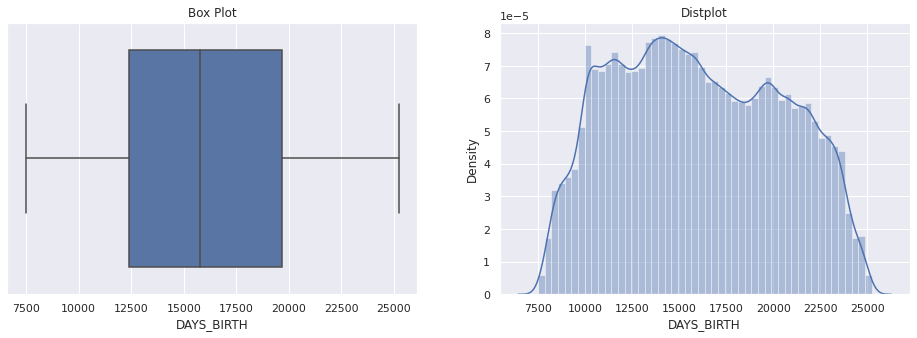

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


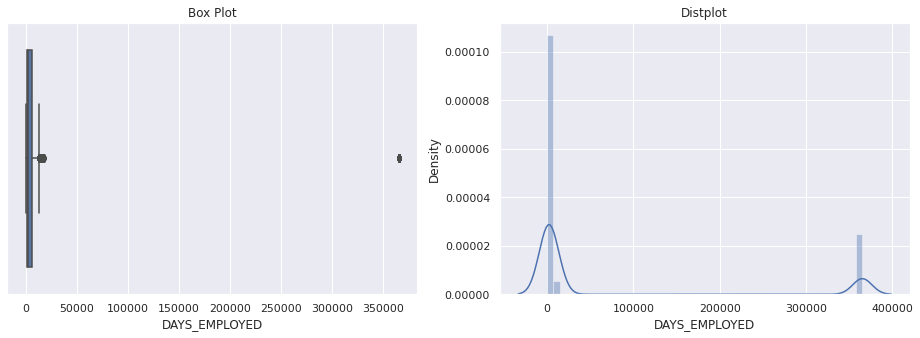

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


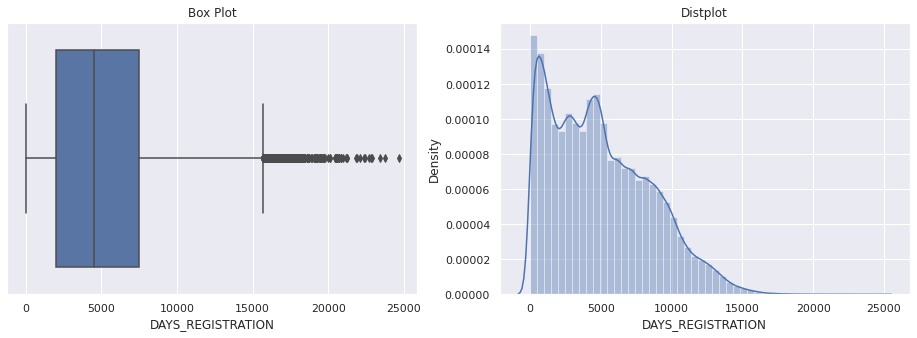

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


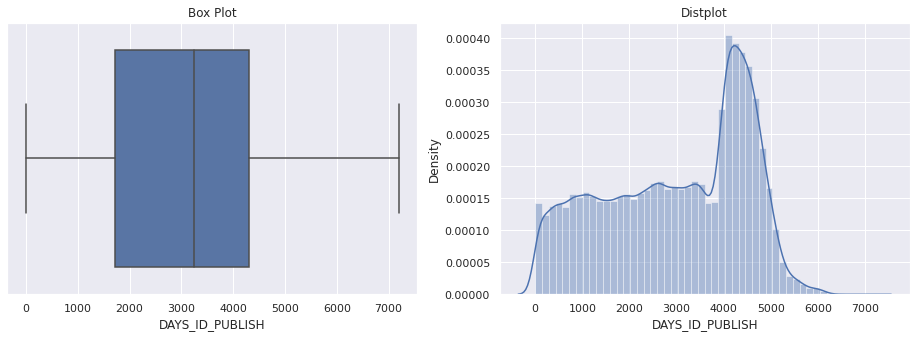

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


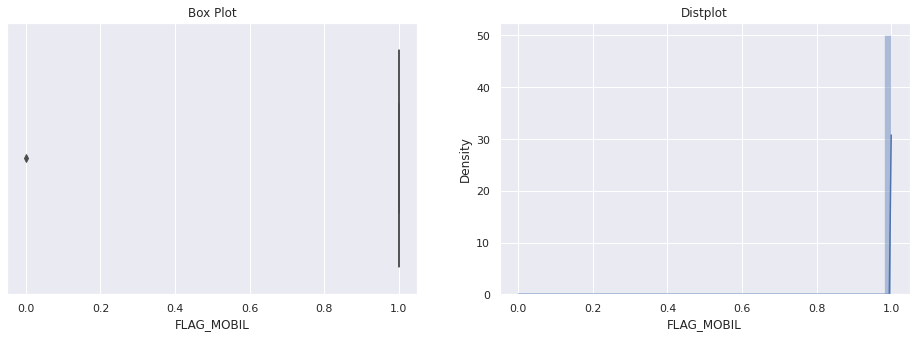

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


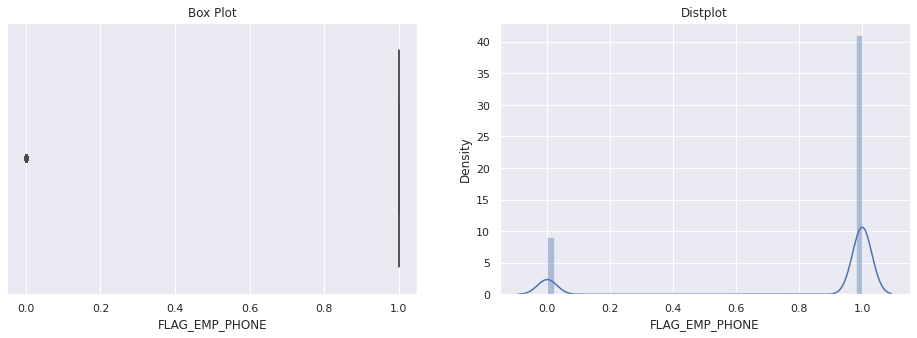

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


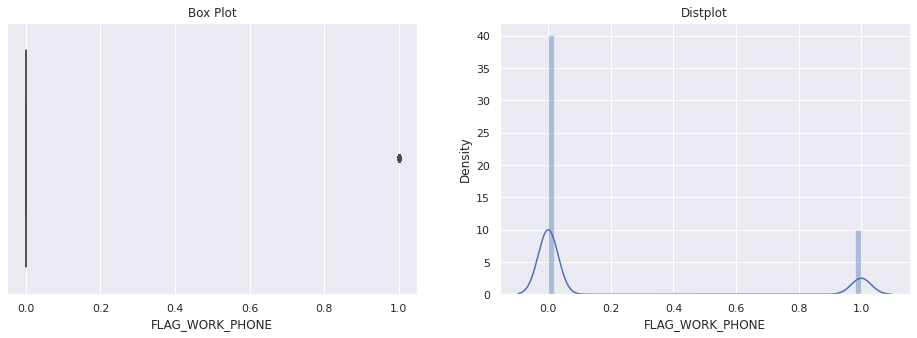

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


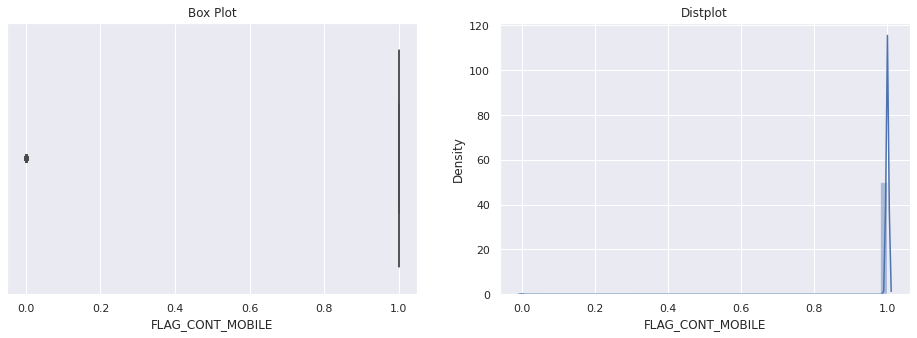

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


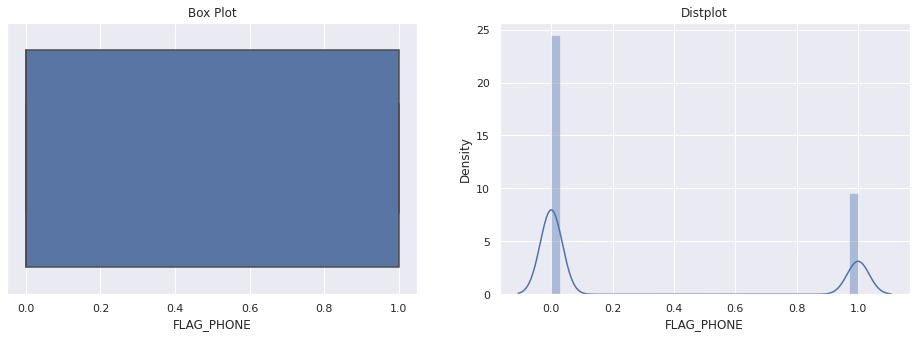

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


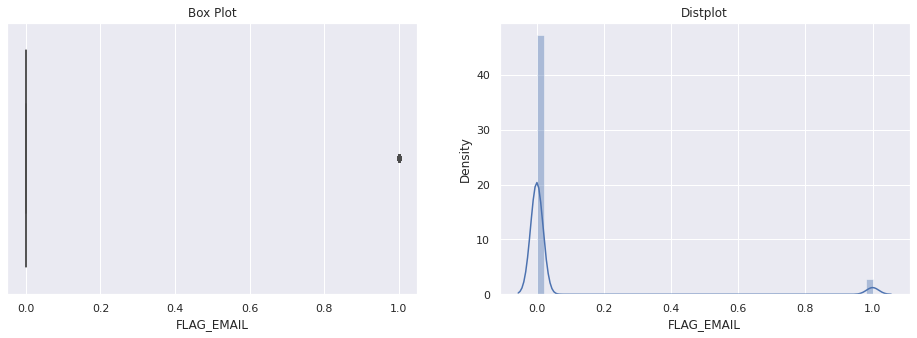

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


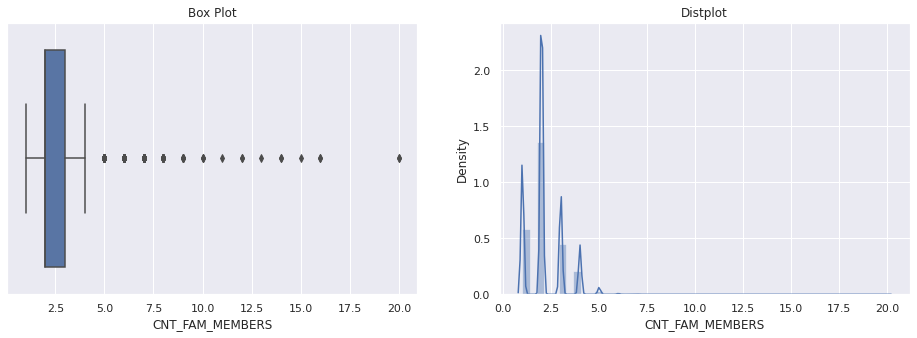

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


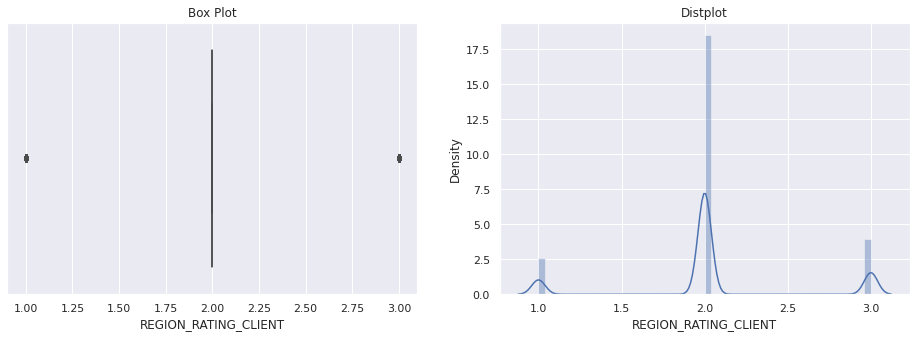

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


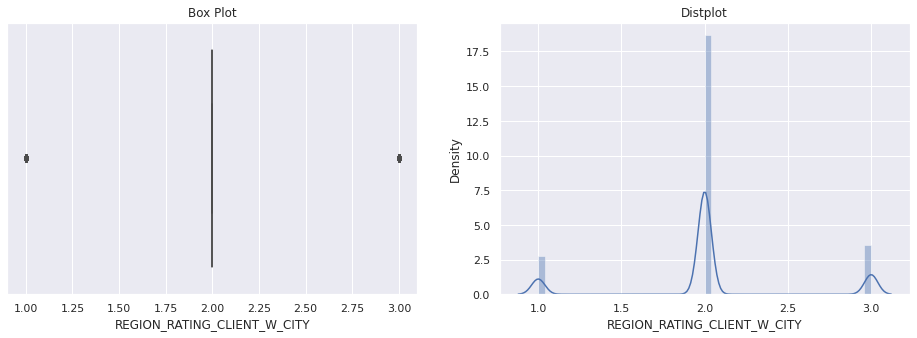

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


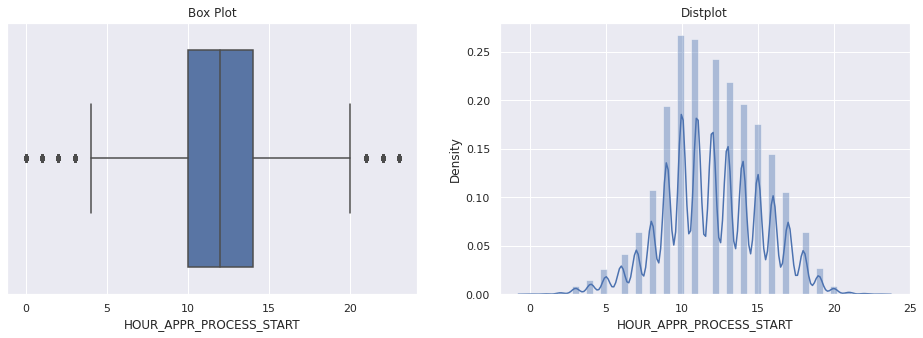

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


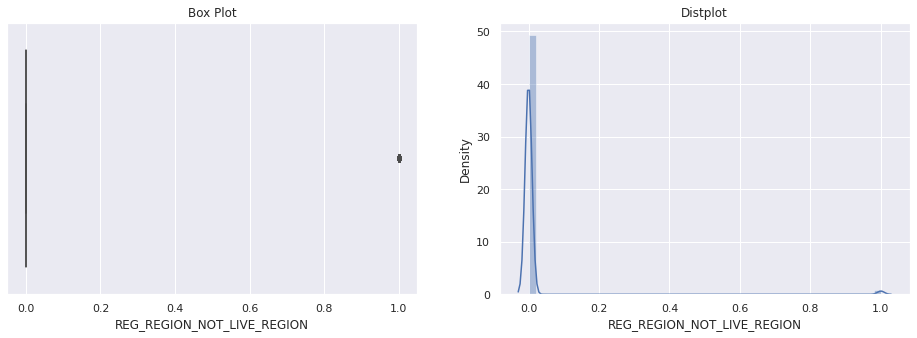

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


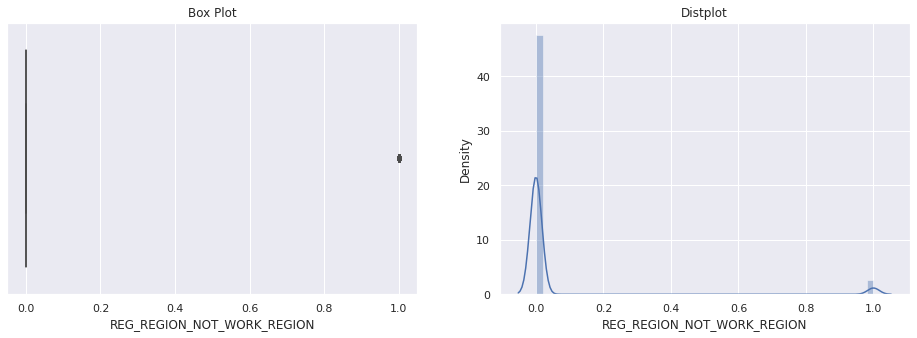

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


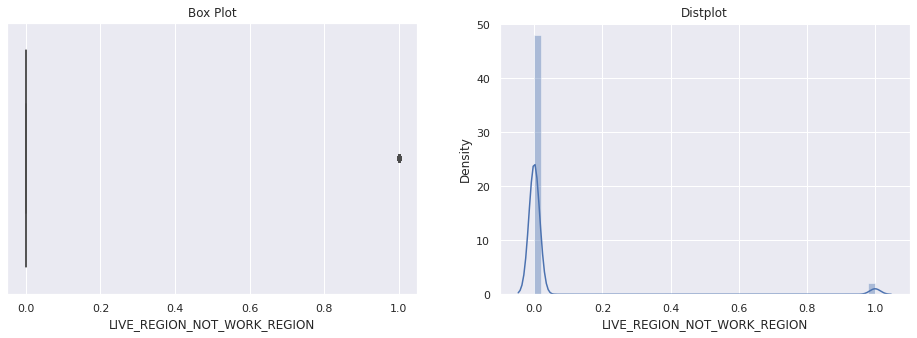

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


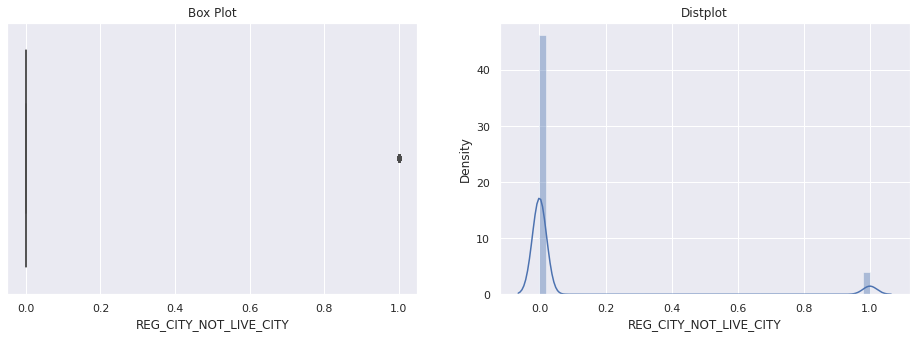

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


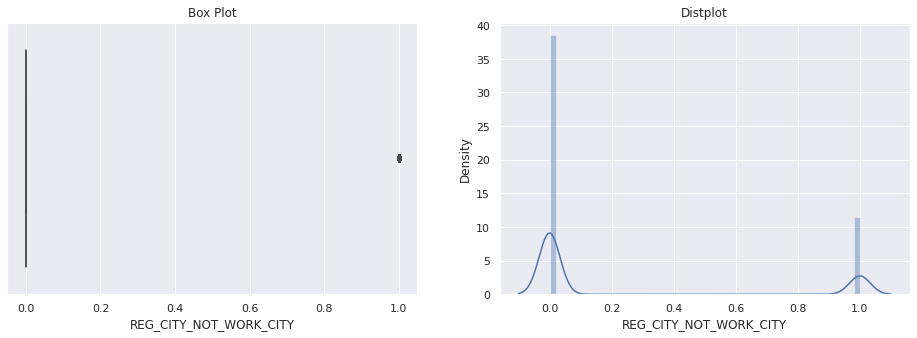

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


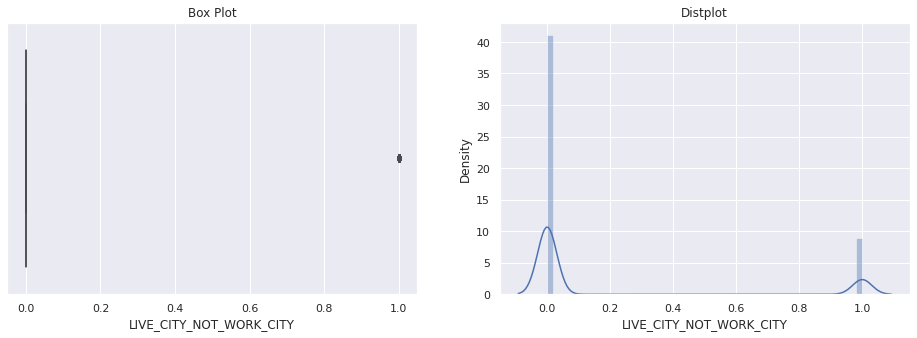

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


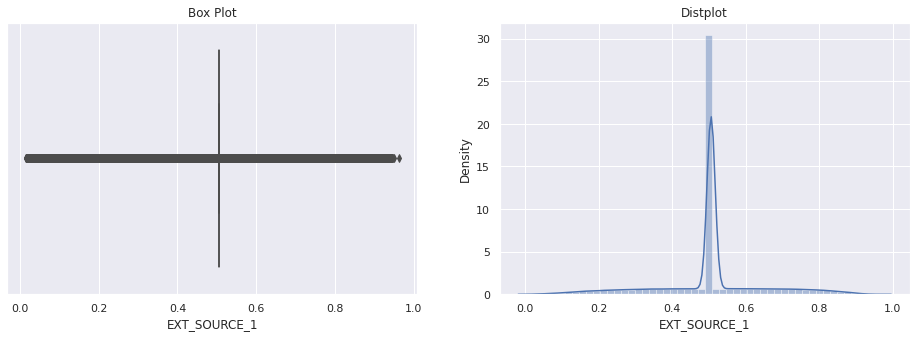

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


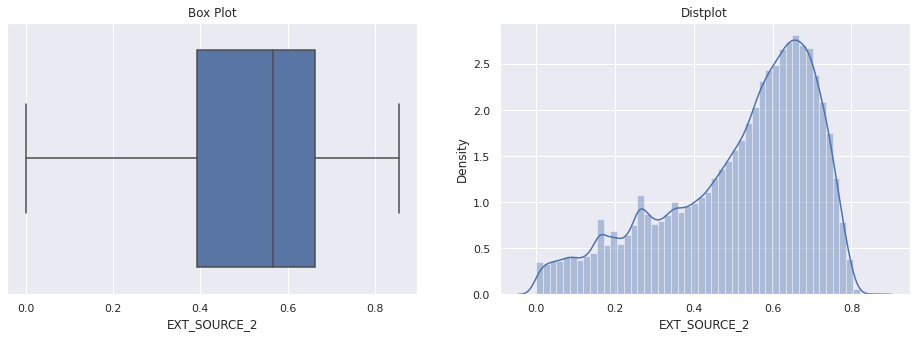

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


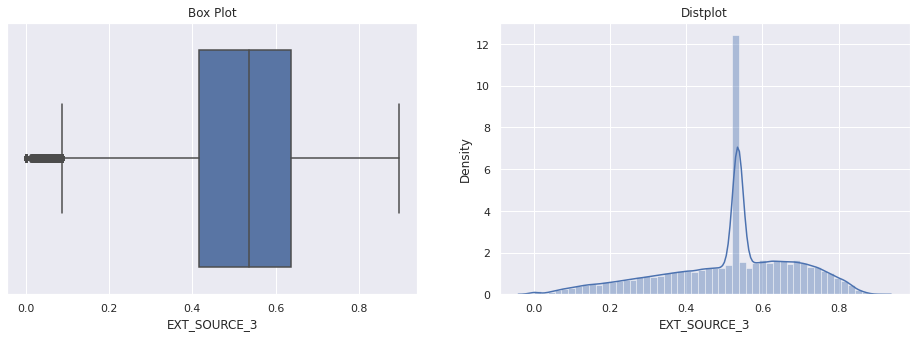

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


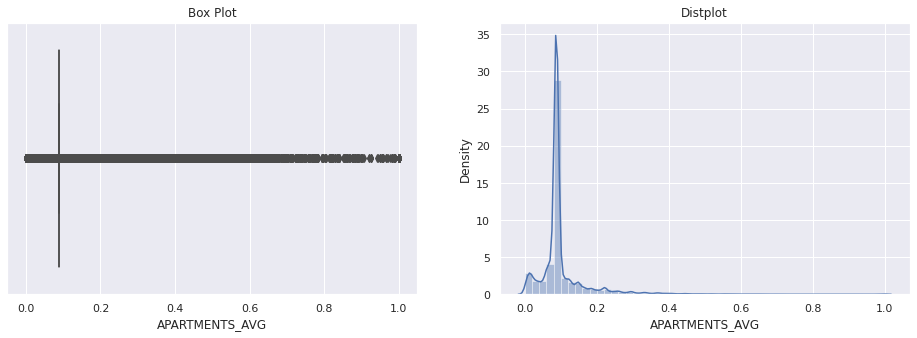

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


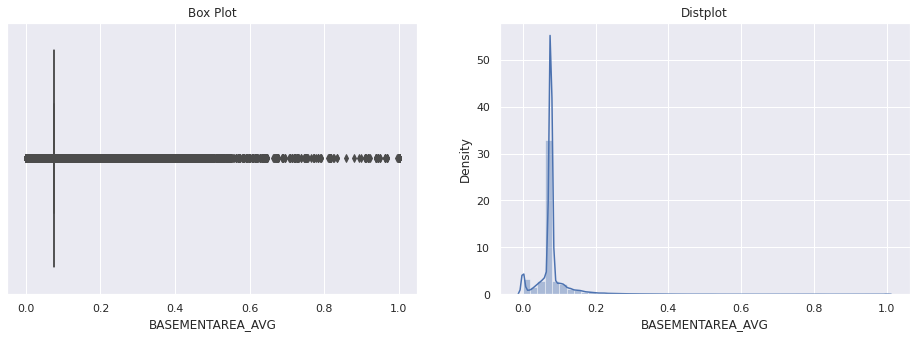

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


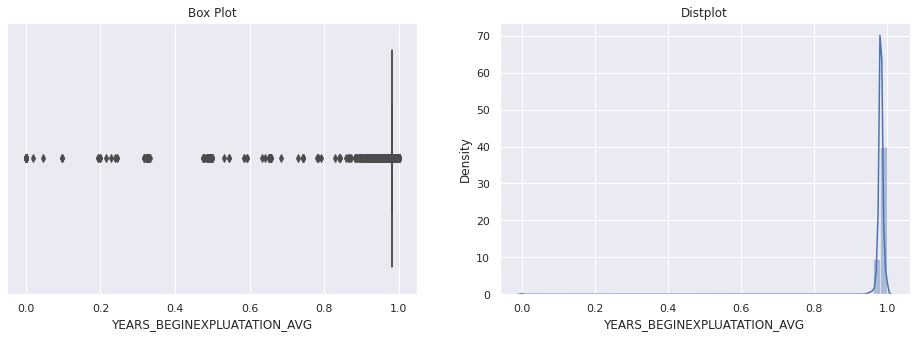

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


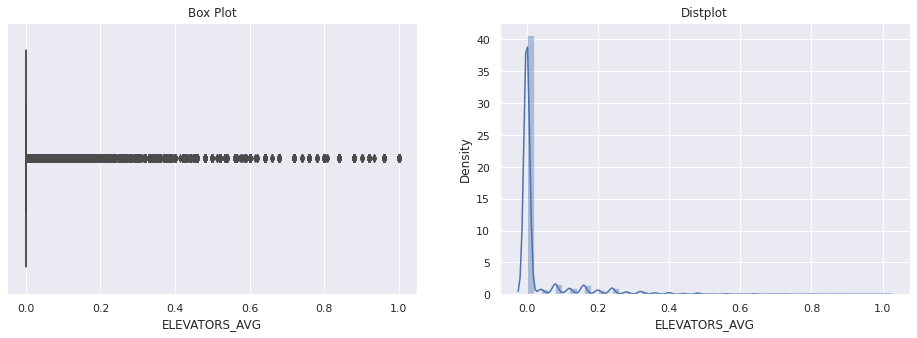

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


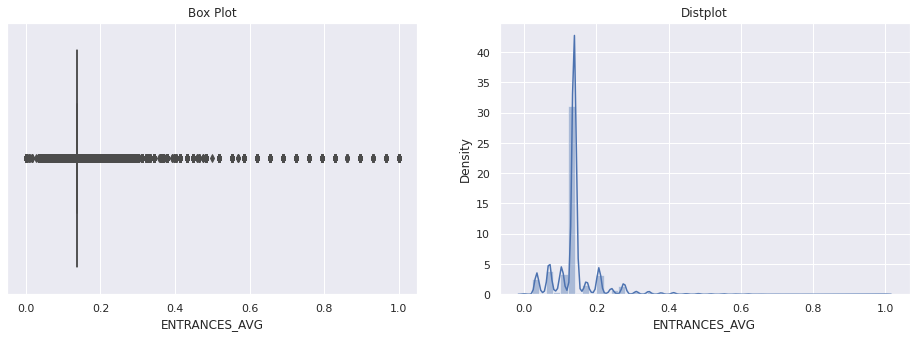

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


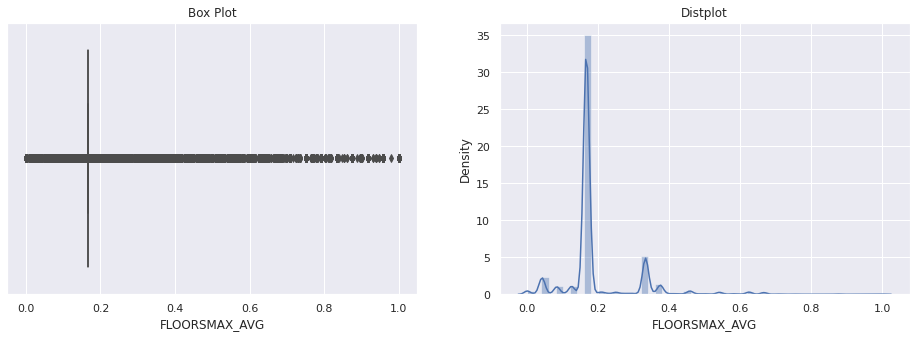

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


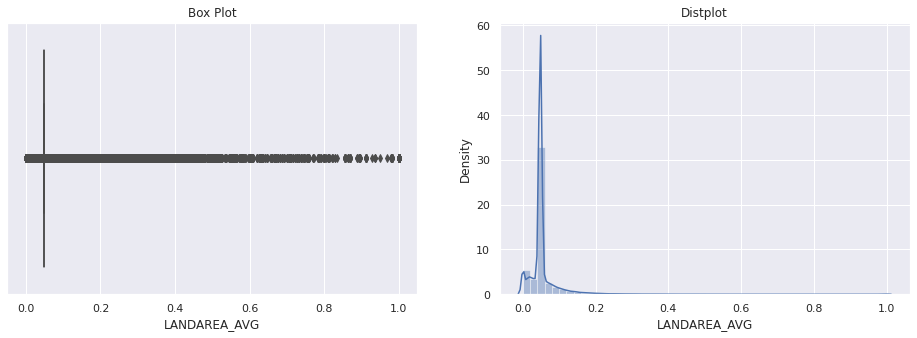

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


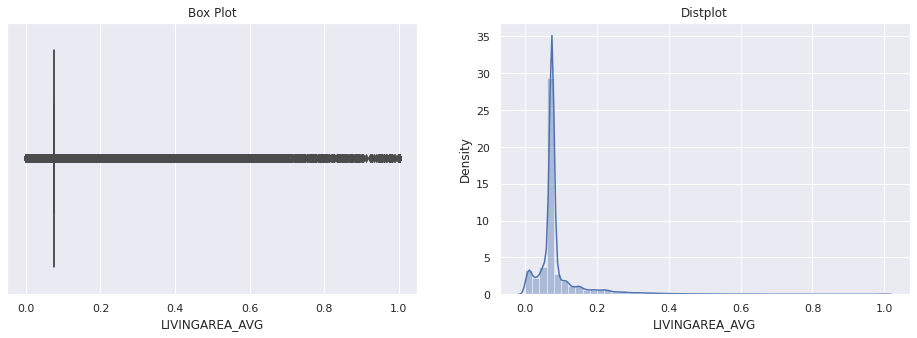

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


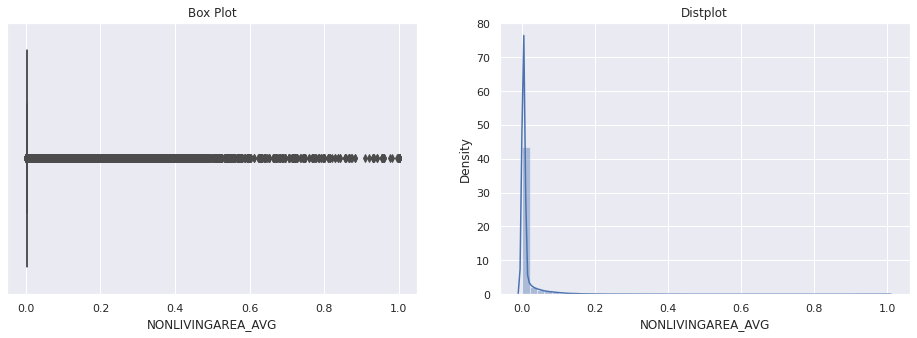

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


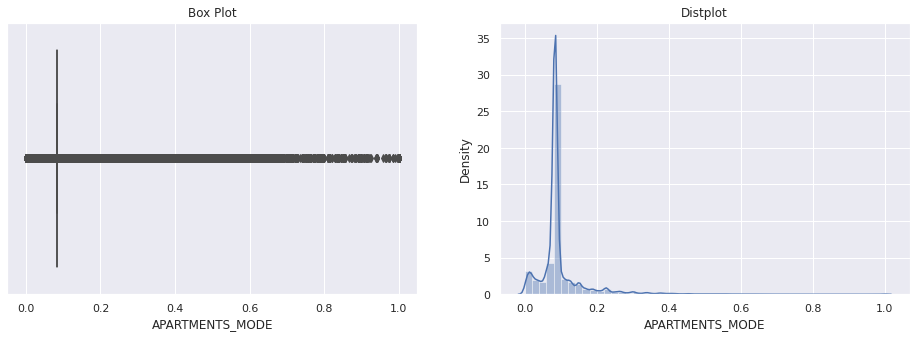

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


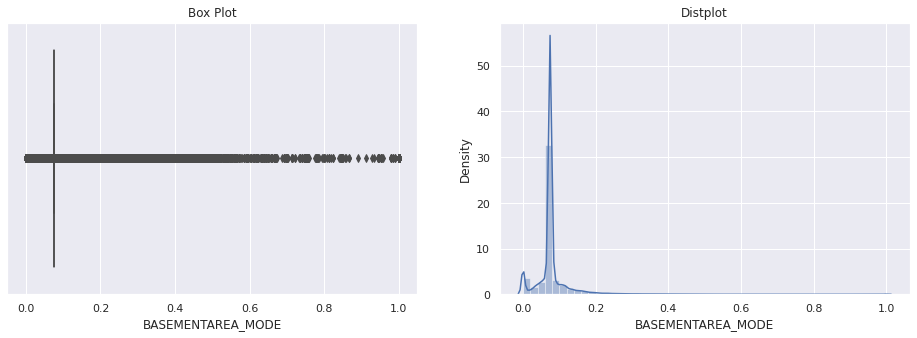

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


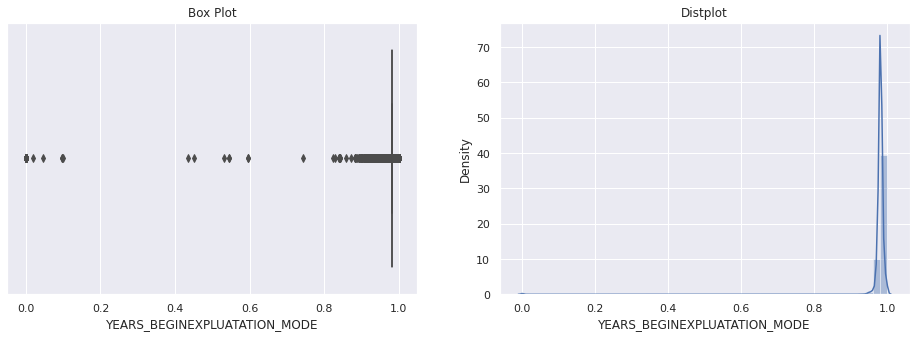

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


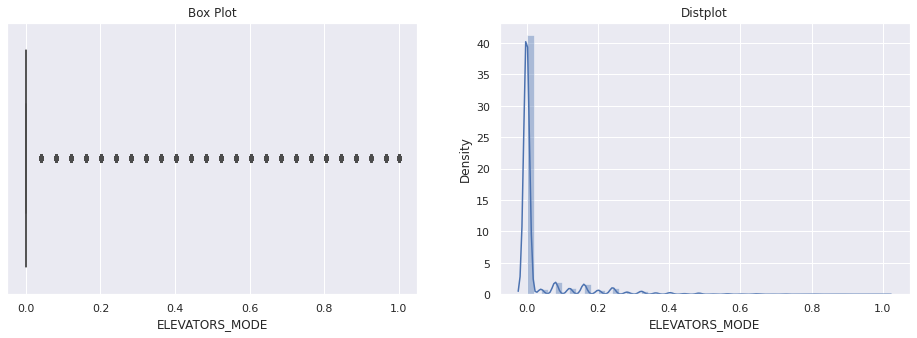

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


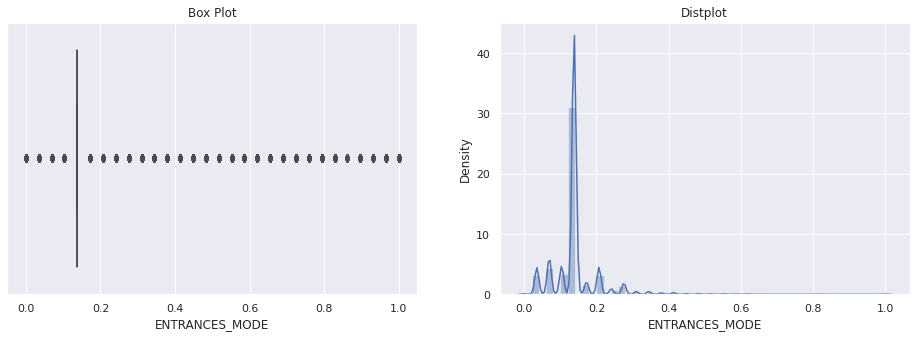

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


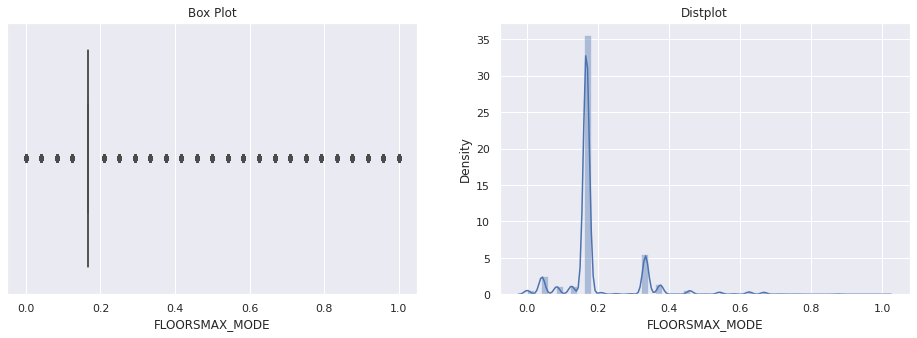

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


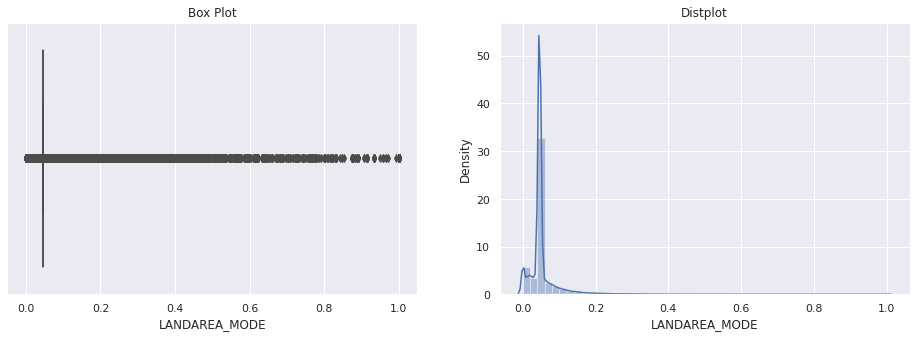

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


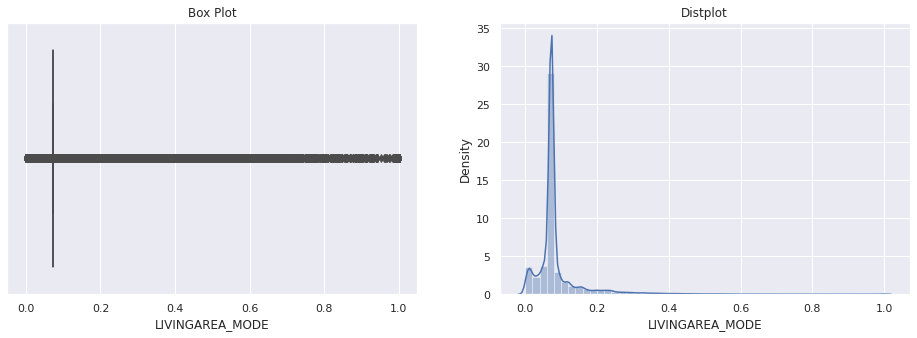

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


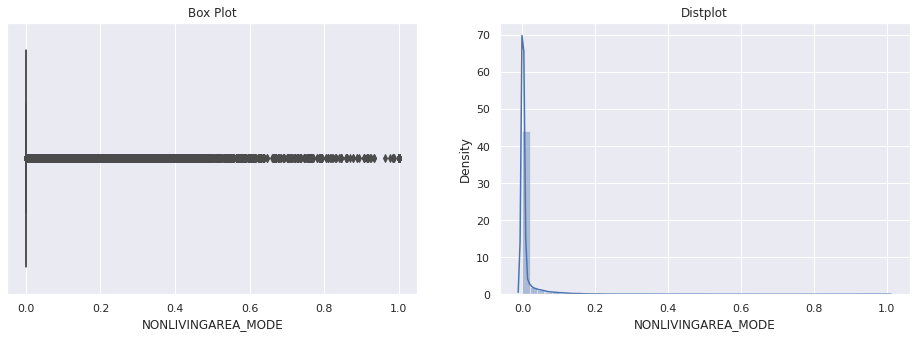

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


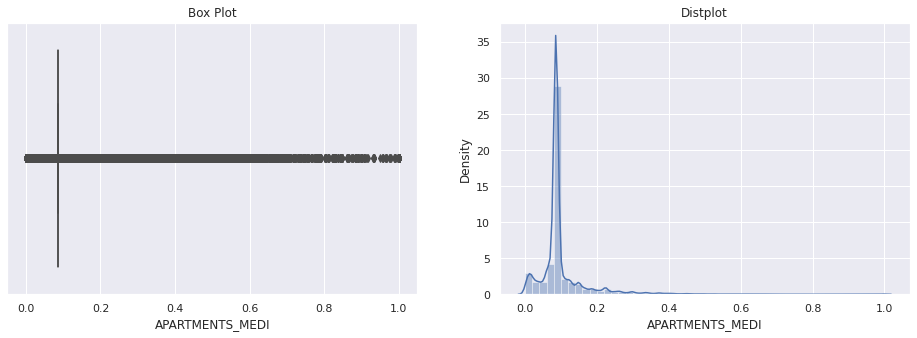

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


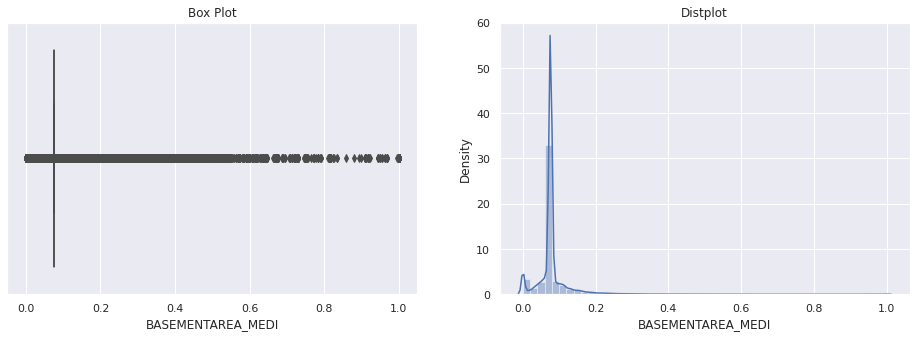

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


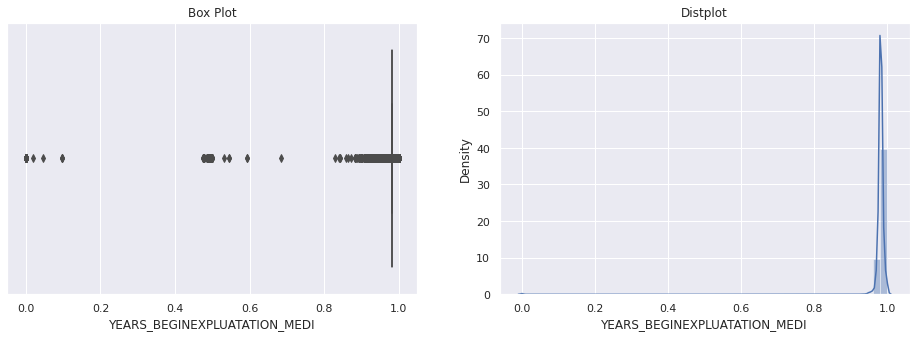

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


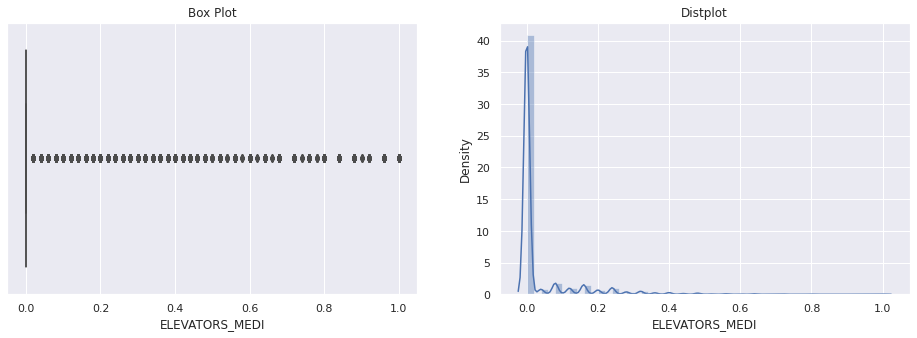

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


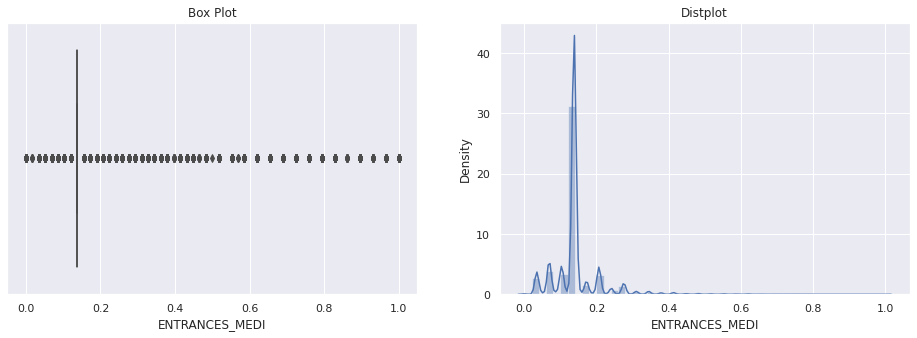

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


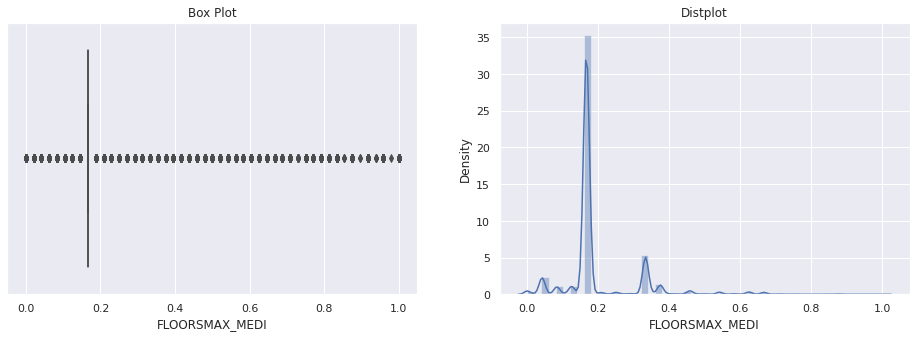

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


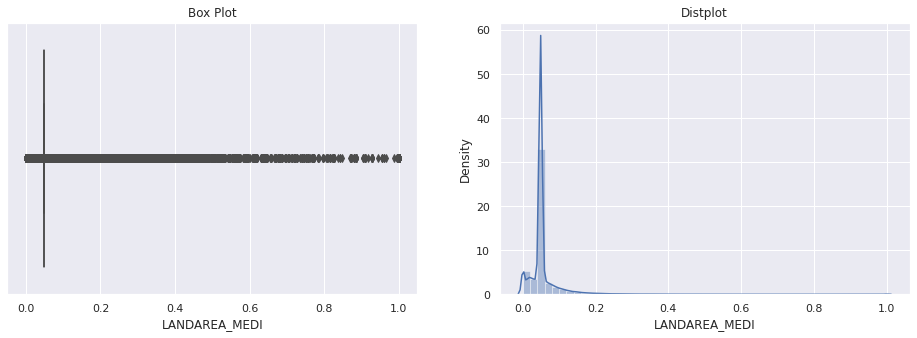

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


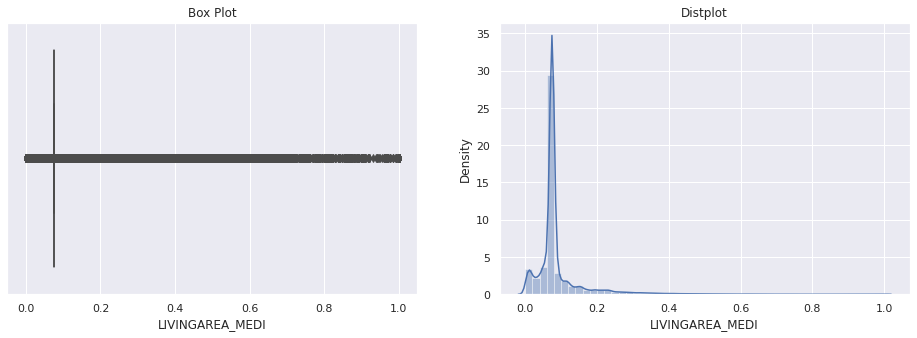

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


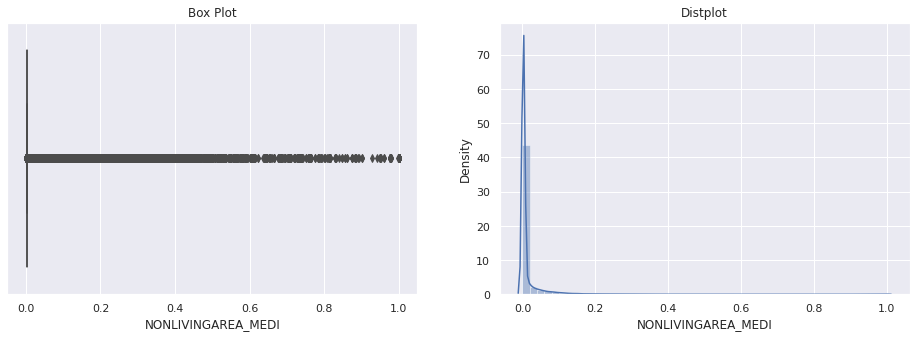

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


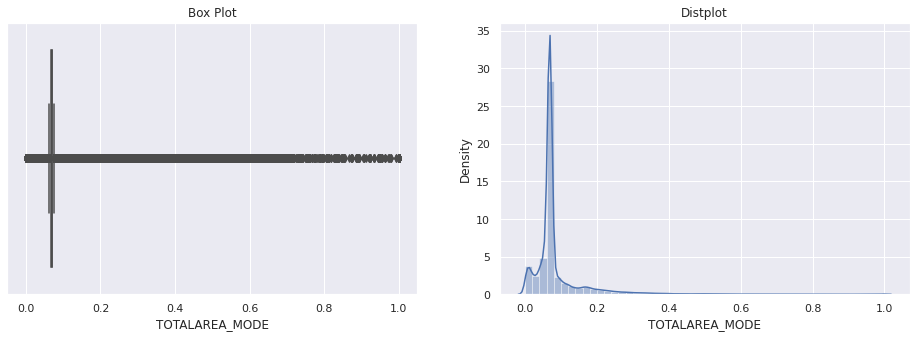

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


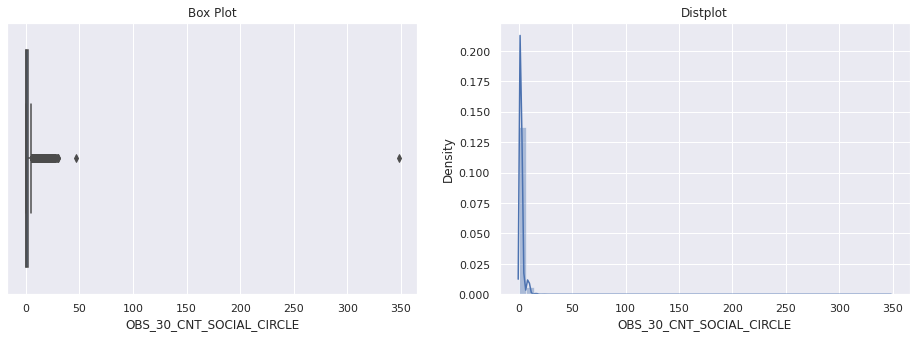

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


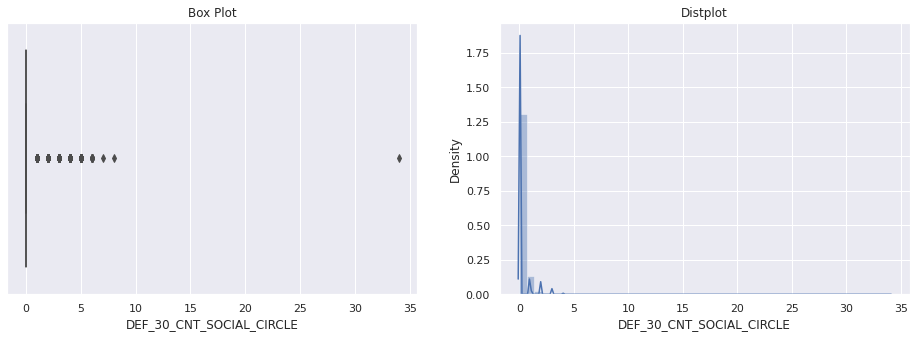

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


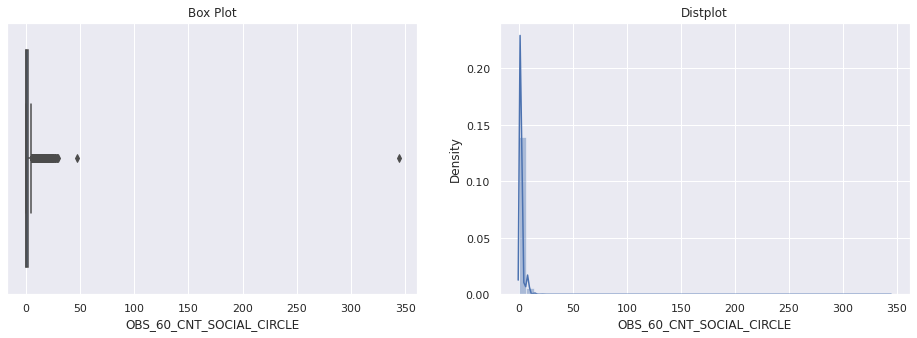

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


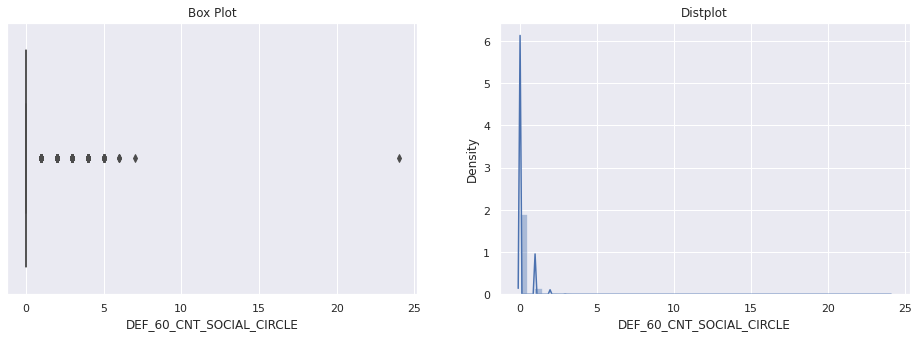

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


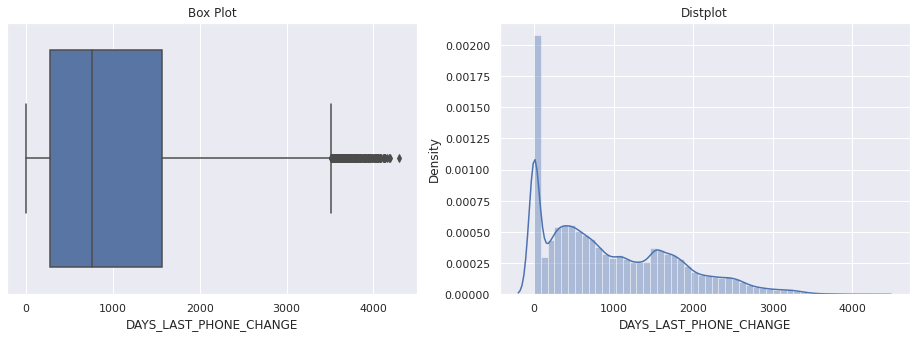

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


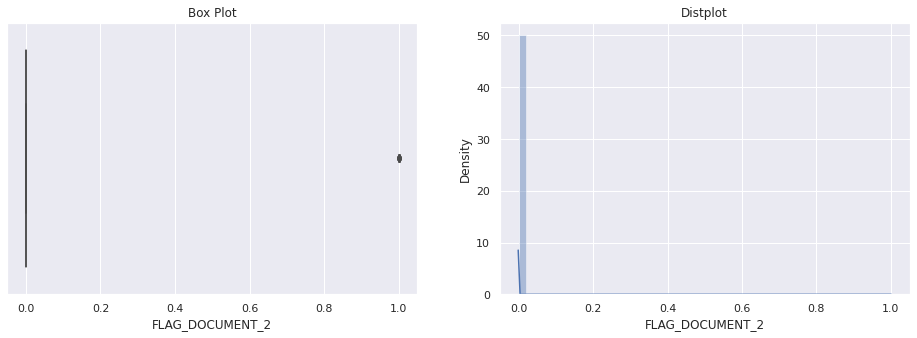

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


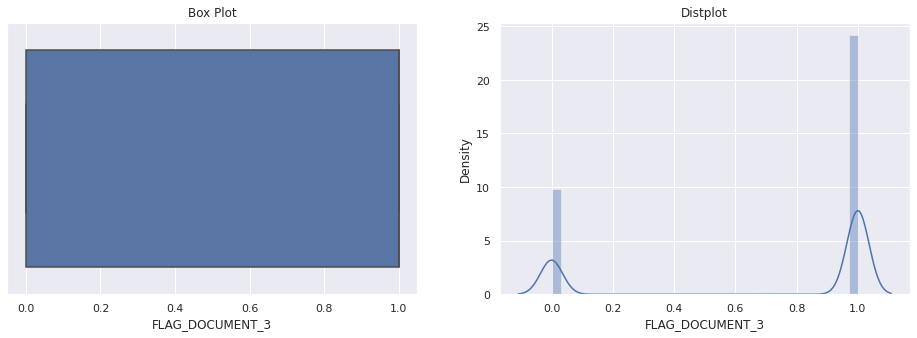

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


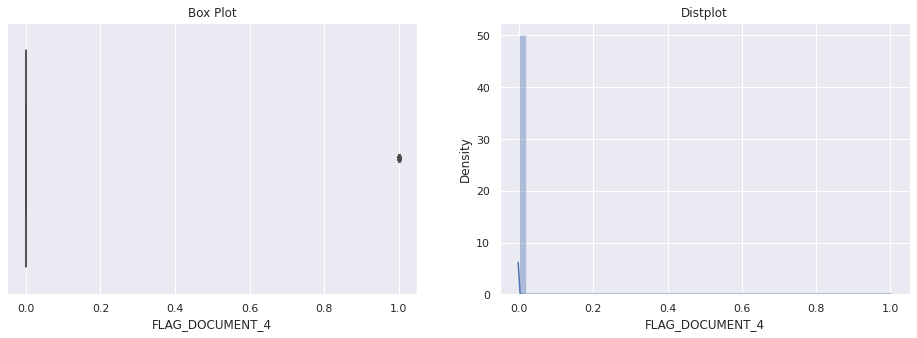

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


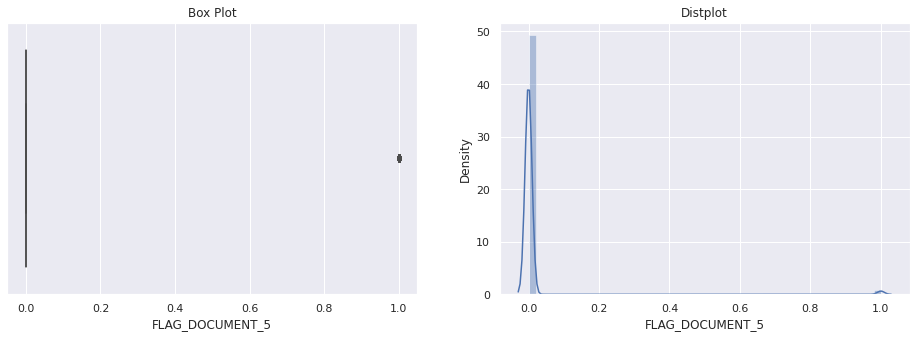

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


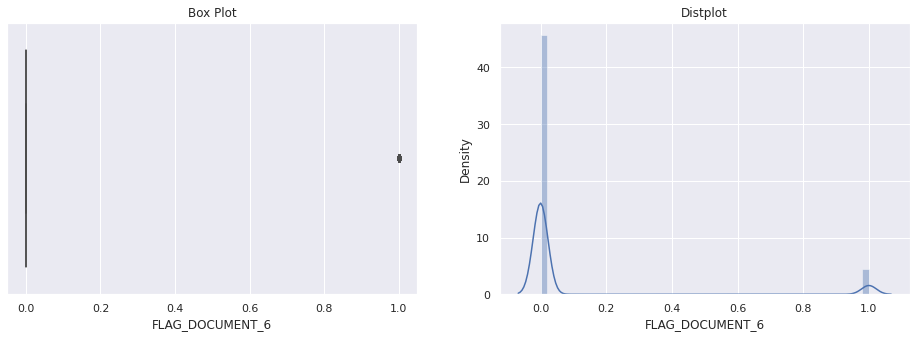

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


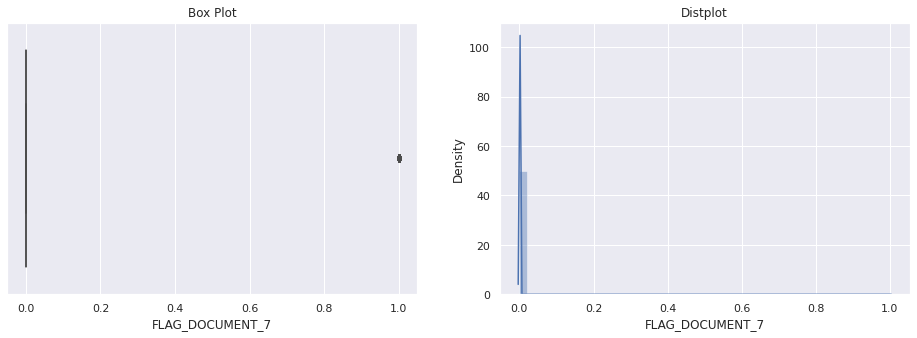

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


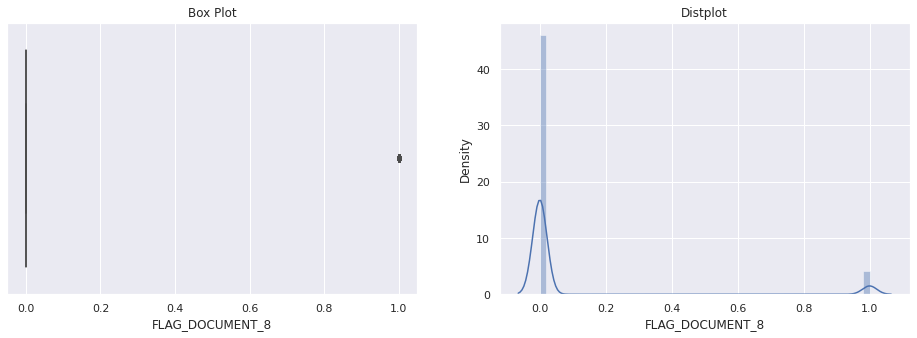

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


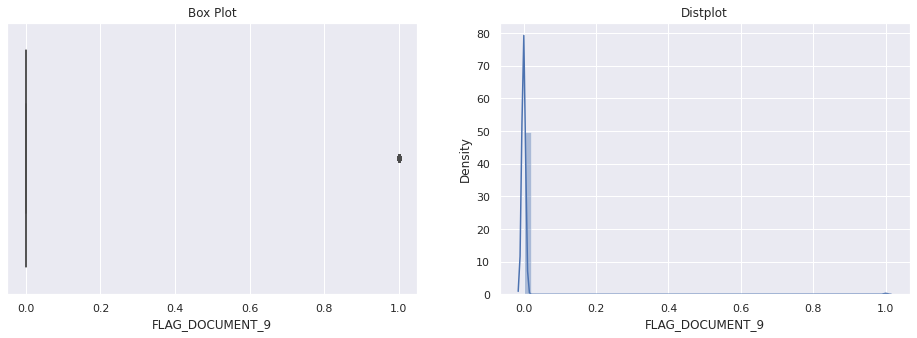

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


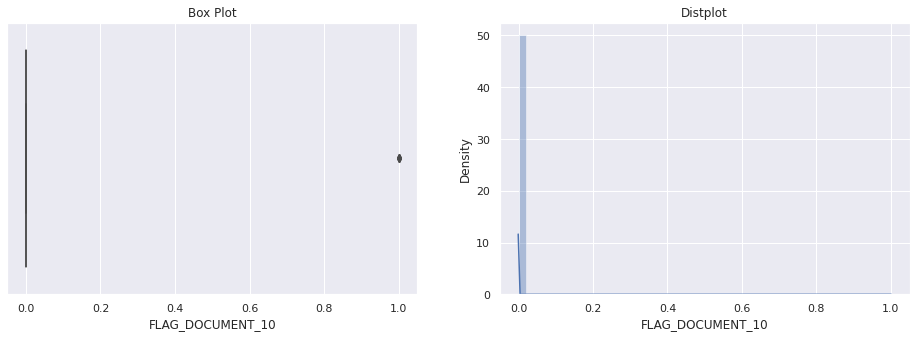

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


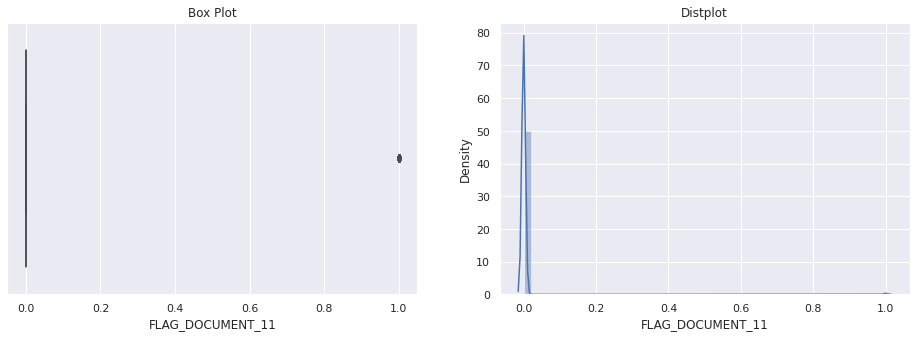

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


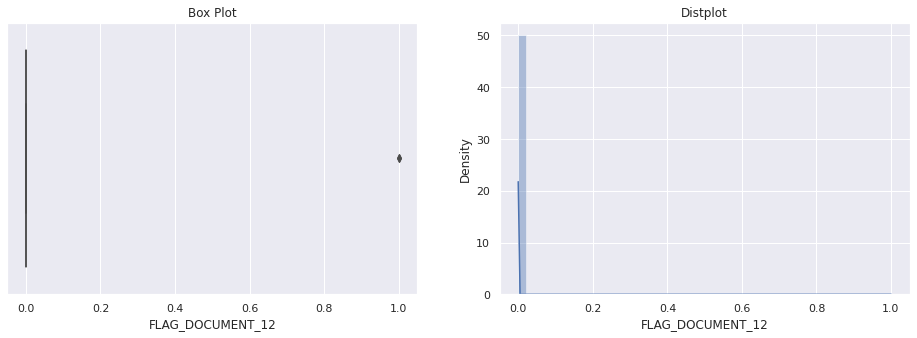

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


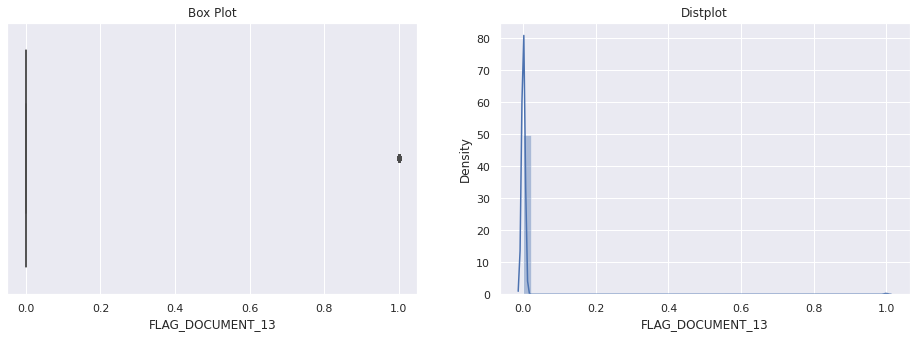

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


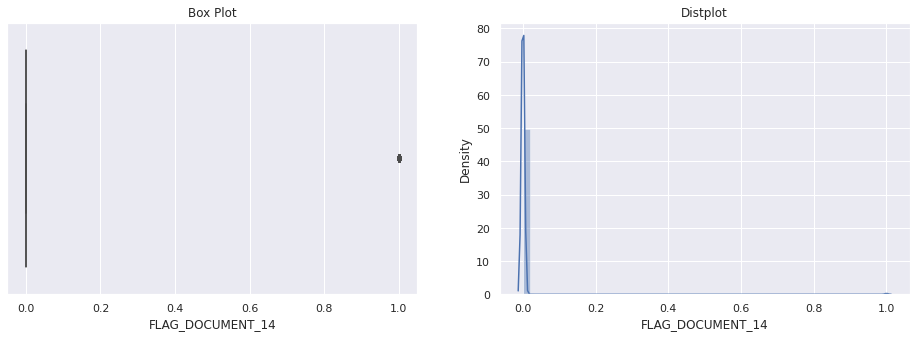

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


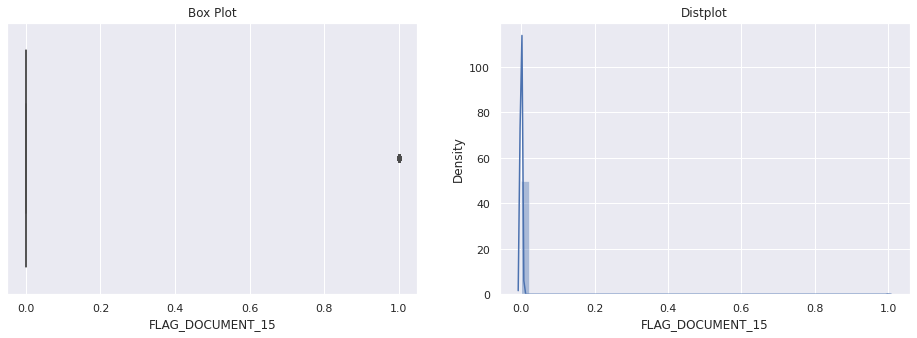

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


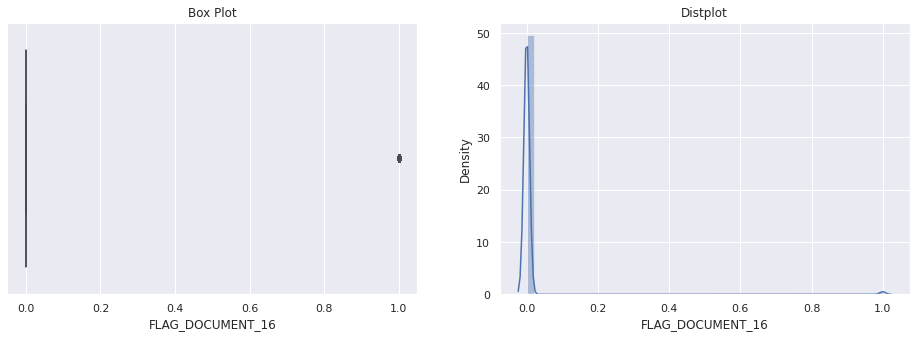

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


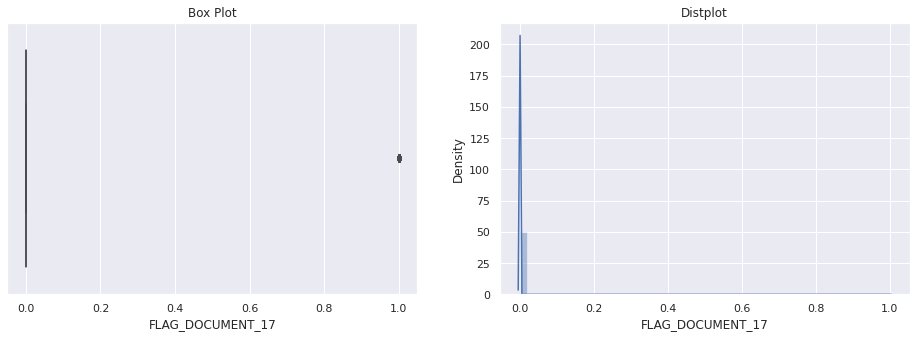

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


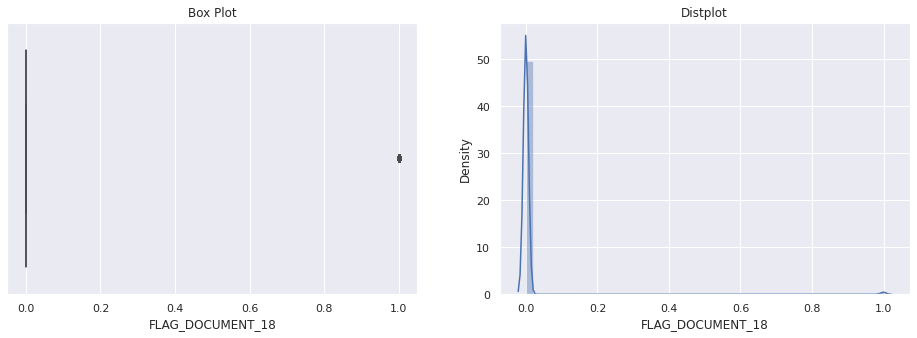

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


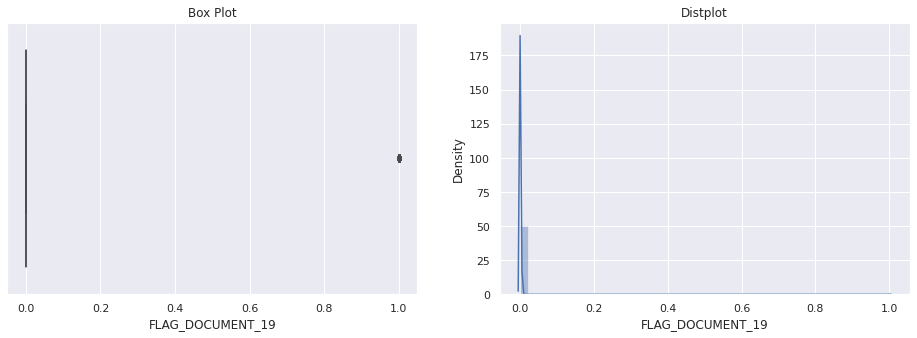

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


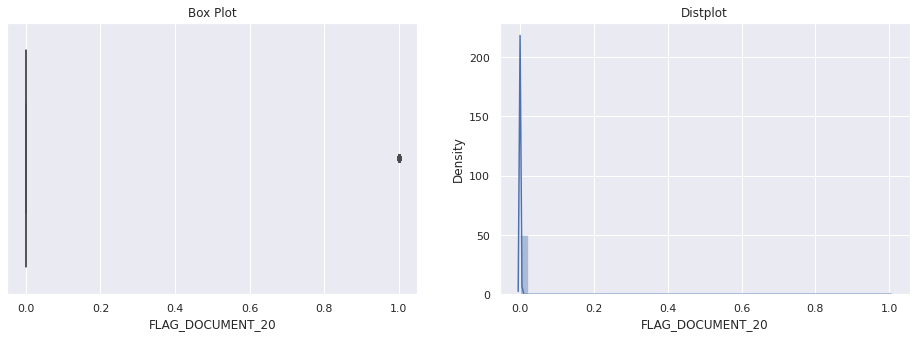

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


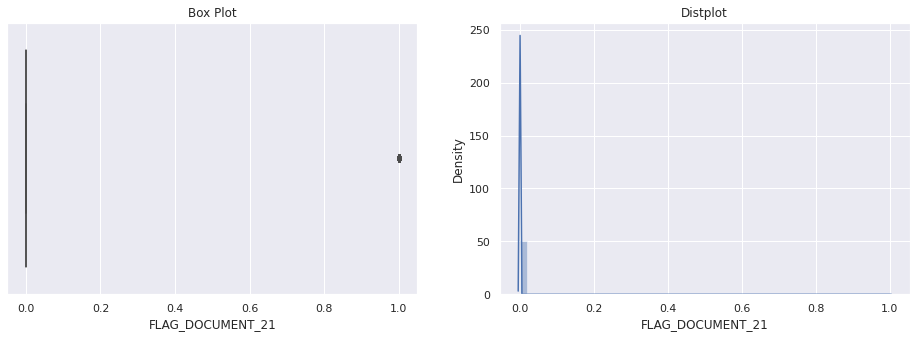

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


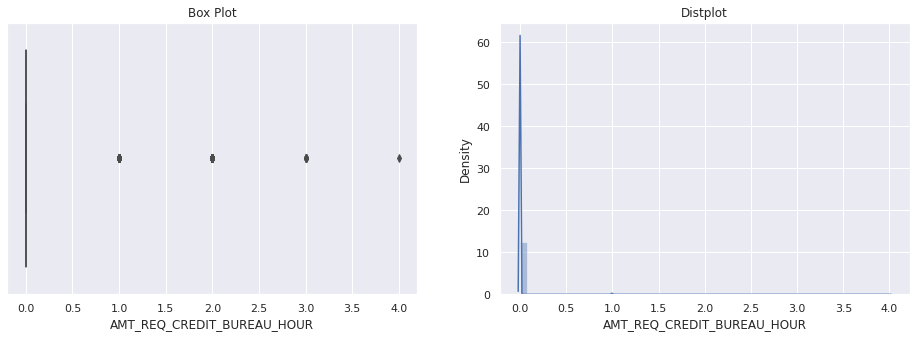

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


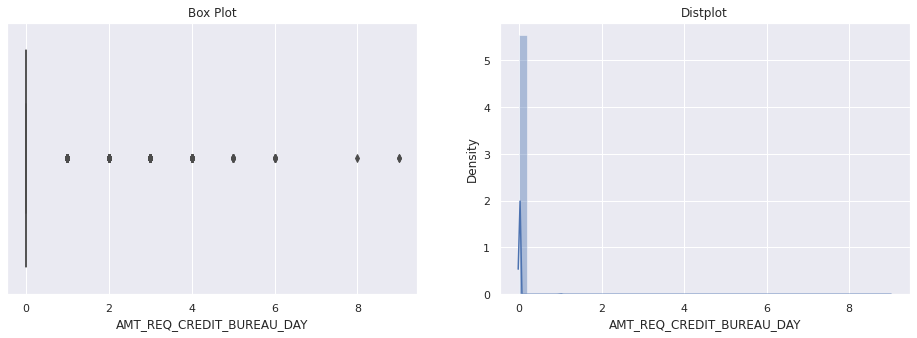

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


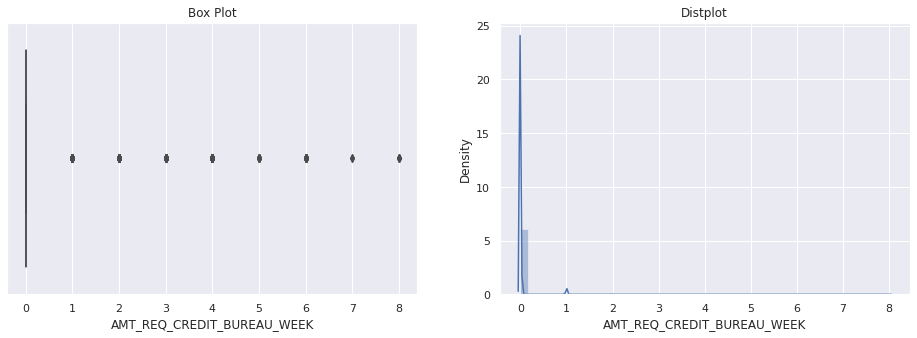

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


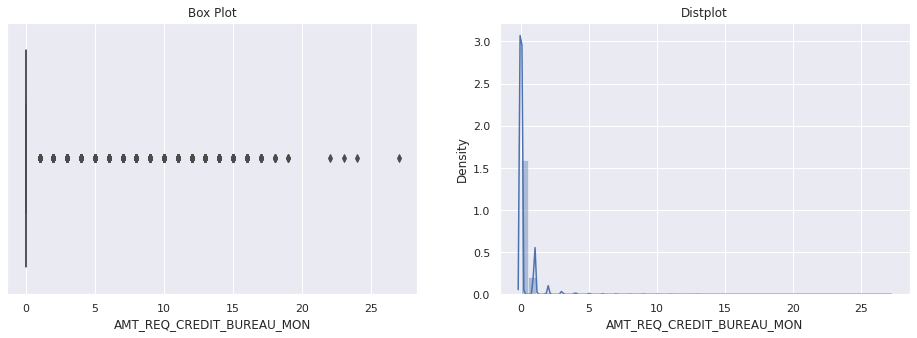

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


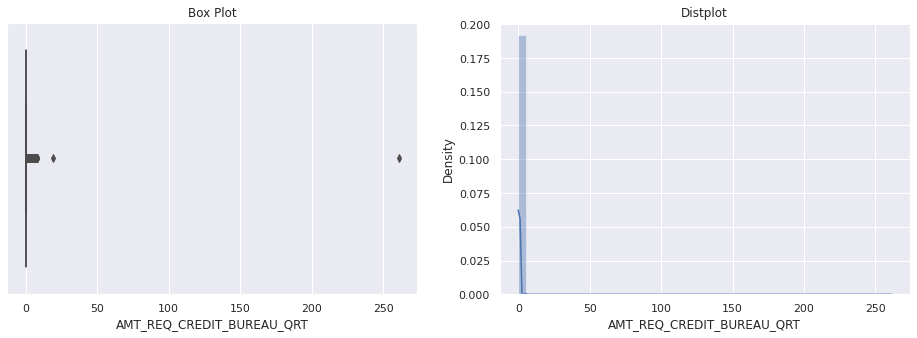

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


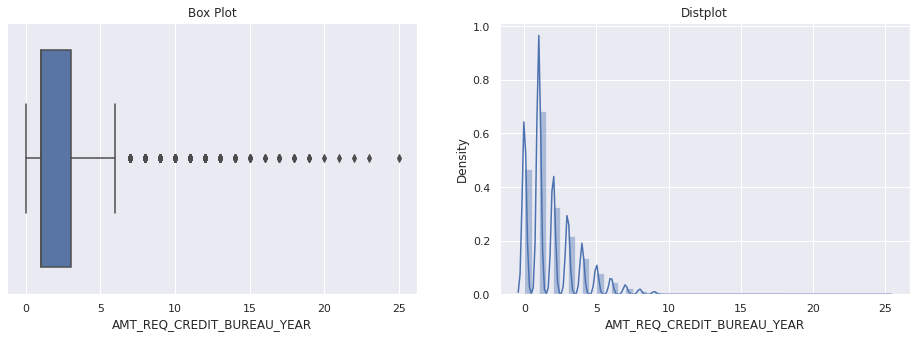

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


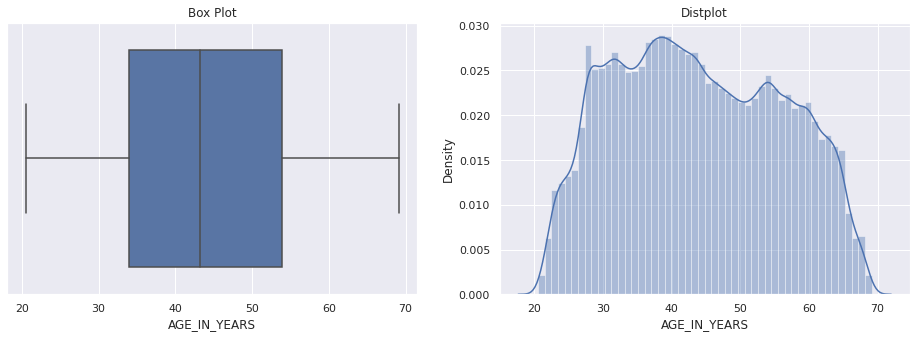

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


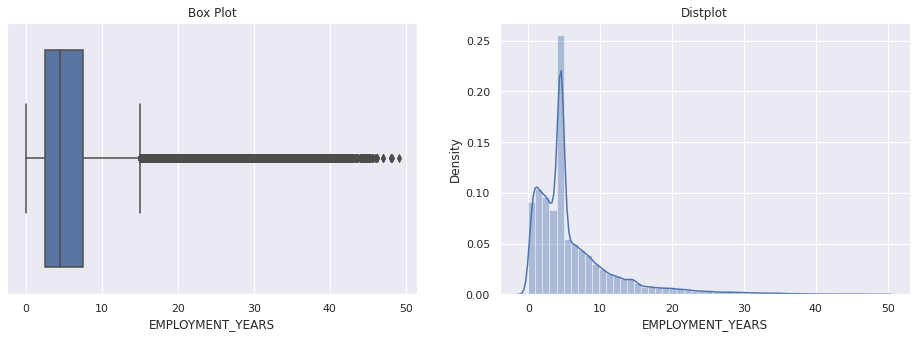

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


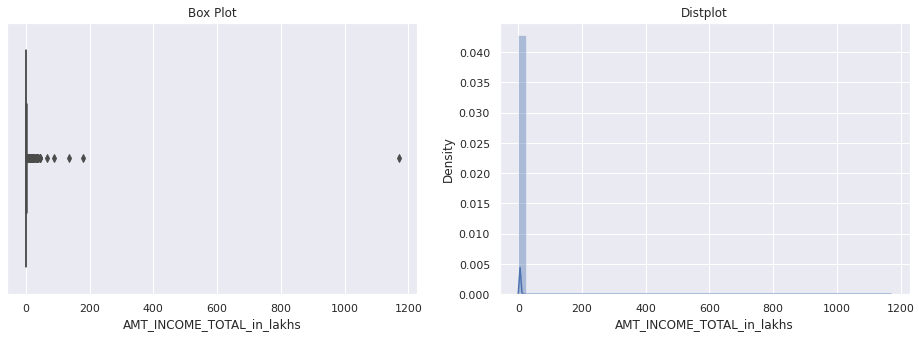

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


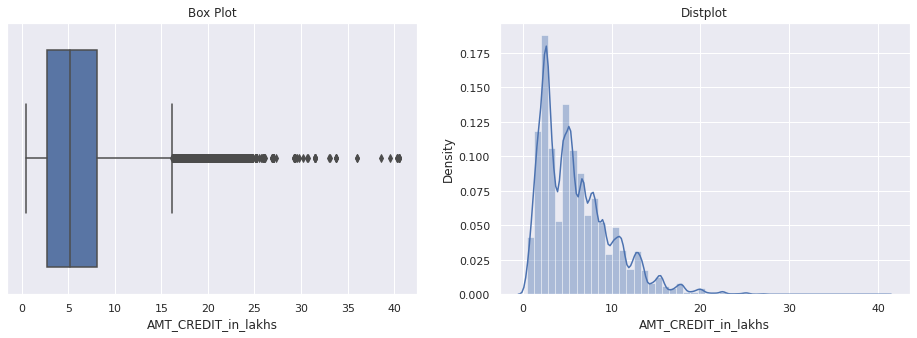

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


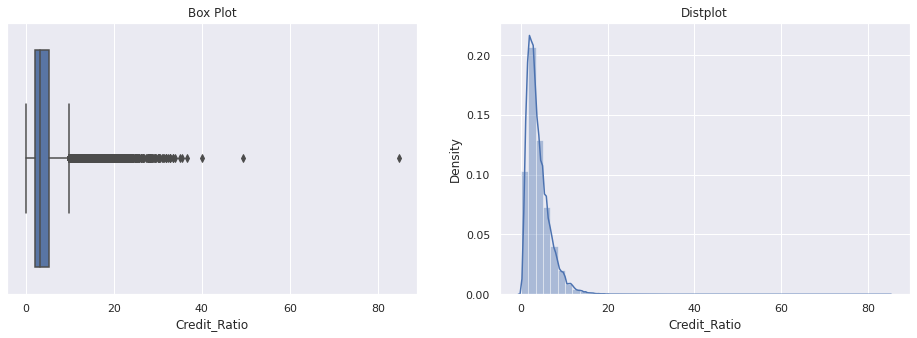

In [ ]:
for i in numeric_data:
    Uni_Analysis_Numarical(df,i)

Univariate analysis on categorical data

In [ ]:
def Uni_Analysis_Categorcal(dataframe, column):
    sns.set(style='darkgrid')
    plt.figure(figsize = [12,5])
    dataframe[column].value_counts().plot.barh(width = 0.8)
    plt.title(column)
    plt.show()

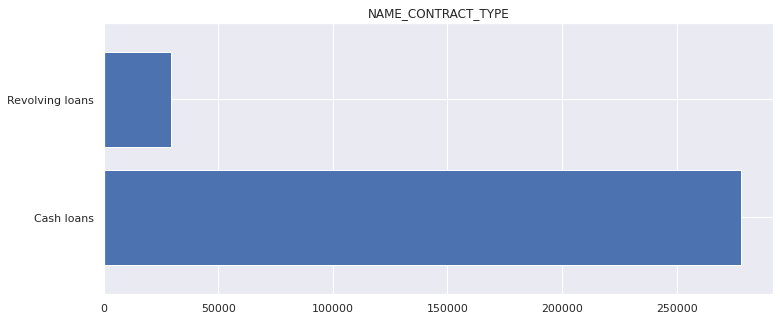

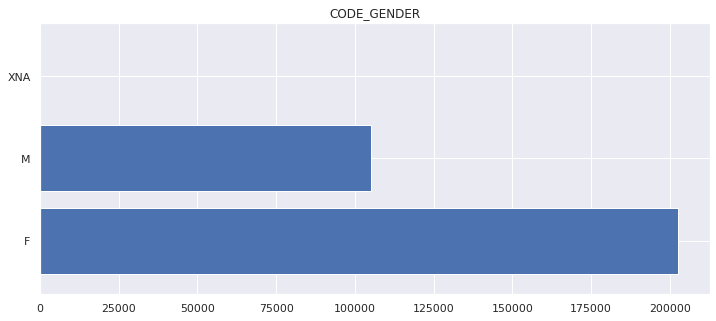

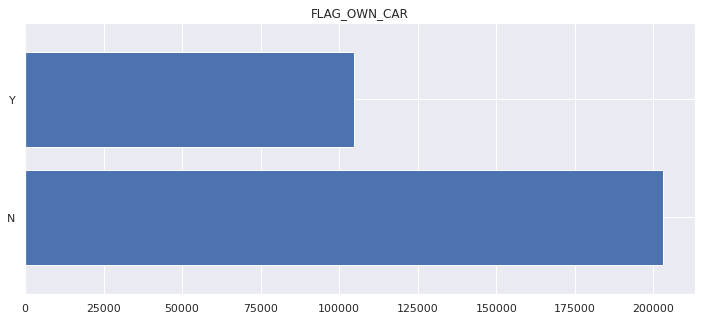

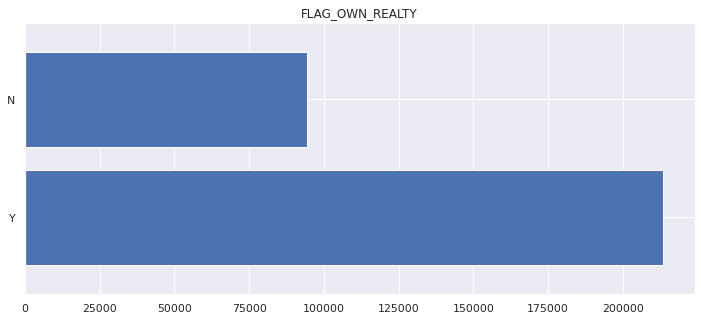

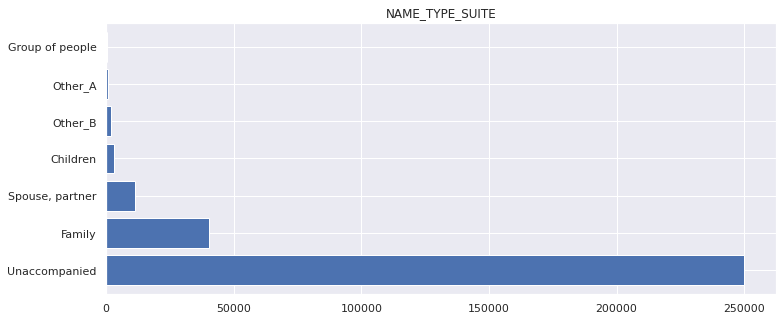

...

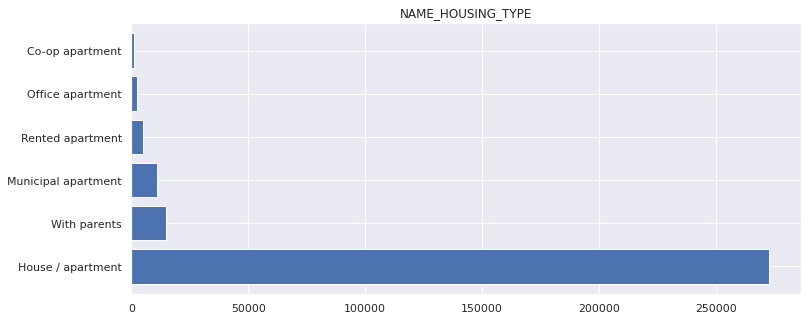

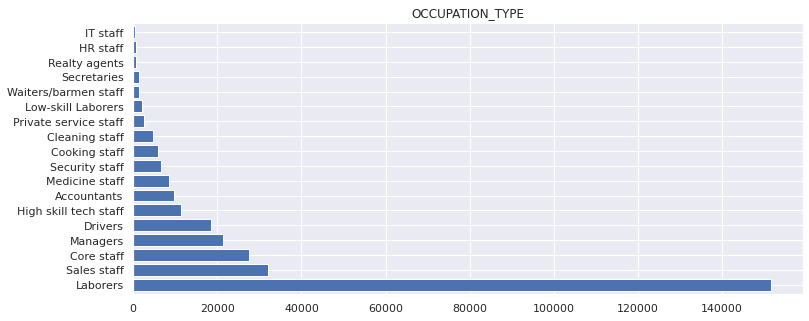

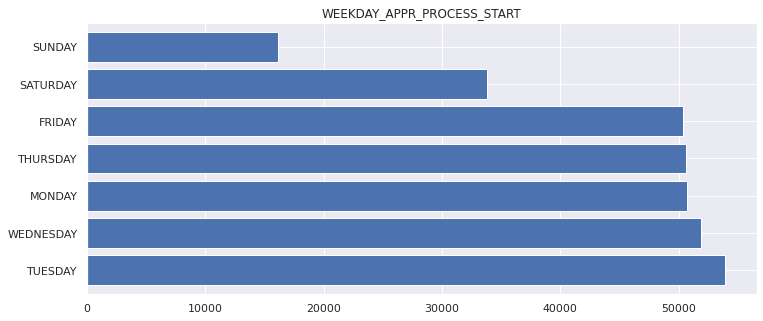

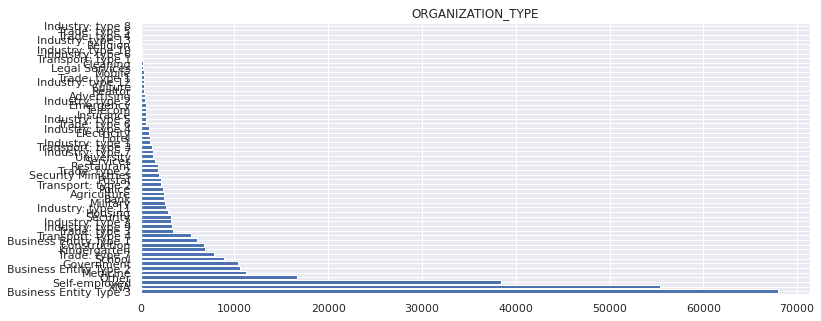

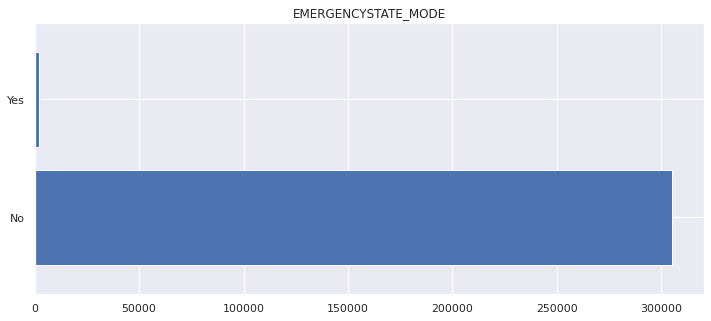

In [ ]:
for i in categorical_data:
    Uni_Analysis_Categorcal(df,i)

#Bivariate and Multivariate Analysis

In [18]:
Target_Variable_Payment_Difficulty = df[df.TARGET == 1]
Target_Variable_All_Other = df[df.TARGET == 0]

In [ ]:
# function to plot for categorical variables
def Target_categorical_Uni(variable):
    # other thems of plot seaborn-colorblind,seaborn-dark-palette ,classic

    plt.style.use('classic')
    sns.despine
    fig,(ax1,ax2) = plt.subplots(1,2,figsize=(25,8))
    
    sns.countplot(x=variable, data=Target_Variable_Payment_Difficulty,linewidth=1,ax=ax1,edgecolor=sns.color_palette("dark", 3),hue =variable )
    ax1.set_ylabel('Total Counts')
    ax1.set_title(f'Distribution of {variable} Tagget Payment_Difficulty',fontsize=18)
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=40, ha="right")
    
    # Adding the normalized percentage for easier comparision
    for p in ax1.patches:
        ax1.annotate('{:.1f}%'.format((p.get_height()/len(Target_Variable_Payment_Difficulty))*100), (p.get_x()+0.4, p.get_height()+100), ha='center')
        
    sns.countplot(x=variable, data=Target_Variable_All_Other,ax=ax2,linewidth=1,edgecolor=sns.color_palette("dark", 3),hue =variable )
    ax2.set_ylabel('Total Counts')
    ax2.set_title(f'Distribution of {variable} Tagget All_Other',fontsize = 18,)    
    ax2.set_xticklabels(ax2.get_xticklabels(), rotation=40, ha="right")
    
    # Adding the normalized percentage for easier comparision
    for p in ax2.patches:
        ax2.annotate('{:.1f}%'.format((p.get_height()/len(Target_Variable_All_Other))*100), (p.get_x()+0.4, p.get_height()+100), ha='center')
    
    plt.show()

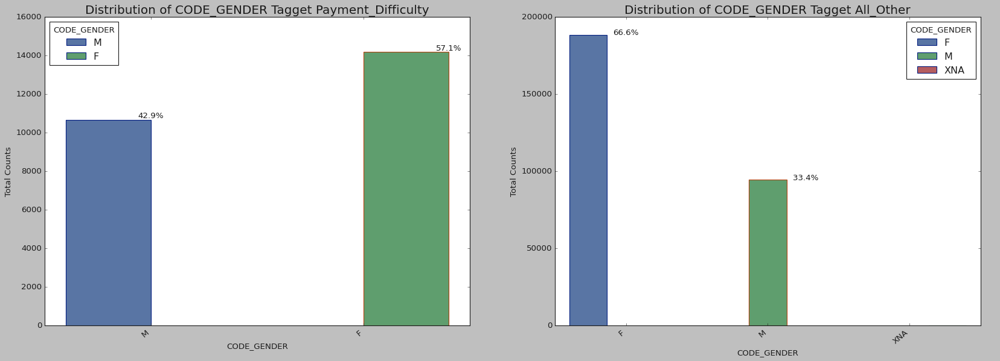

In [ ]:
Target_categorical_Uni('CODE_GENDER')

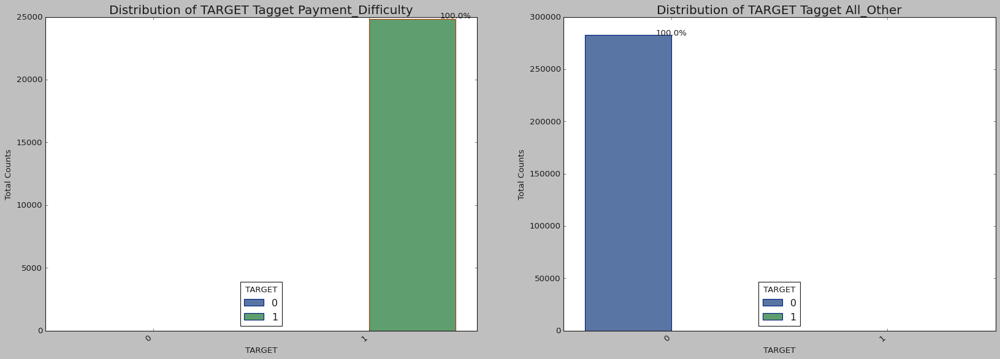

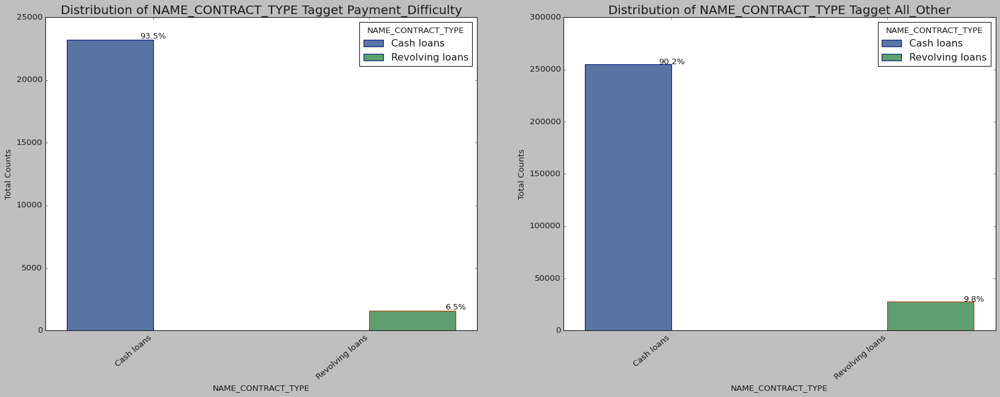

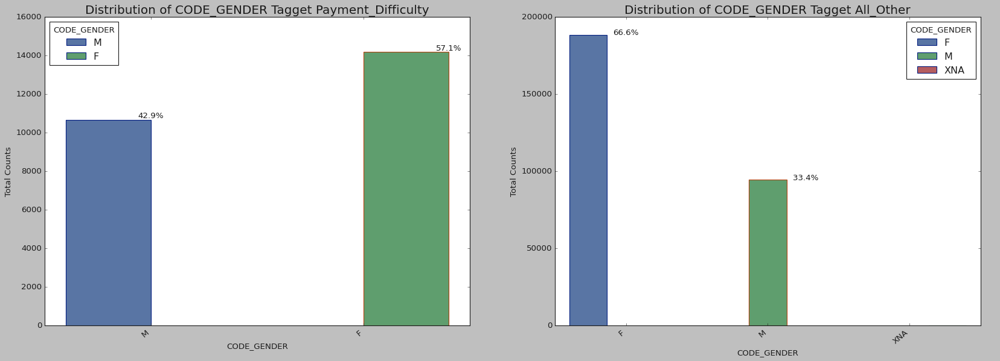

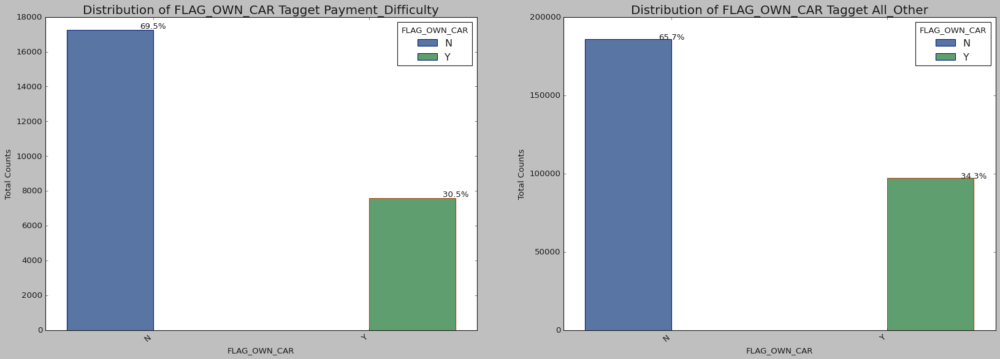

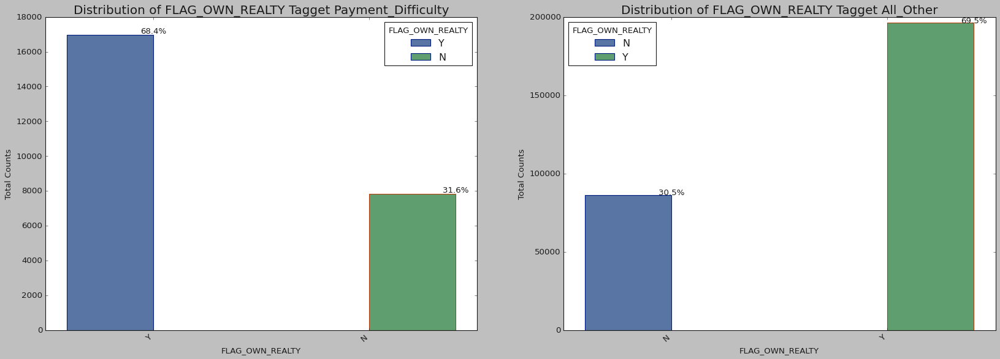

...

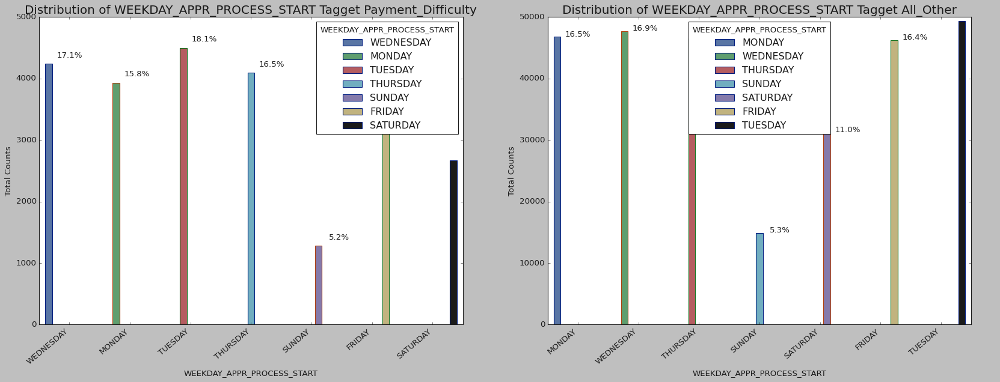

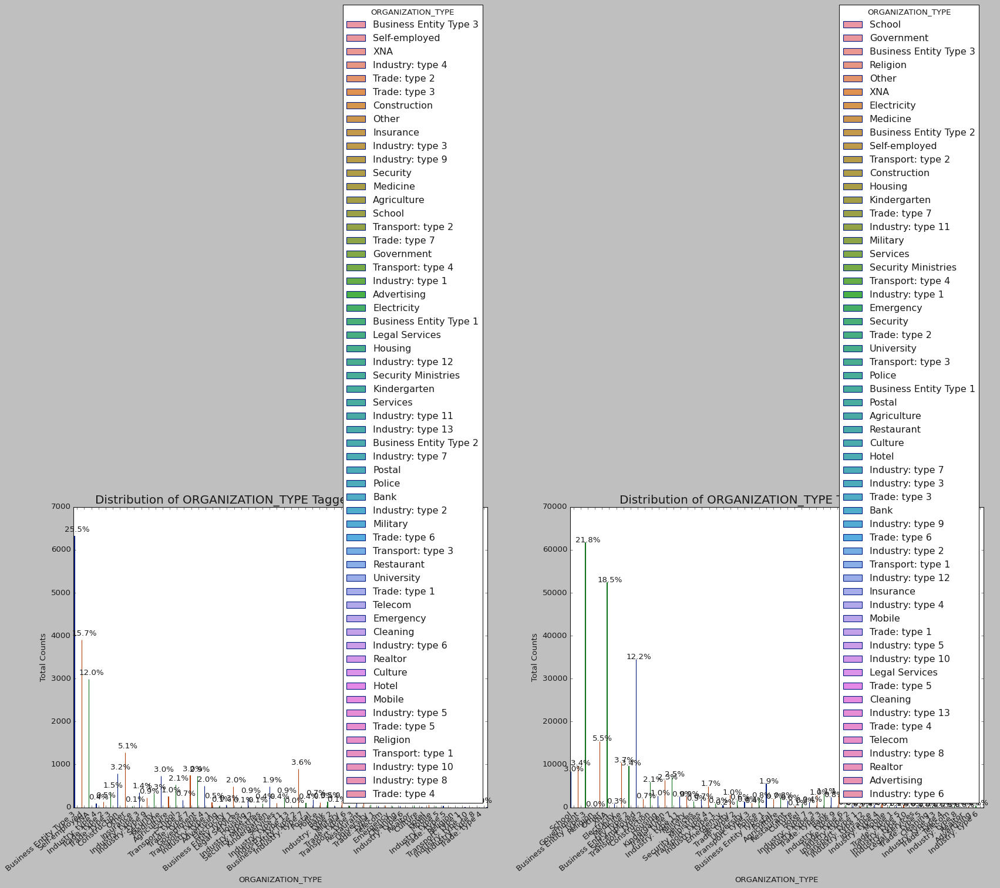

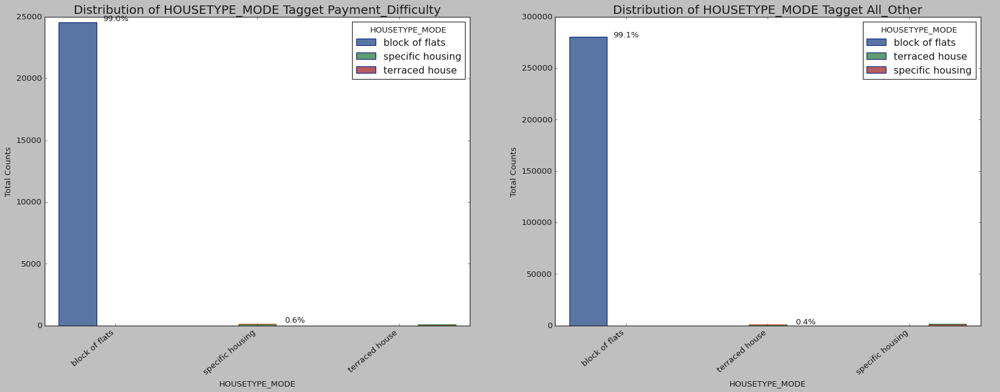

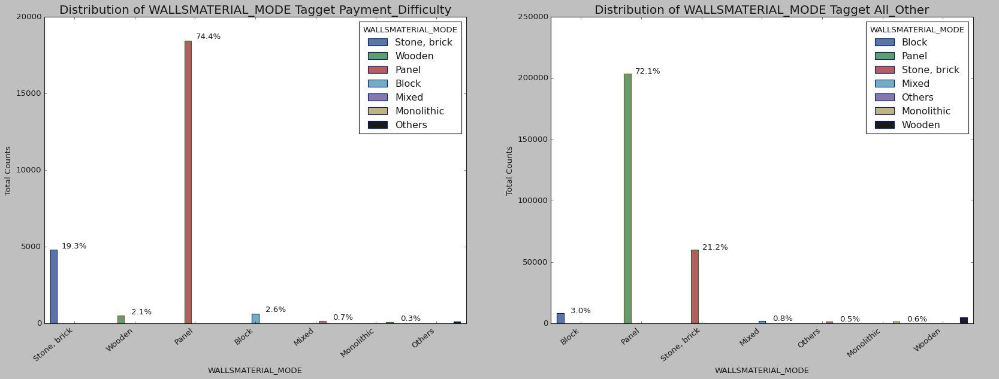

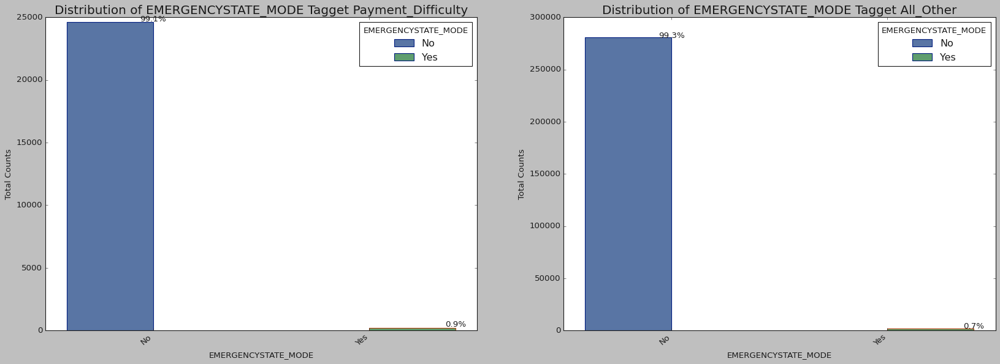

In [ ]:
for i in categorical_data:
    Target_categorical_Uni(i)

In [ ]:
# function to plot for numerical variables
def Target_Numerical_Uni(variable):
    
    sns.set(style='darkgrid')
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 2, 1)
    sns.distplot(Target_Variable_Payment_Difficulty[variable].dropna())
    plt.title(f'Distribution of {variable} Payment_Difficulty',fontsize=15)
    plt.xlabel(variable)
    
    plt.subplot(1, 2, 2)
    sns.distplot(Target_Variable_All_Other[variable].dropna())
    plt.title(f'Distribution of {variable} All Other',fontsize=15)
    plt.xlabel(variable)
    
    plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


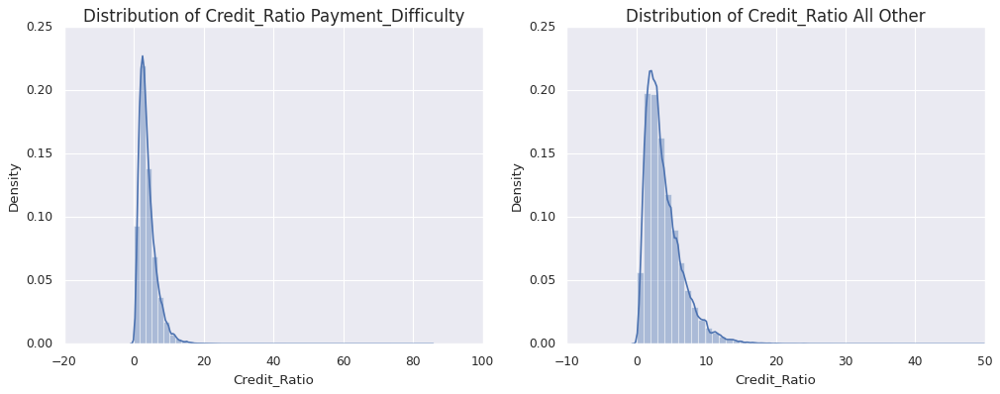

In [ ]:
Target_Numerical_Uni('Credit_Ratio')

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


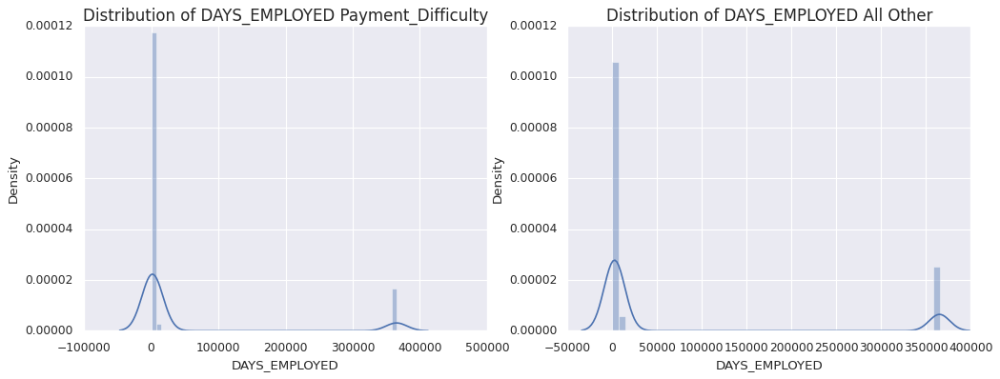

In [ ]:
Target_Numerical_Uni('DAYS_EMPLOYED')

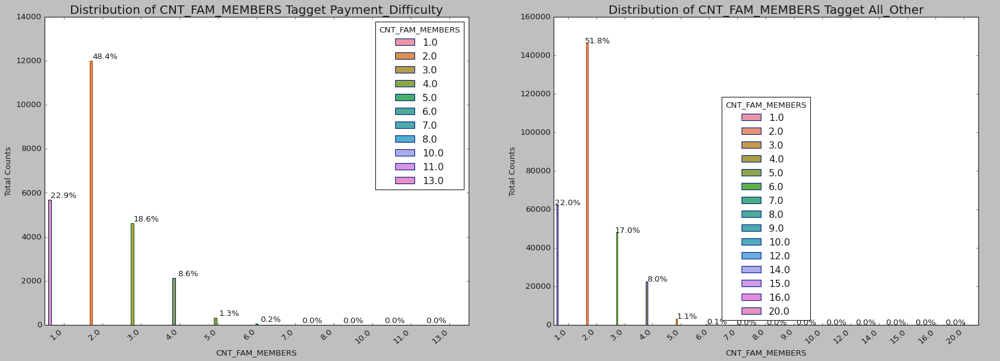

In [ ]:
Target_categorical_Uni('CNT_FAM_MEMBERS')

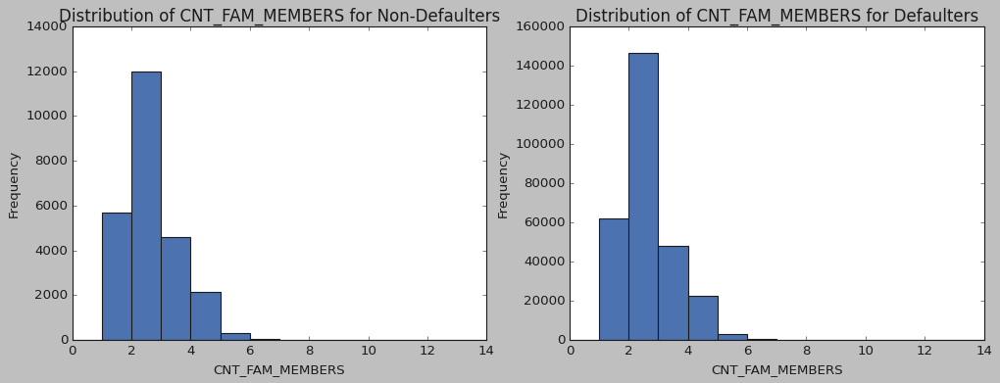

In [ ]:
plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
Target_Variable_Payment_Difficulty['CNT_FAM_MEMBERS'].plot.hist(bins=range(15))
plt.title('Distribution of CNT_FAM_MEMBERS for Non-Defaulters',fontsize=15)
plt.xlabel('CNT_FAM_MEMBERS')

plt.subplot(1, 2, 2)
Target_Variable_All_Other['CNT_FAM_MEMBERS'].plot.hist(bins=range(15))
plt.title(f'Distribution of CNT_FAM_MEMBERS for Defaulters',fontsize=15)
plt.xlabel('CNT_FAM_MEMBERS')

plt.show()

Bivariate Analysis

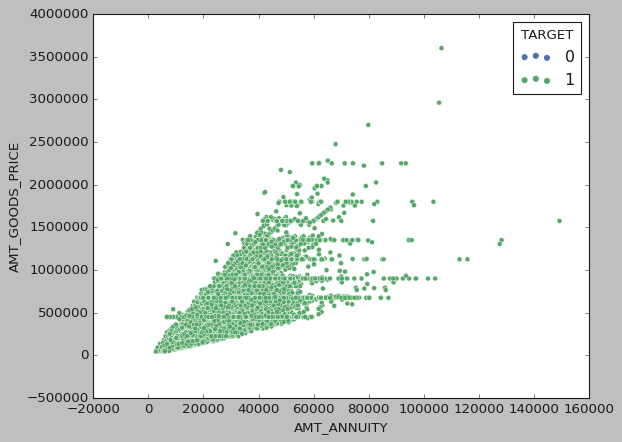

In [ ]:
sns.scatterplot(x=Target_Variable_Payment_Difficulty.AMT_ANNUITY, 
                y = Target_Variable_Payment_Difficulty.AMT_GOODS_PRICE, 
                data=Target_Variable_Payment_Difficulty,hue = 'TARGET')

In [ ]:
def Target_Numerical_Bi(variable_1, variable_2):
    # other thems of plot seaborn-colorblind,seaborn-dark-palette ,classic

    plt.style.use('ggplot')
    sns.despine
    fig,(ax1,ax2) = plt.subplots(1,2,figsize=(20,6))
    
    sns.scatterplot(x=variable_1, y=variable_2,data=Target_Variable_Payment_Difficulty,ax=ax1)
    ax1.set_xlabel(variable_1)    
    ax1.set_ylabel(variable_2)
    ax1.set_title(f'{variable_1} vs {variable_2} Tagget Payment_Difficulty',fontsize=15)
    
    sns.scatterplot(x=variable_1, y=variable_2,data=Target_Variable_All_Other,ax=ax2)
    ax2.set_xlabel(variable_1)    
    ax2.set_ylabel(variable_2)
    ax2.set_title(f'{variable_1} vs {variable_2} Tagget All_Other',fontsize=15)
            
    plt.show()

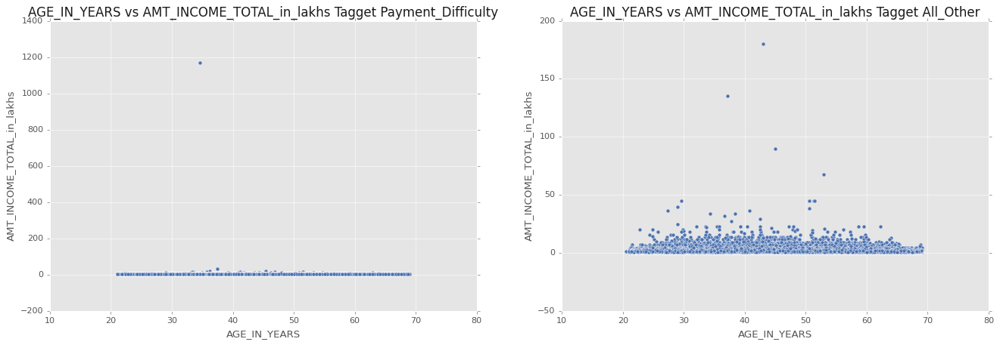

In [ ]:
Target_Numerical_Bi('AGE_IN_YEARS', 'AMT_INCOME_TOTAL_in_lakhs')

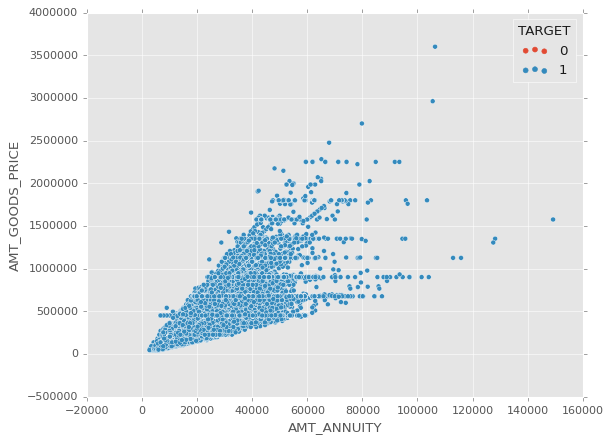

In [ ]:
sns.scatterplot(x=Target_Variable_Payment_Difficulty.AMT_ANNUITY, y = Target_Variable_Payment_Difficulty.AMT_GOODS_PRICE, data=Target_Variable_Payment_Difficulty,hue = 'TARGET')


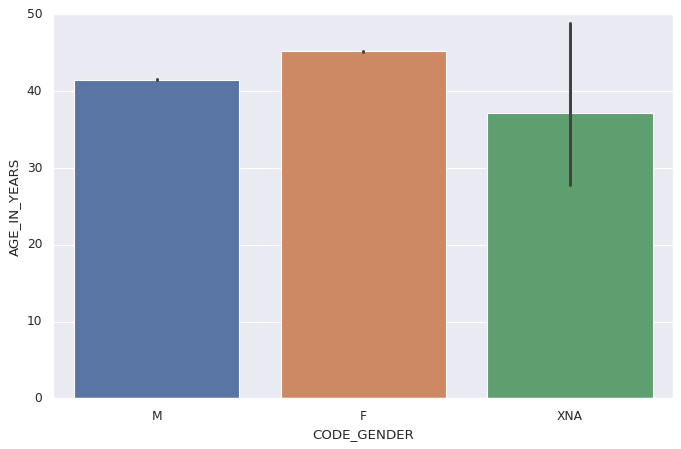

In [ ]:
plt.figure(figsize = [10,6])
sns.set(style='darkgrid')
sns.barplot(x = df.CODE_GENDER,y = df.AGE_IN_YEARS)
plt.show()

In [ ]:
# Count plotting in logarithmic scale

def uniplot(df,col,title,hue =None):
    
    sns.set_style('whitegrid')
    sns.set_context('talk')
    plt.rcParams["axes.labelsize"] = 20
    plt.rcParams['axes.titlesize'] = 22
    plt.rcParams['axes.titlepad'] = 30
    
    
    temp = pd.Series(data = hue)
    fig, ax = plt.subplots()
    width = len(df[col].unique()) + 7 + 4*len(temp.unique())
    fig.set_size_inches(width , 8)
    plt.xticks(rotation=45)
    plt.yscale('log')
    plt.title(title)
    ax = sns.countplot(data = df, x= col, order=df[col].value_counts().index,hue = hue,palette='magma') 
        
    plt.show()

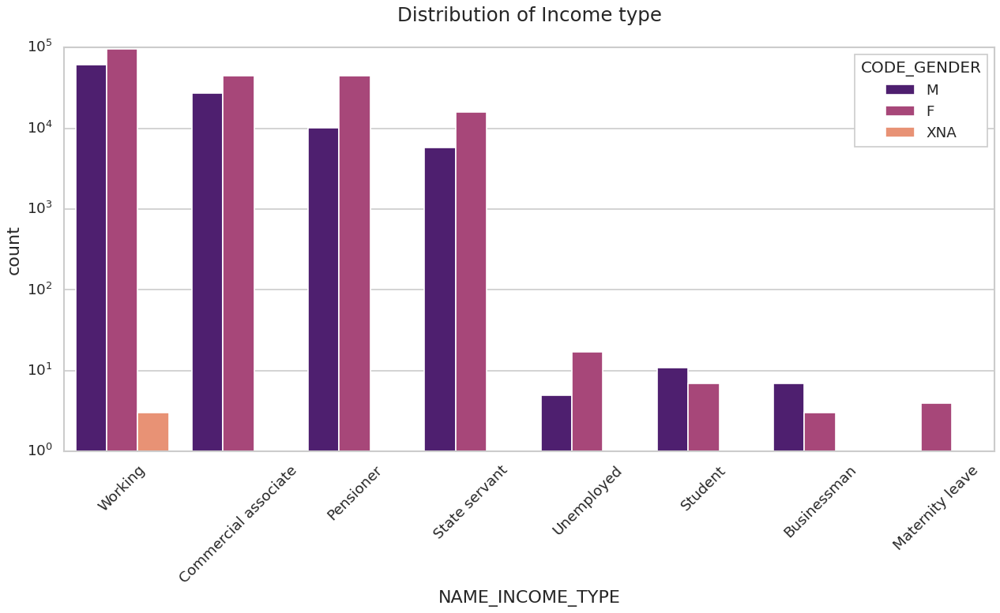

In [ ]:
# Plotting for Income type

uniplot(df,col='NAME_INCOME_TYPE',title='Distribution of Income type',hue='CODE_GENDER')

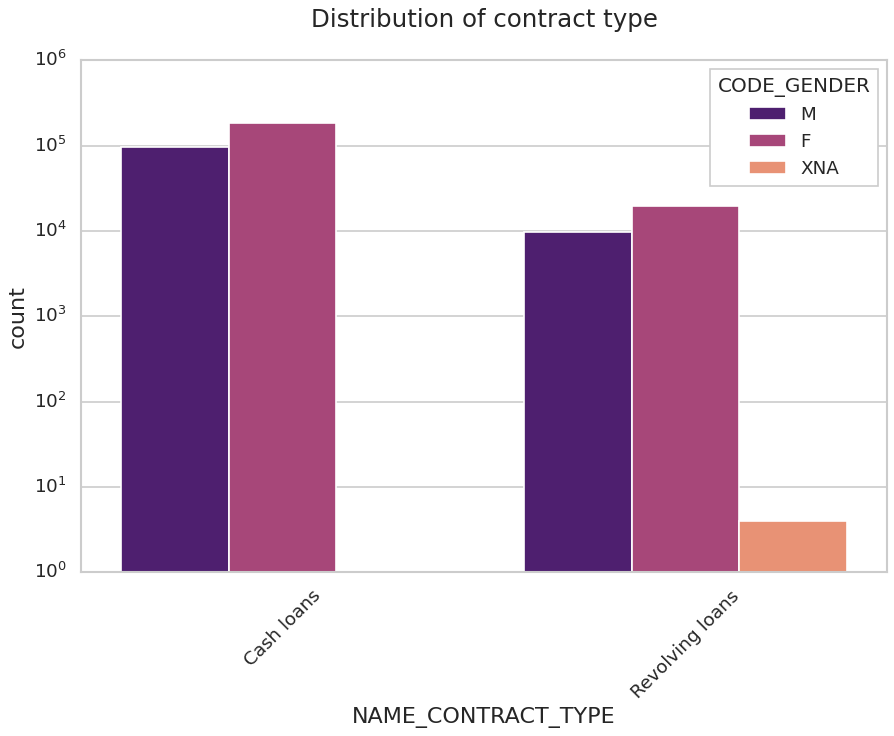

In [ ]:
# Plotting for Contract type

uniplot(df,col='NAME_CONTRACT_TYPE',title='Distribution of contract type',hue='CODE_GENDER')

In [ ]:
NEWAPP0=df[df.TARGET==0]    # Dataframe with all the data related to non-defaulters
NEWAPP1=df[df.TARGET==1]    # Dataframe with all the data related to defaulters

In [ ]:
# function to count plot for categorical variables
def plotuninewapp(var):

    plt.style.use('ggplot')
    sns.despine
    fig,(ax1,ax2) = plt.subplots(1,2,figsize=(20,6))
    
    sns.countplot(x=var, data=NEWAPP0,ax=ax1)
    ax1.set_ylabel('Total Counts')
    ax1.set_title(f'Distribution of {var} for Non-Defaulters',fontsize=15)
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=40, ha="right")
    
    # Adding the normalized percentage for easier comparision between defaulter and non-defaulter
    for p in ax1.patches:
        ax1.annotate('{:.1f}%'.format((p.get_height()/len(NEWAPP0))*100), (p.get_x()+0.1, p.get_height()+50))
        
    sns.countplot(x=var, data=NEWAPP1,ax=ax2)
    ax2.set_ylabel('Total Counts')
    ax2.set_title(f'Distribution of {var} for Defaulters',fontsize=15)    
    ax2.set_xticklabels(ax2.get_xticklabels(), rotation=40, ha="right")
    
    # Adding the normalized percentage for easier comparision between defaulter and non-defaulter
    for p in ax2.patches:
        ax2.annotate('{:.1f}%'.format((p.get_height()/len(NEWAPP1))*100), (p.get_x()+0.1, p.get_height()+50))
    
    plt.show()
    

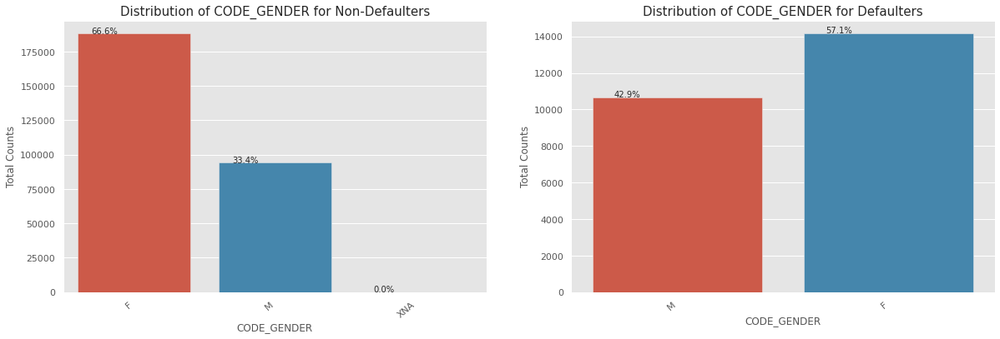

In [ ]:
plotuninewapp('CODE_GENDER')

> We can see that Female contribute 67% to the non-defaulters while 57% to the defaulters. We can conclude that
> <br> We see more female applying for loans than males and hence the more number of female defaulters as well. 
> <br> **But the rate of defaulting of FEMALE is much lower compared to their MALE counterparts.**

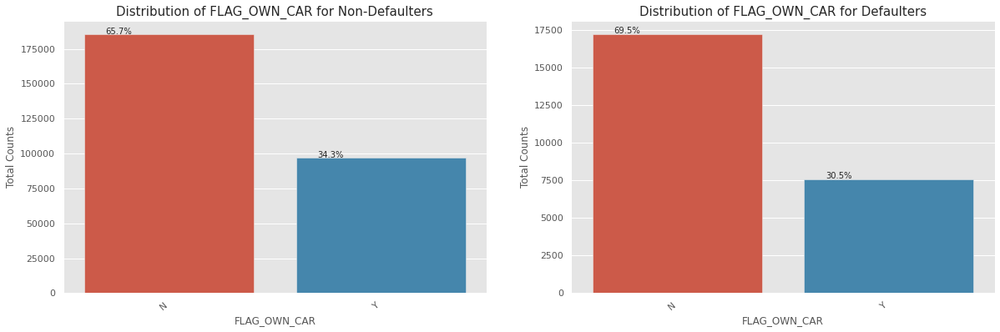

In [ ]:
plotuninewapp('FLAG_OWN_CAR')

We can see that people with cars contribute 65.7% to the non-defaulters while 69.5% to the defaulters. We can conclude that
While people who have car default more often, the reason could be there are simply more people without cars
Looking at the percentages in both the charts, we can conclude that the rate of default of people having car is low compared to people who don't.

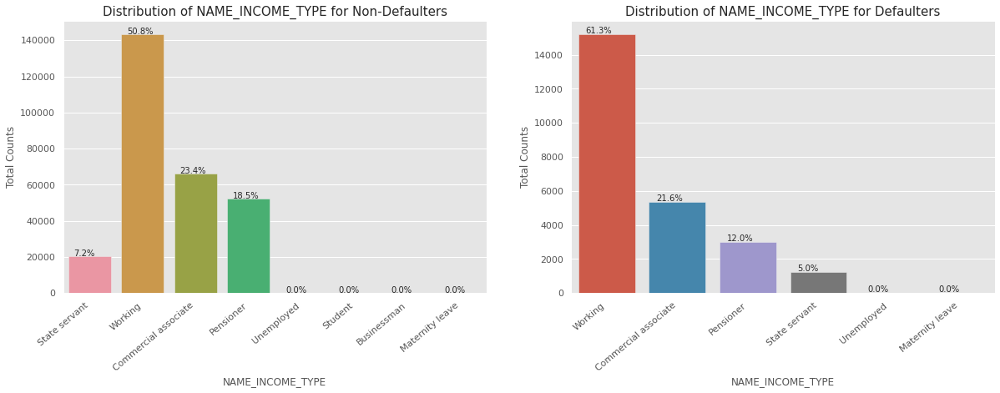

In [ ]:
plotuninewapp('NAME_INCOME_TYPE')

We can notice that the students don't default. The reason could be they are not required to pay during the time they are students.
We can also see that the BusinessMen never default.
Most of the loans are distributed to working class people
We also see that working class people contribute 51% to non defaulters while they contribute to 61% of the defaulters. Clearly, the chances of defaulting are more in their case.

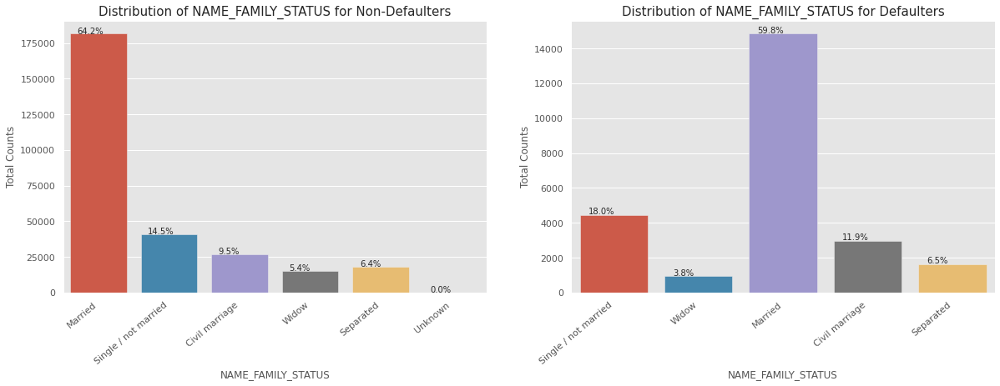

In [ ]:
plotuninewapp('NAME_FAMILY_STATUS')

Married people tend to apply for more loans comparatively.
But from the graph we see that Single/non Married people contribute 14.5% to Non Defaulters and 18% to the defaulters. So there is more risk associated with them.

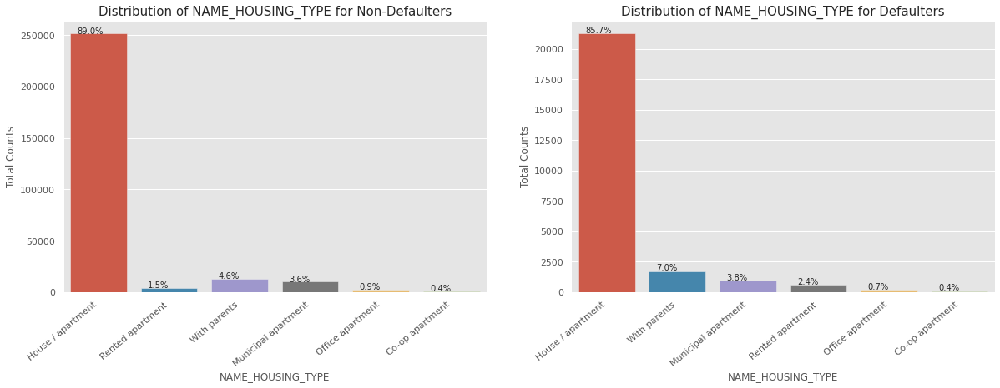

In [ ]:
plotuninewapp('NAME_HOUSING_TYPE')

It is clear from the graph that people who have House/Appartment, tend to apply for more loans.
People living with parents tend to default more often when compared with others.The reason could be their living expenses are more due to their parents living with them.

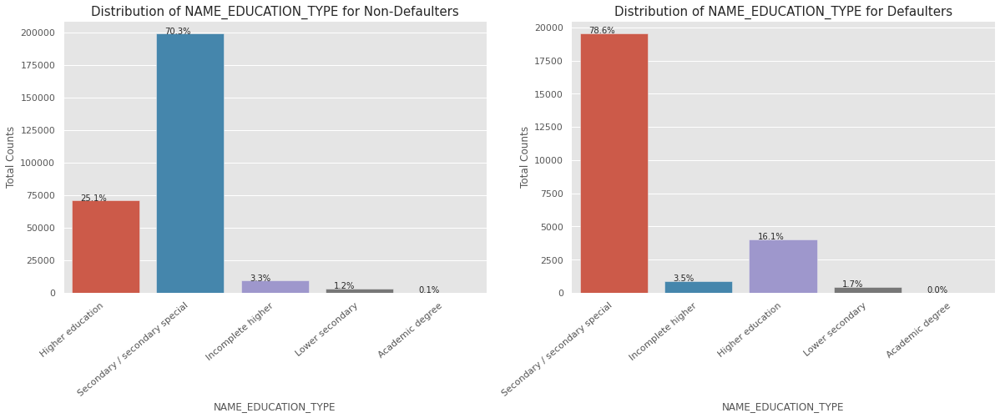

In [ ]:
plotuninewapp('NAME_EDUCATION_TYPE')

Almost all of the Education categories are equally likely to default except for the higher educated ones who are less likely to default and secondary educated people are more likely to default

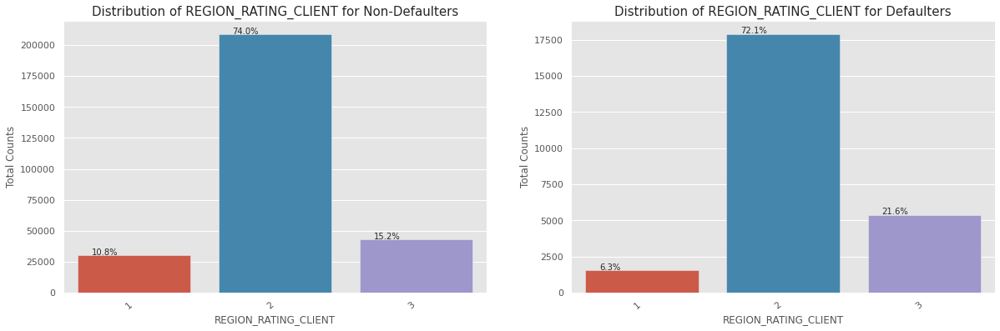

In [ ]:
plotuninewapp('REGION_RATING_CLIENT')

More people from second tier regions tend to apply for loans.
We can infer that people living in better areas(Rating 3) tend contribute more to the defaulters by their weightage.
People living in 1 rated areas

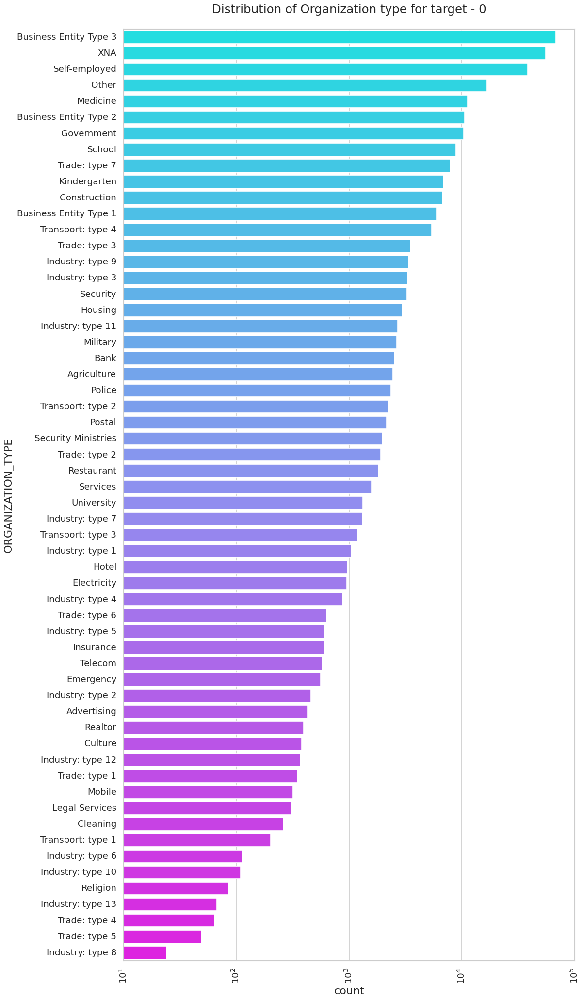

In [ ]:
# Plotting for Organization type in logarithmic scale

sns.set_style('whitegrid')
sns.set_context('talk')
plt.figure(figsize=(15,30))
plt.rcParams["axes.labelsize"] = 20
plt.rcParams['axes.titlesize'] = 22
plt.rcParams['axes.titlepad'] = 30

plt.title("Distribution of Organization type for target - 0")

plt.xticks(rotation=90)
plt.xscale('log')

sns.countplot(data=df,y='ORGANIZATION_TYPE',order=df['ORGANIZATION_TYPE'].value_counts().index,palette='cool')

plt.show()

In [ ]:
target0_corr=Target_Variable_All_Other.iloc[0:,2:]
target0=target0_corr.corr(method='spearman')

In [ ]:
# Now, plotting the above correlation with heat map as it is the best choice to visulaize

# figure size

def targets_corr(data,title):
    plt.figure(figsize=(15, 10))
    plt.rcParams['axes.titlesize'] = 25
    plt.rcParams['axes.titlepad'] = 70

# heatmap with a color map of choice


    sns.heatmap(data, cmap="RdYlGn",annot=False)

    plt.title(title)
    plt.yticks(rotation=0)
    plt.show()

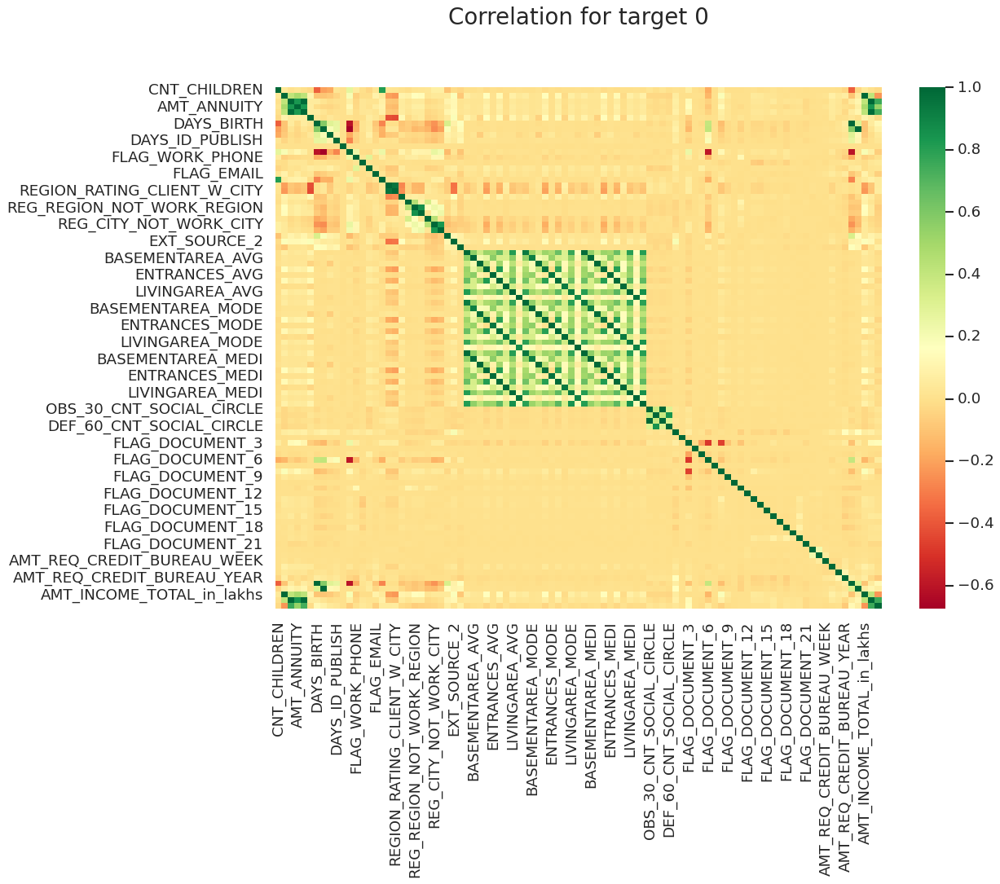

In [ ]:
targets_corr(data=target0,title='Correlation for target 0')

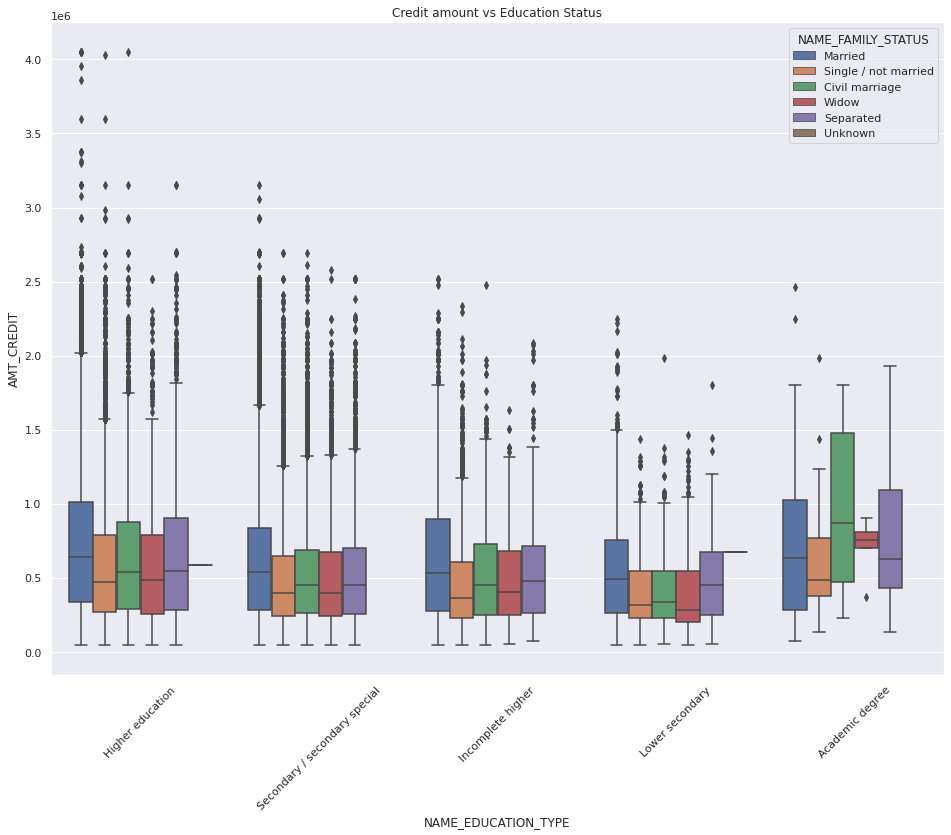

In [ ]:
# Box plotting for Credit amount
plt.figure(figsize=(16,12))
plt.xticks(rotation=45)
sns.boxplot(data =target0_df, x='NAME_EDUCATION_TYPE',y='AMT_CREDIT', hue ='NAME_FAMILY_STATUS',orient='v')
plt.title('Credit amount vs Education Status')
plt.show()

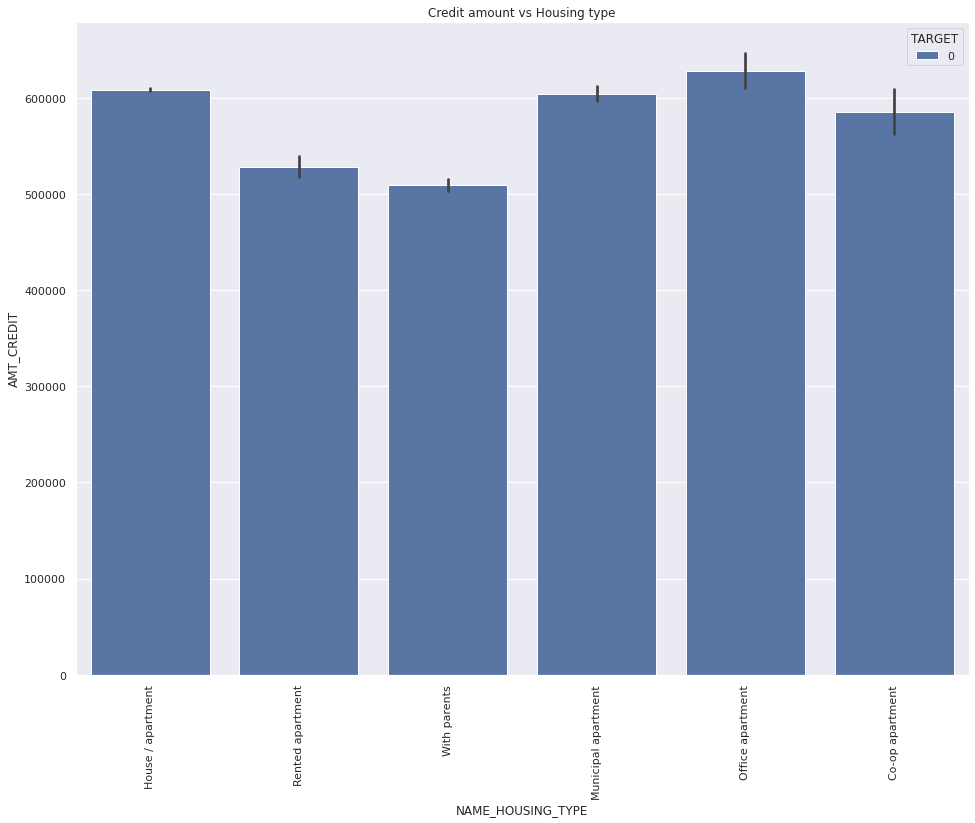

In [ ]:
# Box plotting for Credit amount prev vs Housing type in logarithmic scale
plt.figure(figsize=(16,12))
plt.xticks(rotation=90)
sns.barplot(data =target0_df, y='AMT_CREDIT',hue='TARGET',x='NAME_HOUSING_TYPE')
plt.title('Credit amount vs Housing type')
plt.show()

Conclusion:
1. Banks should focus more on contract type ‘Student’ ,’pensioner’ and ‘Businessman’ with housing ‘type other than ‘Co-op apartment’ for successful payments.

2. Banks should focus less on income type ‘Working’ as they are having most number of unsuccessful payments.

3. Also with loan purpose ‘Repair’ is having higher number of unsuccessful payments on time.

4. Get as much as clients from housing type ‘With parents’ as they are having least number of unsuccessful payments.

In [31]:
Target_Variable_Payment_Difficulty = target1_df.copy()

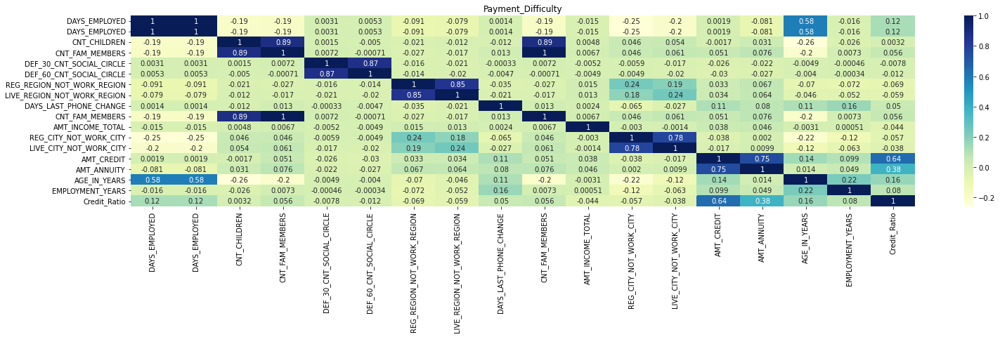

In [32]:
top_20_correlated_features = Target_Variable_Payment_Difficulty[['DAYS_EMPLOYED', 'NAME_INCOME_TYPE', 'ORGANIZATION_TYPE', 'DAYS_EMPLOYED',
                                                          'CNT_CHILDREN', 'CNT_FAM_MEMBERS', 'DEF_30_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
                                                          'NAME_EDUCATION_TYPE', 'NAME_TYPE_SUITE', 'DAYS_LAST_PHONE_CHANGE', 'NAME_HOUSING_TYPE', 'CNT_FAM_MEMBERS', 'NAME_HOUSING_TYPE', 'AMT_INCOME_TOTAL',
                                                          'REG_CITY_NOT_WORK_CITY','LIVE_CITY_NOT_WORK_CITY', 'AMT_CREDIT', 'AMT_ANNUITY', 'AGE_IN_YEARS', 'EMPLOYMENT_YEARS', 'Credit_Ratio', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']]
plt.figure(figsize=(25, 5))
sns.heatmap(top_20_correlated_features.corr(method='pearson'),cmap="YlGnBu",annot=True)
plt.title('Payment_Difficulty')
plt.show()                                                         

##Analysis on Previous Application Data

In [4]:
##Reading and checking the shape of the previous year recorded dataset
previous = pd.read_csv("/content/drive/MyDrive/MS chapter/previous_application.csv")
previous.shape

(1670214, 37)

In [38]:
previous.sample(5)

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
143726,2071809,445658,Revolving loans,6750.000,135000.0,135000.0,NaN,135000.0,SATURDAY,15,...,XNA,0.0,XNA,Card Street,NaN,NaN,NaN,NaN,NaN,NaN
1651223,1283756,103710,Cash loans,30430.080,135000.0,156388.5,NaN,135000.0,MONDAY,13,...,XNA,6.0,high,Cash X-Sell: high,365243.0,-1124.0,-974.0,-1094.0,-1085.0,1.0
1273599,1553216,263984,Cash loans,10313.325,270000.0,328450.5,NaN,270000.0,THURSDAY,13,...,XNA,48.0,low_normal,Cash X-Sell: low,NaN,NaN,NaN,NaN,NaN,NaN
1549116,1596327,335023,Consumer loans,4447.395,27873.0,22950.0,8365.5,27873.0,TUESDAY,18,...,Industry,6.0,middle,POS other with interest,365243.0,-515.0,-365.0,-455.0,-451.0,0.0
1298826,1600562,118868,Consumer loans,15630.390,413721.0,413721.0,0.0,413721.0,TUESDAY,16,...,Consumer electronics,36.0,low_normal,POS household with interest,365243.0,-810.0,240.0,365243.0,365243.0,0.0


In [39]:
previous.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [40]:
previous.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,...,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1.670214e+06,1.670214e+06,774370.000000,...,5951.000000,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,1.248418e+01,9.964675e-01,0.079637,...,0.773503,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,3.334028e+00,5.932963e-02,0.107823,...,0.100879,7.790997e+02,7.127443e+03,1.456729e+01,88916.115833,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,...,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,1.000000e+01,1.000000e+00,0.000000,...,0.715645,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,1.200000e+01,1.000000e+00,0.051605,...,0.835095,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,1.500000e+01,1.000000e+00,0.108909,...,0.852537,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,3.060045e+06,6.905160e+06,2.300000e+01,1.000000e+00,1.000000,...,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


##Missing Values:
Identification and Treatment

In [41]:
round((previous.isnull().sum()*100/len(previous)).sort_values(ascending=False),2)

RATE_INTEREST_PRIVILEGED       99.64
RATE_INTEREST_PRIMARY          99.64
AMT_DOWN_PAYMENT               53.64
RATE_DOWN_PAYMENT              53.64
NAME_TYPE_SUITE                49.12
NFLAG_INSURED_ON_APPROVAL      40.30
DAYS_TERMINATION               40.30
DAYS_LAST_DUE                  40.30
DAYS_LAST_DUE_1ST_VERSION      40.30
DAYS_FIRST_DUE                 40.30
DAYS_FIRST_DRAWING             40.30
AMT_GOODS_PRICE                23.08
AMT_ANNUITY                    22.29
CNT_PAYMENT                    22.29
PRODUCT_COMBINATION             0.02
AMT_CREDIT                      0.00
NAME_YIELD_GROUP                0.00
NAME_PORTFOLIO                  0.00
NAME_SELLER_INDUSTRY            0.00
SELLERPLACE_AREA                0.00
CHANNEL_TYPE                    0.00
NAME_PRODUCT_TYPE               0.00
SK_ID_PREV                      0.00
NAME_GOODS_CATEGORY             0.00
NAME_CLIENT_TYPE                0.00
CODE_REJECT_REASON              0.00
SK_ID_CURR                      0.00
D

In [5]:
#Dropping the columns having more than 50% missing values
perc = 50.0
min_count =  int(((100-perc)/100)*previous.shape[0] + 1)
previous = previous.dropna( axis=1, 
                thresh=min_count)
previous.shape

(1670214, 33)

In [6]:
#Obtaning the absolute values to get proper analysis
previous[["DAYS_FIRST_DRAWING", "DAYS_FIRST_DUE", "DAYS_LAST_DUE_1ST_VERSION", "DAYS_LAST_DUE", 
                "DAYS_TERMINATION"]] = abs(previous[["DAYS_FIRST_DRAWING", "DAYS_FIRST_DUE", "DAYS_LAST_DUE_1ST_VERSION", "DAYS_LAST_DUE","DAYS_TERMINATION"]])

In [7]:
#Imputing missing values
#Strategy : Median for numeric columns and Mode imputation for Object or Categorical ones
for i in previous.columns: 
  if (previous[i].dtype=='float64') | (previous[i].dtype=='int64'):
    previous[i].fillna(previous[i].median(), inplace=True)
  else:
    previous[i].fillna(previous[i].mode()[0], inplace=True)

In [8]:
num_data = previous.select_dtypes(include=[np.number])
cat_data = previous.select_dtypes(exclude=[np.number])
print(num_data.shape[1])
print(cat_data.shape[1])

17
16


##Outlier Treatment

Identification

In [52]:
num_data.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.465804e+06,1.465804e+06,1.465804e+06,1.465804e+06,1.465804e+06,1.465804e+06,1.465804e+06,1465804.0,1.465804e+06,1.465804e+06,1.465804e+06,1465804.0,1.465804e+06,1.465804e+06,1.465804e+06,1.465804e+06,1.465804e+06
mean,1.923360e+06,2.783358e+05,1.310383e+04,1.234282e+05,1.327921e+05,1.494767e+05,1.250433e+01,1.0,-9.065796e+02,2.817908e+02,1.415785e+01,365243.0,1.046792e+03,8.193121e+02,3.044822e+04,3.129724e+04,2.059286e-01
std,5.325470e+05,1.028177e+05,8.970279e+03,1.656952e+05,1.826983e+05,1.526000e+05,3.319941e+00,0.0,7.859932e+02,8.039237e+02,9.449356e+00,0.0,6.102052e+02,5.855368e+02,9.915779e+04,1.004477e+05,4.043787e-01
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.000000e+00,1.0,-2.922000e+03,-1.000000e+00,0.000000e+00,365243.0,2.000000e+00,0.000000e+00,2.000000e+00,2.000000e+00,0.000000e+00
25%,1.462745e+06,1.892870e+05,7.554049e+03,1.817550e+04,1.836450e+04,6.299550e+04,1.000000e+01,1.0,-1.381000e+03,-1.000000e+00,1.000000e+01,365243.0,7.800000e+02,4.800000e+02,8.290000e+02,8.290000e+02,0.000000e+00
50%,1.923414e+06,2.786980e+05,1.125000e+04,6.750000e+04,6.750000e+04,1.123200e+05,1.200000e+01,1.0,-6.090000e+02,1.000000e+01,1.200000e+01,365243.0,9.210000e+02,7.410000e+02,1.155000e+03,1.171000e+03,0.000000e+00
75%,2.384253e+06,3.674422e+05,1.482323e+04,1.526805e+05,1.618560e+05,1.527255e+05,1.500000e+01,1.0,-2.860000e+02,1.000000e+02,1.200000e+01,365243.0,1.093000e+03,8.010000e+02,1.284000e+03,1.286000e+03,0.000000e+00
max,2.845382e+06,4.562550e+05,5.443848e+04,1.039788e+06,1.151780e+06,1.039788e+06,2.200000e+01,1.0,-2.000000e+00,2.000000e+04,5.400000e+01,365243.0,2.892000e+03,2.801000e+03,3.652430e+05,3.652430e+05,1.000000e+00


By observing min, max and std value we can easily identify columns having outliers 

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


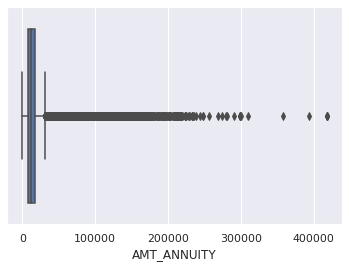

In [53]:
#One of the columns having outliers
sns.boxplot(previous.AMT_ANNUITY)
plt.show()

Treatment

In [9]:
#Removing outliers and storing the treated columns into original dataframe
standard_deviations = 3
num_data=num_data[num_data.apply(lambda x: np.abs(x - x.mean()) / x.std() < standard_deviations).all(axis=1)]
previous.select_dtypes('number').columns = num_data.columns

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


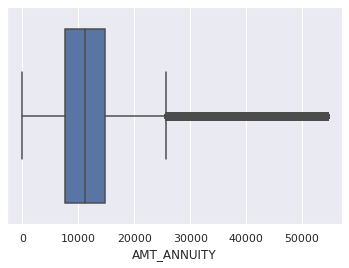

In [54]:
##Now we can see there is no outliers
sns.boxplot(num_data.AMT_ANNUITY)
plt.show()

##Univariate Analysis

On Numerical Features

In [47]:
def Uni_Analysis_Numarical(dataframe, column):
    sns.set(style='darkgrid')
    plt.figure(figsize=(25, 5))
    
    plt.subplot(1, 3, 1)
    sns.boxplot(data=dataframe, x=column, orient='v').set(title='Box Plot')
    
    plt.subplot(1, 3, 2)
    sns.distplot(dataframe[column].dropna()).set(title='Distplot')
    plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


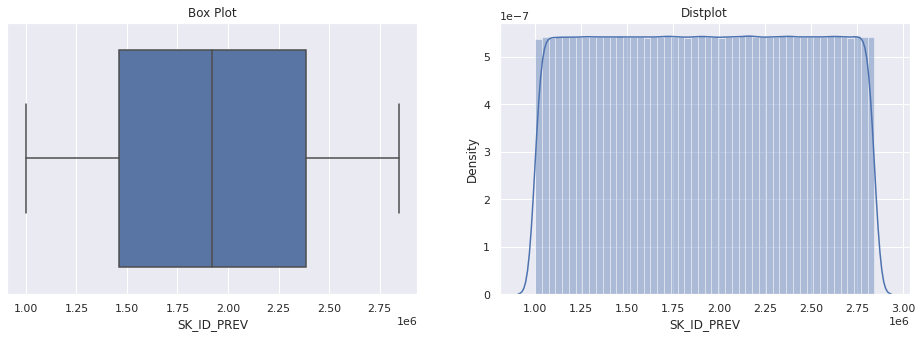

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


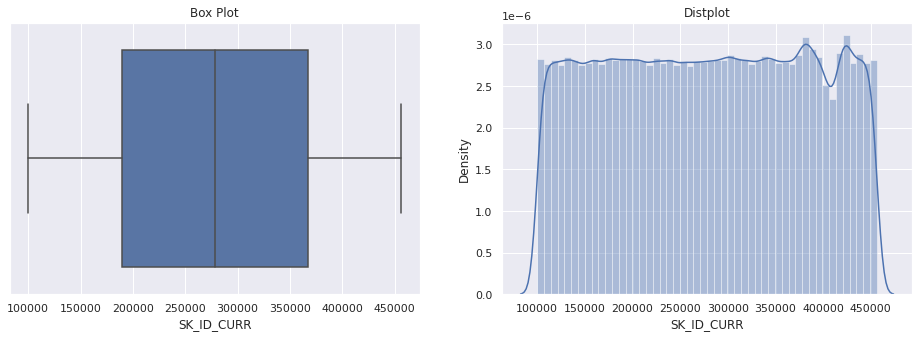

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


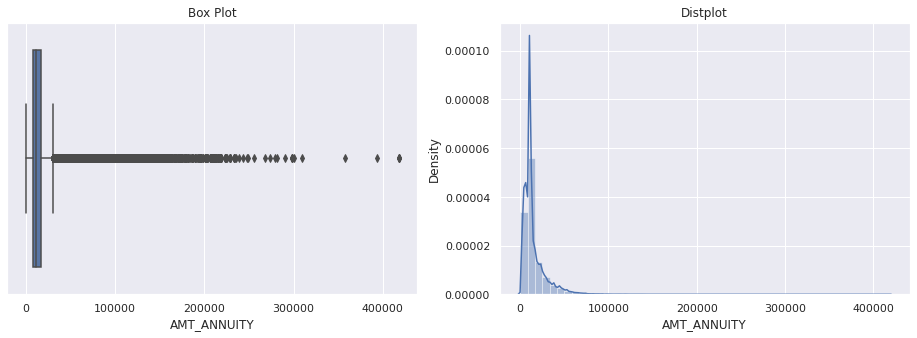

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


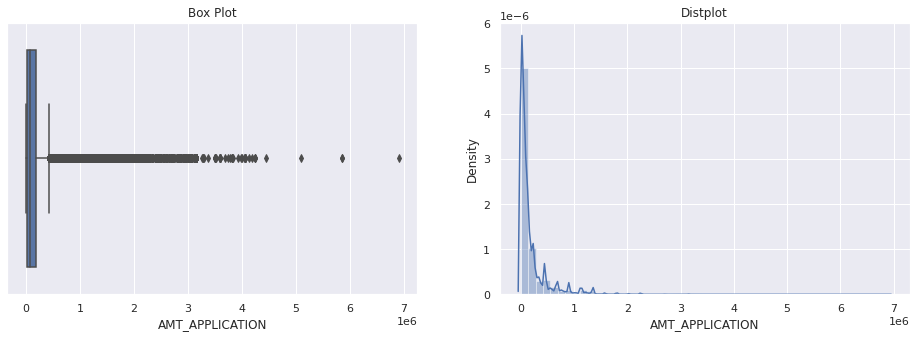

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


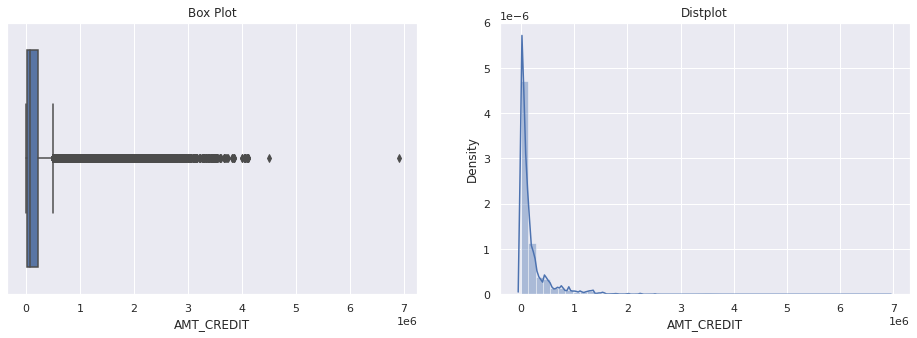

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


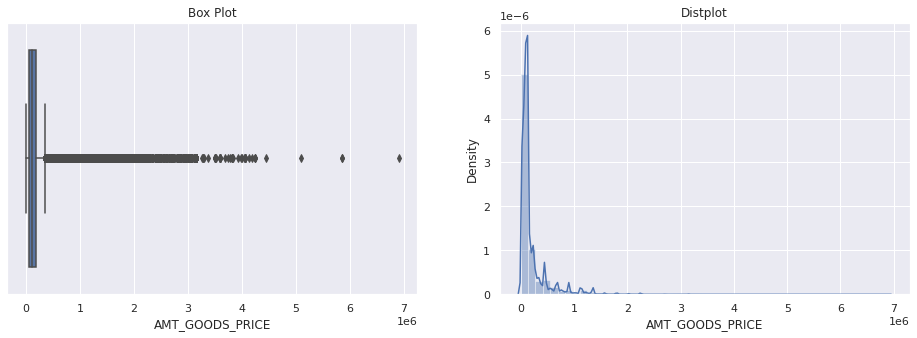

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


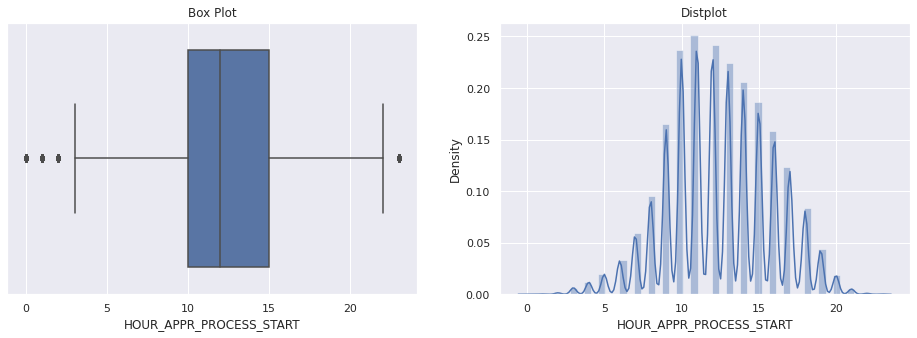

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


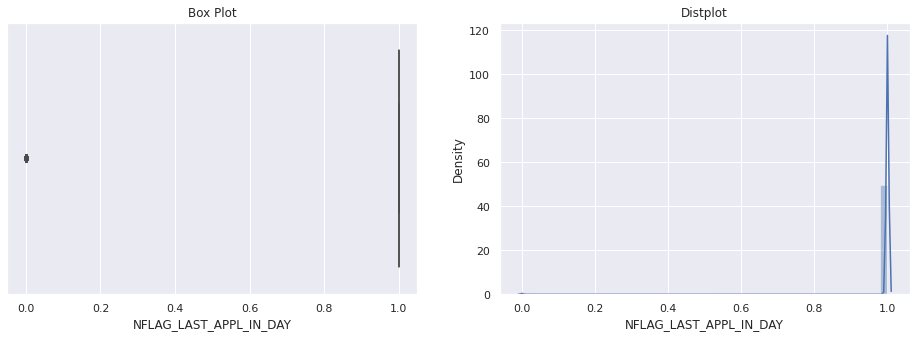

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


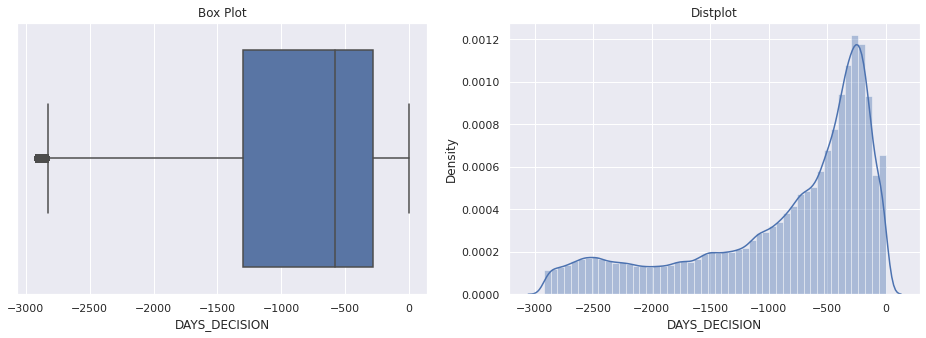

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


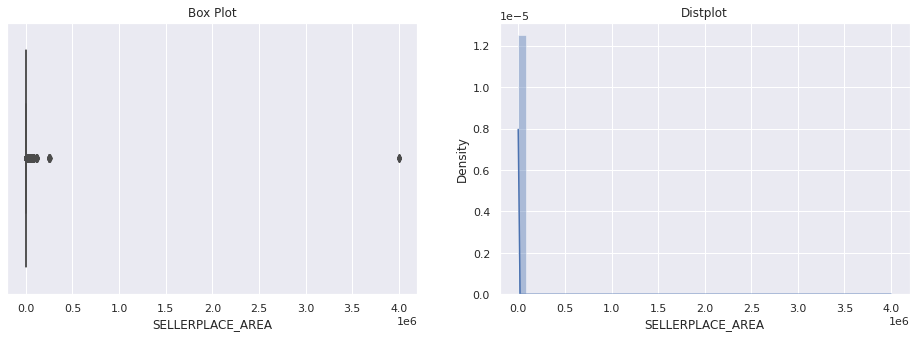

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


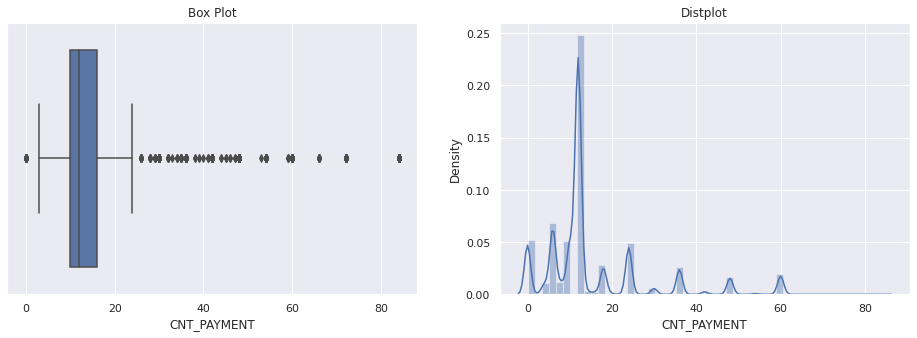

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


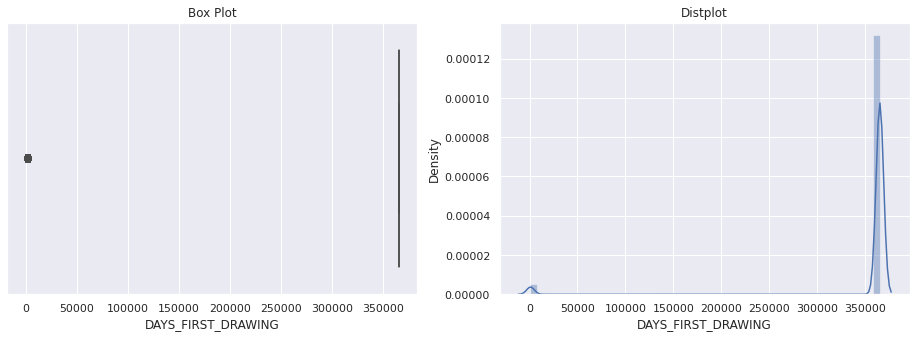

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


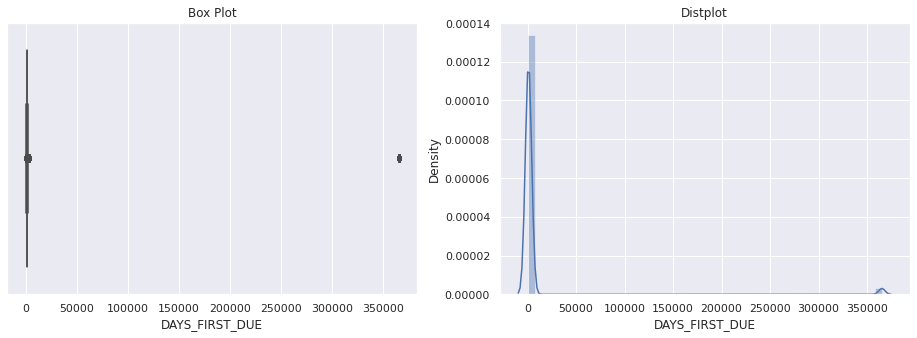

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


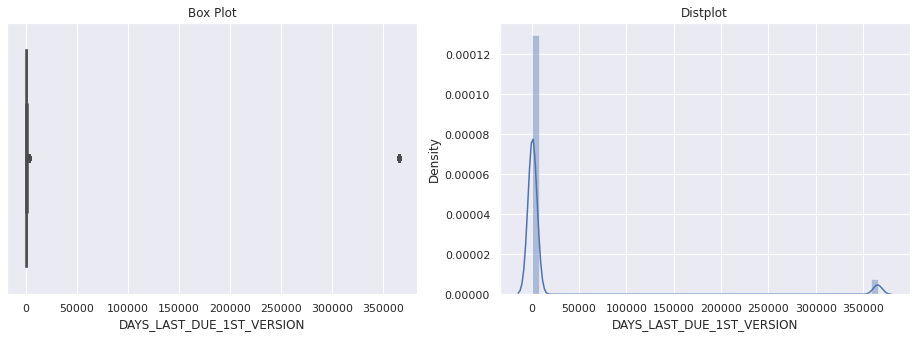

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


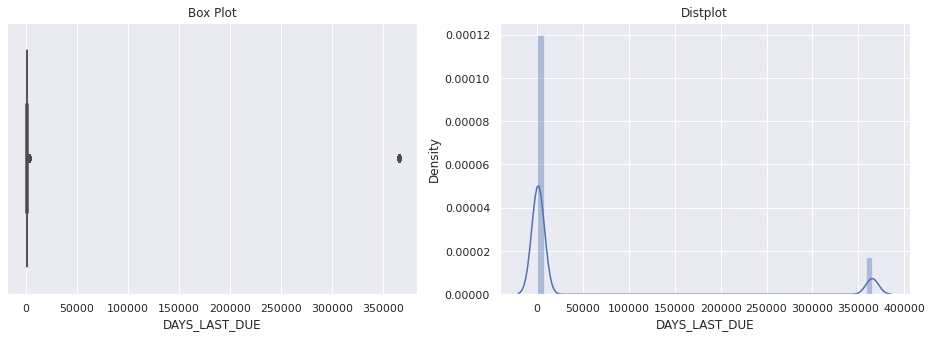

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


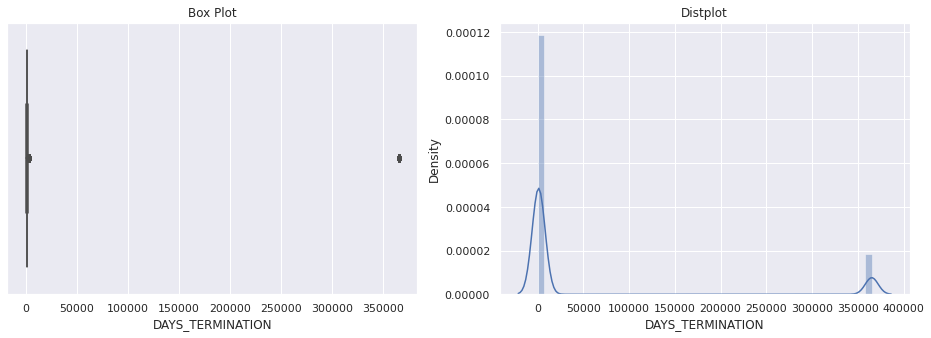

/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1326: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


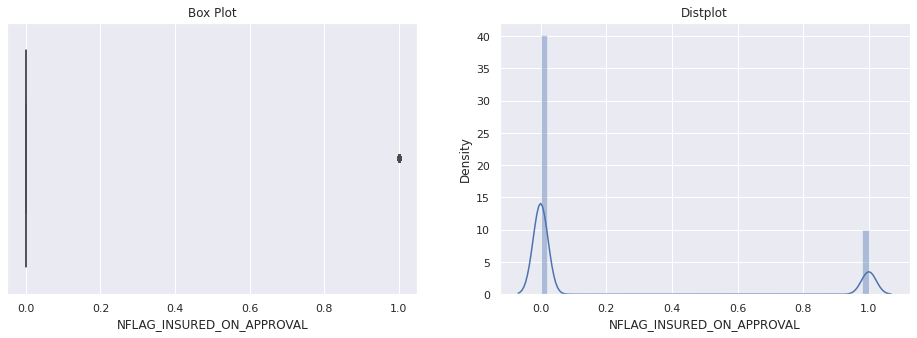

In [48]:
for i in num_data:
    Uni_Analysis_Numarical(previous,i)

In [61]:
previous['NAME_CONTRACT_STATUS'].value_counts(normalize=True)

Approved        0.620747
Canceled        0.189388
Refused         0.174036
Unused offer    0.015828
Name: NAME_CONTRACT_STATUS, dtype: float64

In [10]:
Status0=previous[previous.NAME_CONTRACT_STATUS=='Canceled']    # Dataframe with all the data related to non-defaulters
Status1=previous[previous.NAME_CONTRACT_STATUS!='Canceled']    # Dataframe with all the data related to defaulters

In [14]:
# function to count plot for categorical variables
def plotuninewapp(var):

    plt.style.use('ggplot')
    sns.despine
    fig,(ax1,ax2) = plt.subplots(1,2,figsize=(20,6))
    
    sns.countplot(x=var, data=Status0,ax=ax1)
    ax1.set_ylabel('Total Counts')
    ax1.set_title(f'Distribution of {var} for Non-Defaulters',fontsize=15)
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=40, ha="right")
    
    # Adding the normalized percentage for easier comparision between defaulter and non-defaulter
    for p in ax1.patches:
        ax1.annotate('{:.1f}%'.format((p.get_height()/len(Status0))*100), (p.get_x()+0.1, p.get_height()+50))
        
    sns.countplot(x=var, data=Status1,ax=ax2)
    ax2.set_ylabel('Total Counts')
    ax2.set_title(f'Distribution of {var} for Defaulters',fontsize=15)    
    ax2.set_xticklabels(ax2.get_xticklabels(), rotation=40, ha="right")
    
    # Adding the normalized percentage for easier comparision between defaulter and non-defaulter
    for p in ax2.patches:
        ax2.annotate('{:.1f}%'.format((p.get_height()/len(Status1))*100), (p.get_x()+0.1, p.get_height()+50))
    
    plt.show()

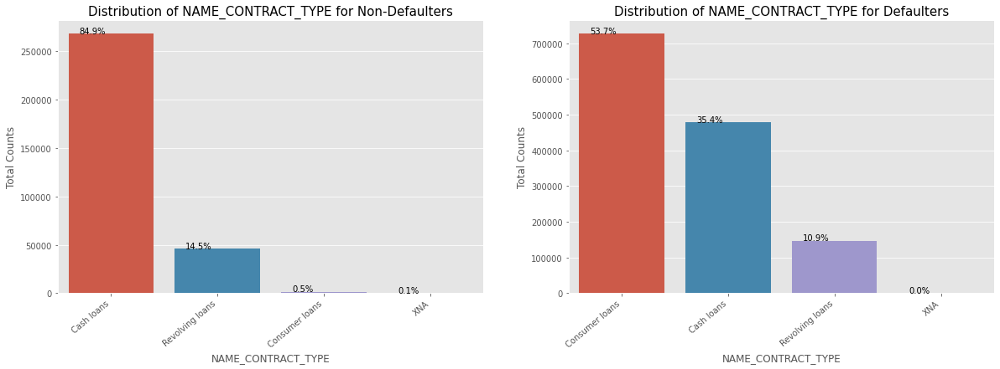

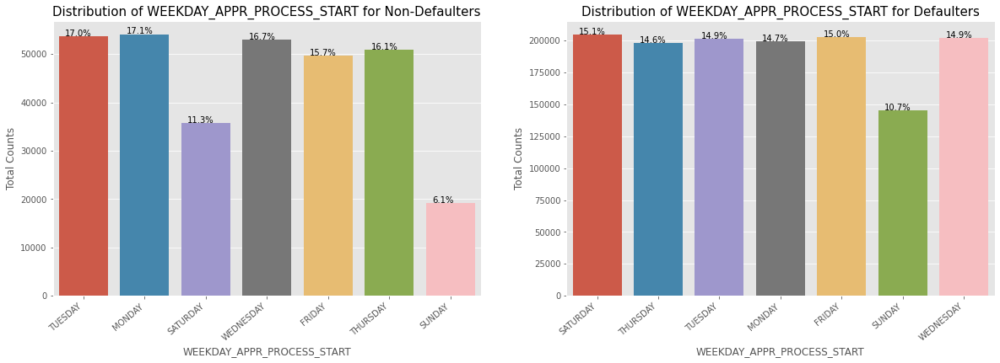

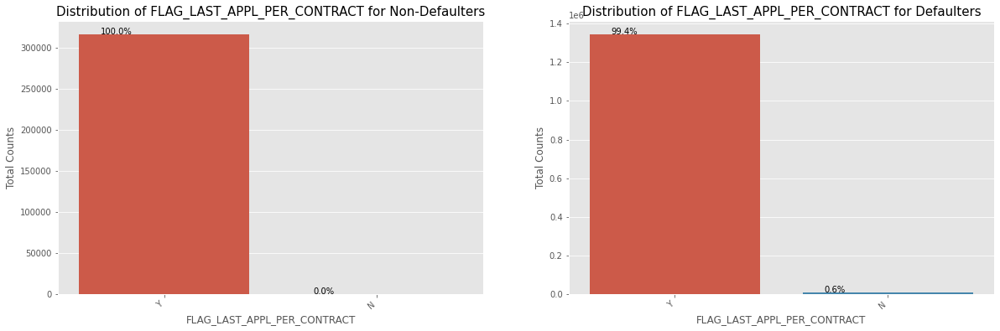

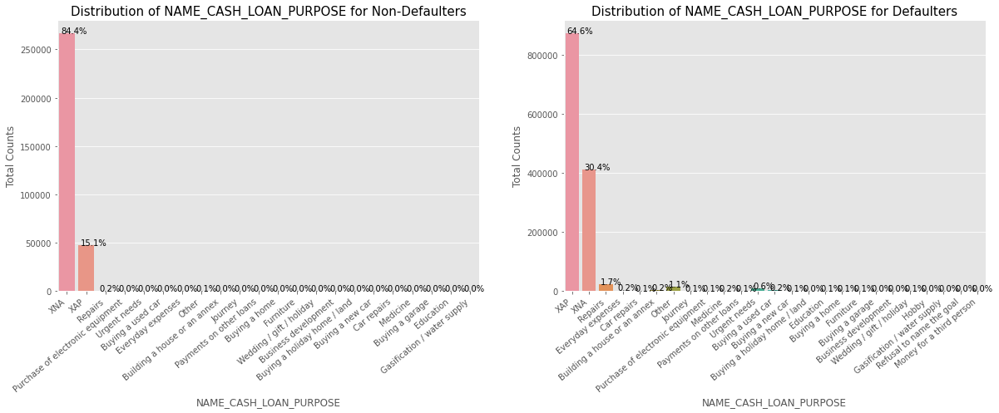

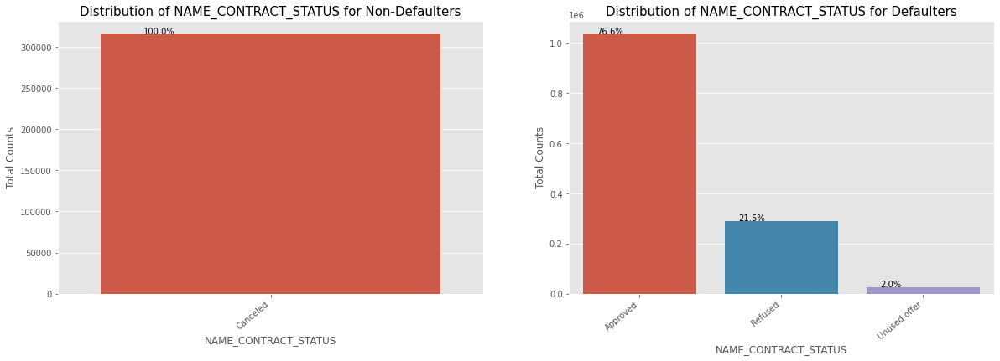

...

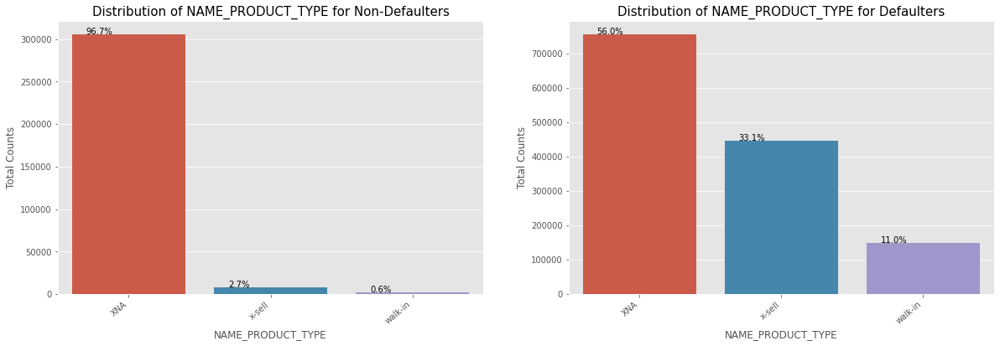

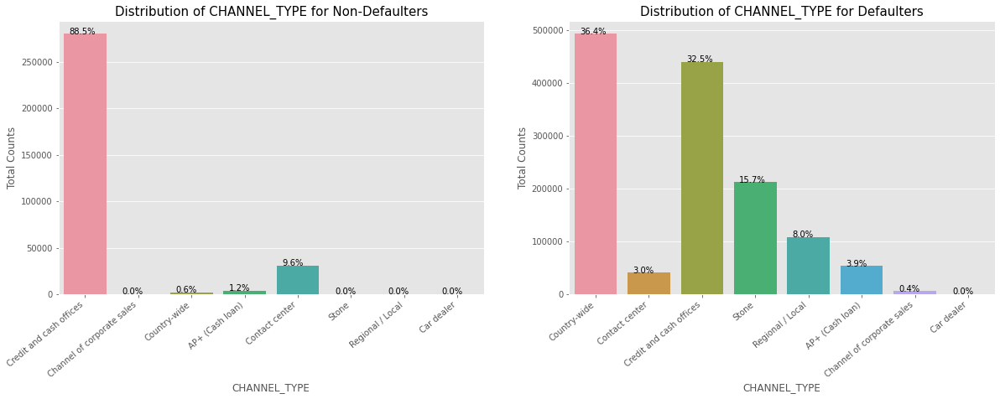

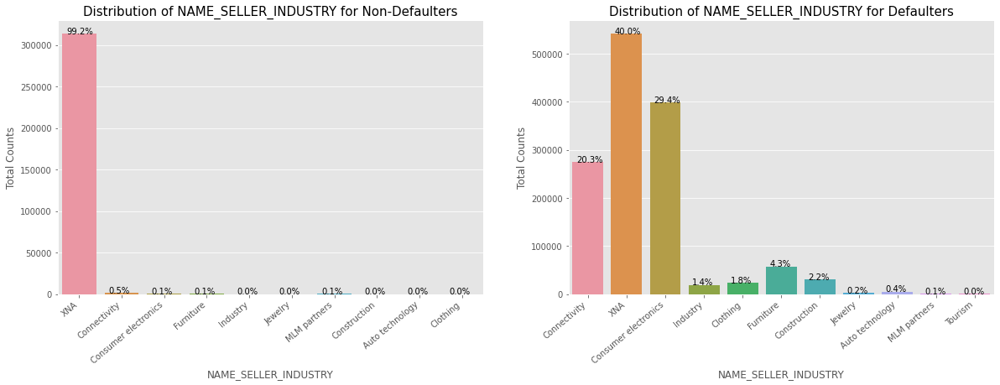

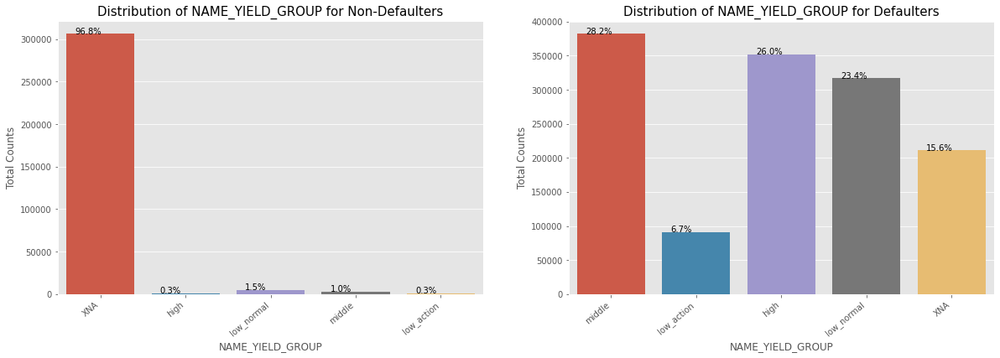

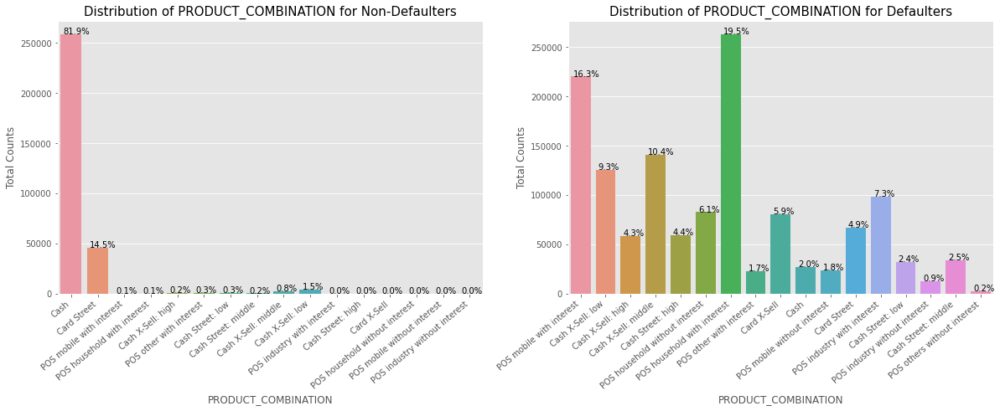

In [18]:
for i in cat_data:
    plotuninewapp(i)

In [59]:
def Uni_Analysis_Categorical(dataframe, column):
    sns.set(style='darkgrid')
    plt.figure(figsize = [12,5])
    dataframe[column].value_counts().plot.barh(width = 0.8)
    plt.title(column)
    plt.show()

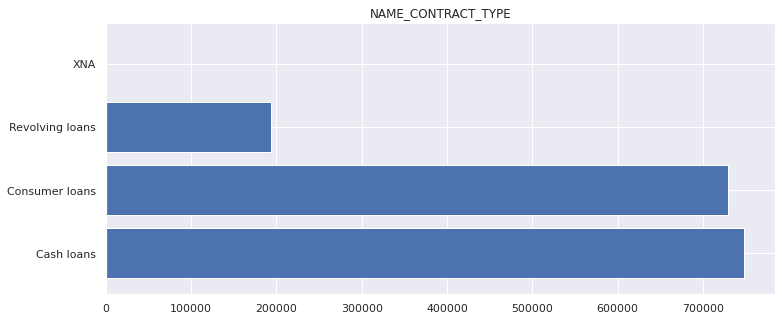

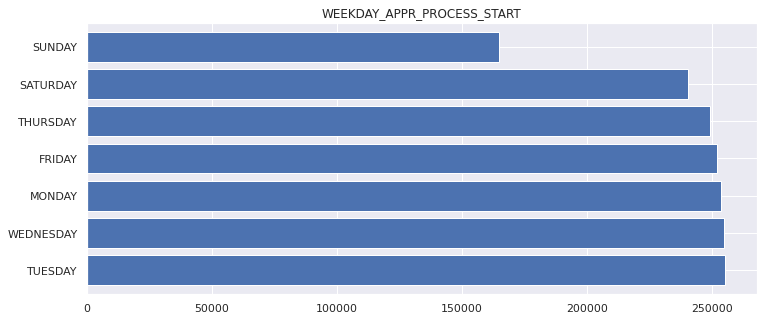

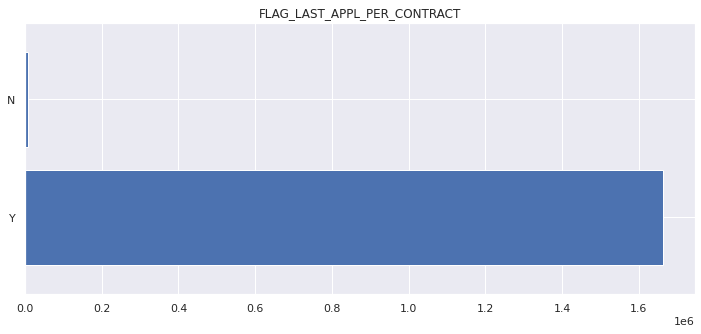

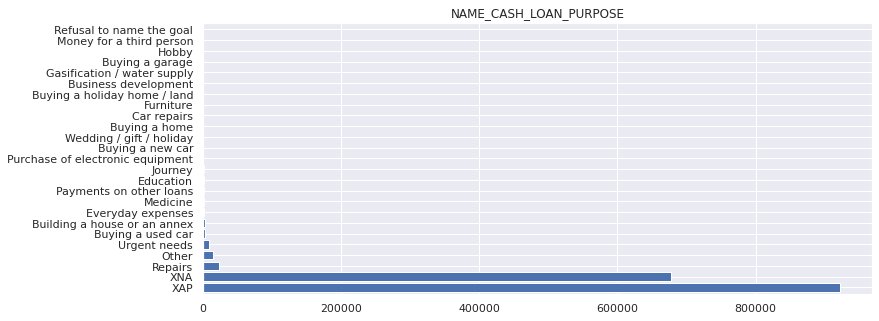

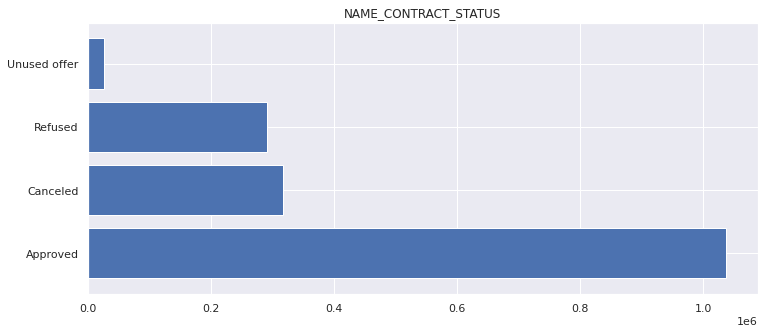

...

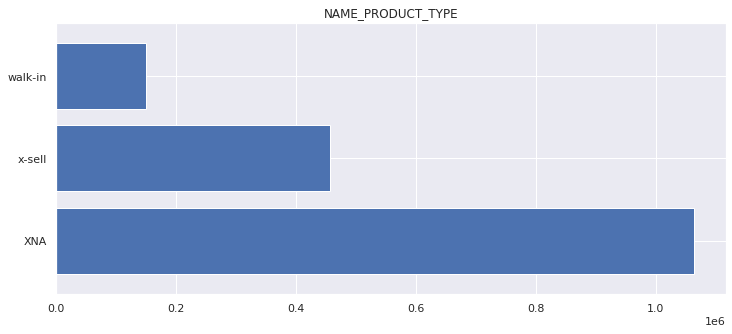

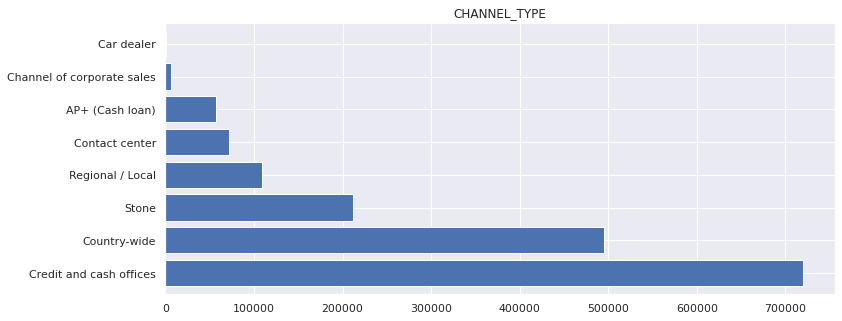

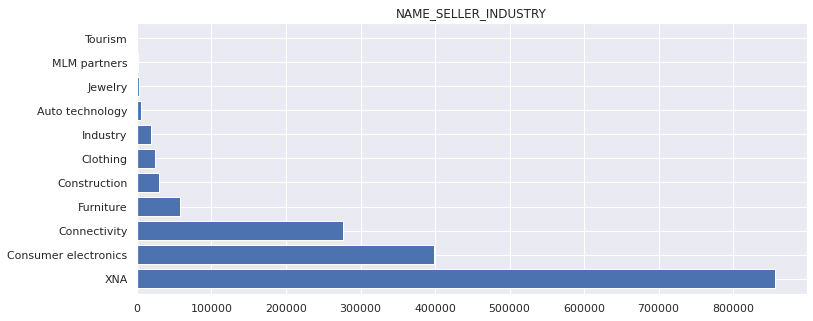

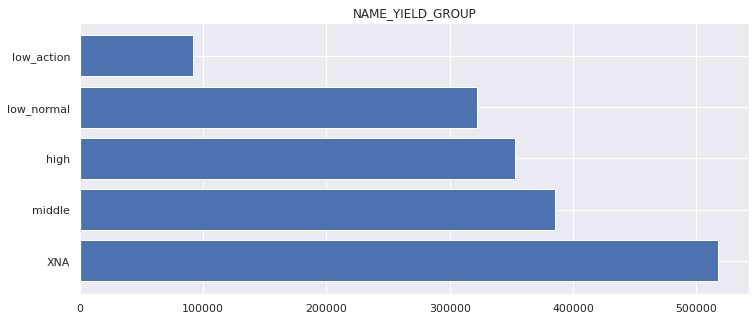

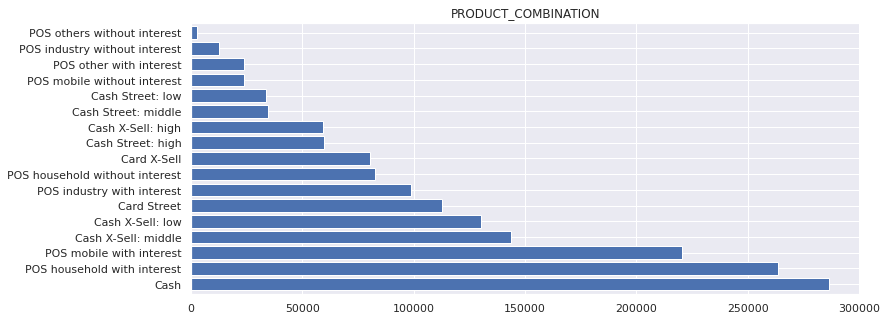

In [60]:
for i in cat_data:
    Uni_Analysis_Categorical(previous,i)

##Bivariate Analysis

In [25]:
# function to plot for categorical variables
def Target_categorical_Uni(variable):
    # other thems of plot seaborn-colorblind,seaborn-dark-palette ,classic

    plt.style.use('classic')
    sns.despine
    fig,(ax1,ax2) = plt.subplots(1,2,figsize=(25,8))
    
    sns.countplot(x=variable, data=Status0,linewidth=1,ax=ax1,edgecolor=sns.color_palette("dark", 3),hue =variable )
    ax1.set_ylabel('Total Counts')
    ax1.set_title(f'Distribution of {variable} Tagget Payment_Difficulty',fontsize=18)
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=40, ha="right")
    
    # Adding the normalized percentage for easier comparision
    for p in ax1.patches:
        ax1.annotate('{:.1f}%'.format((p.get_height()/len(Status0))*100), (p.get_x()+0.4, p.get_height()+100), ha='center')
        
    sns.countplot(x=variable, data=Status1,ax=ax2,linewidth=1,edgecolor=sns.color_palette("dark", 3),hue =variable )
    ax2.set_ylabel('Total Counts')
    ax2.set_title(f'Distribution of {variable} Tagget All_Other',fontsize = 18,)    
    ax2.set_xticklabels(ax2.get_xticklabels(), rotation=40, ha="right")
    
    # Adding the normalized percentage for easier comparision
    for p in ax2.patches:
        ax2.annotate('{:.1f}%'.format((p.get_height()/len(Status1))*100), (p.get_x()+0.4, p.get_height()+100), ha='center')
    
    plt.show()

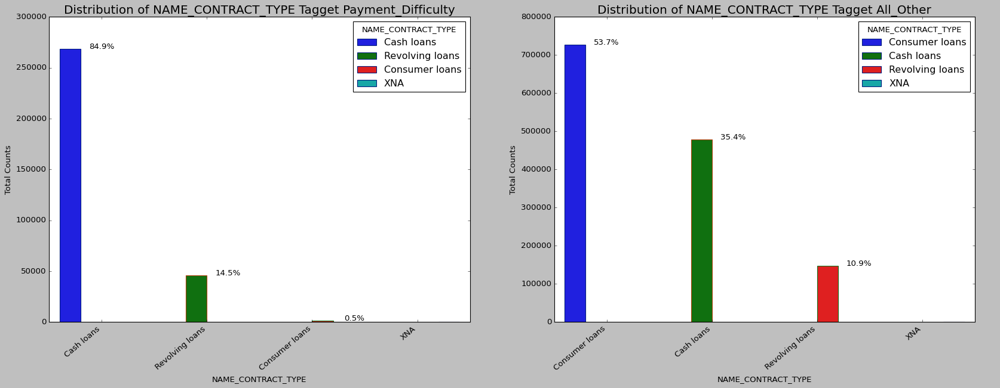

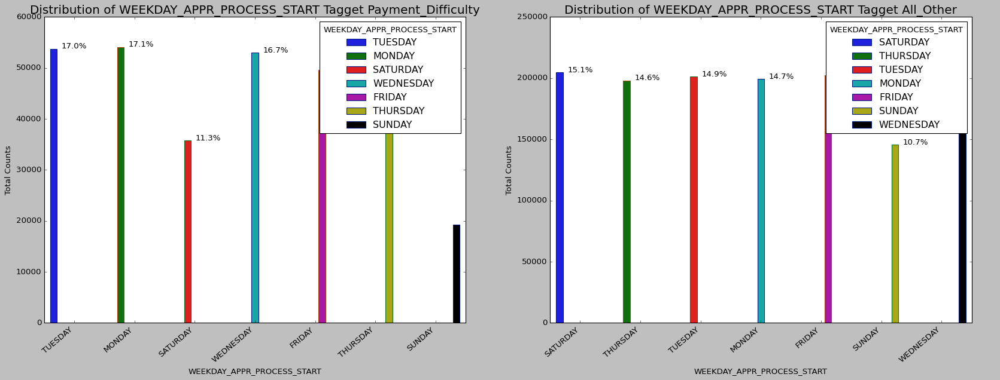

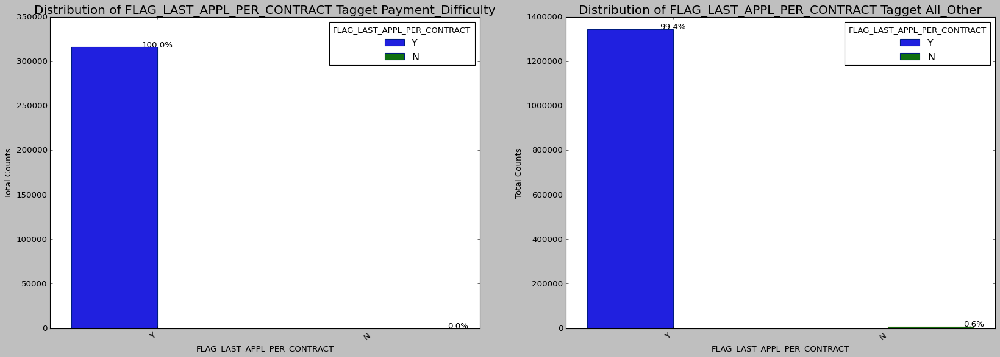

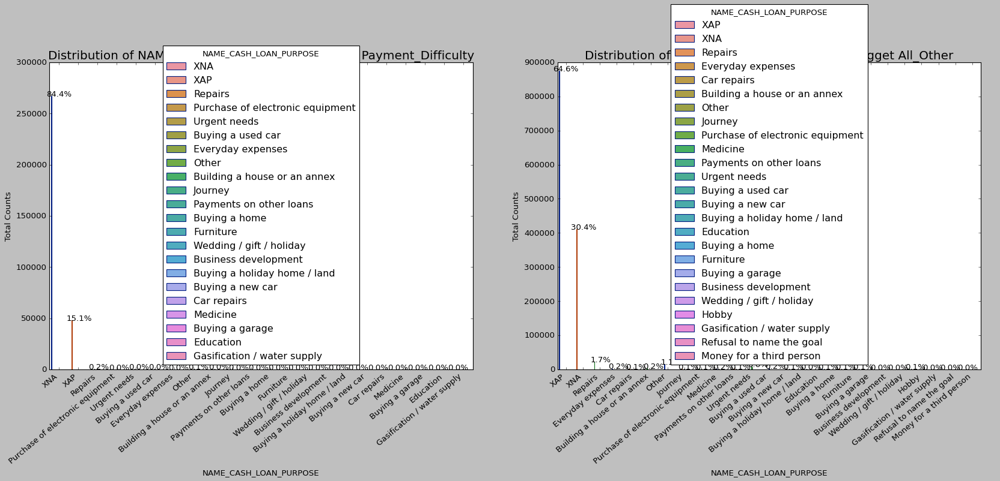

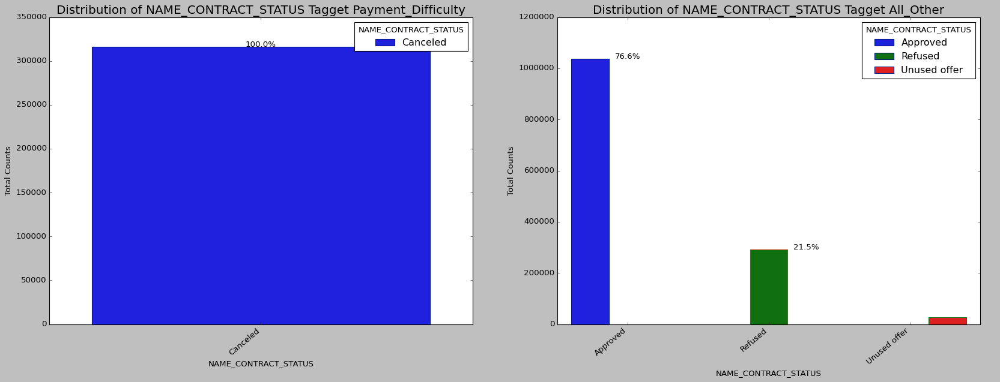

...

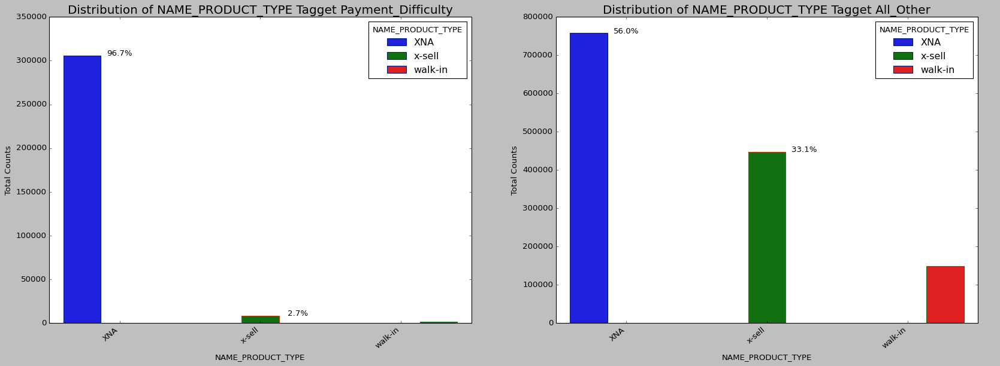

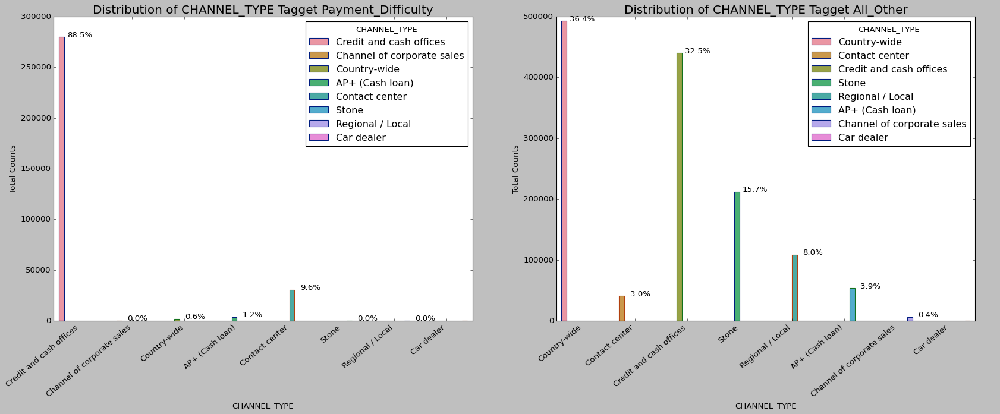

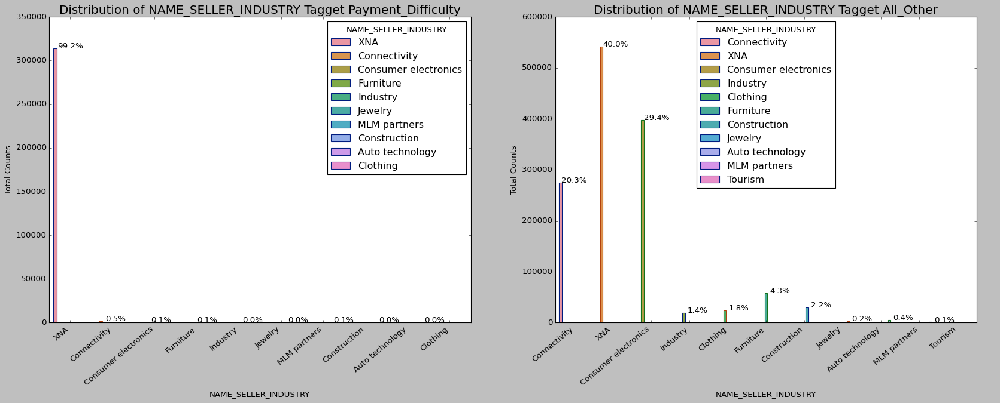

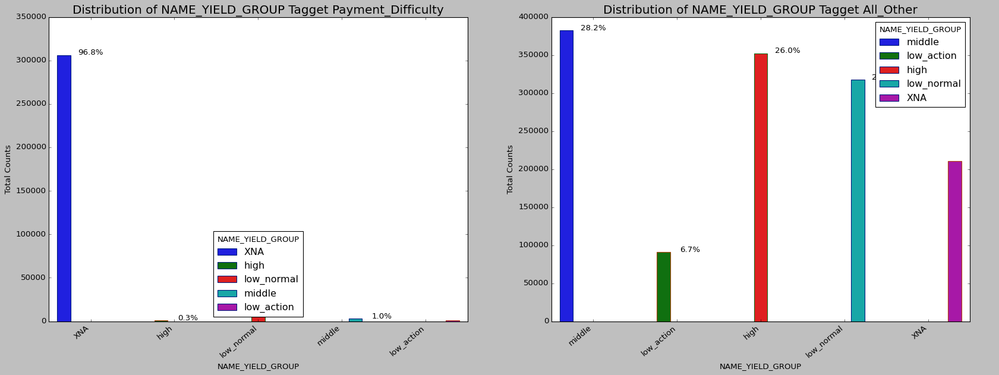

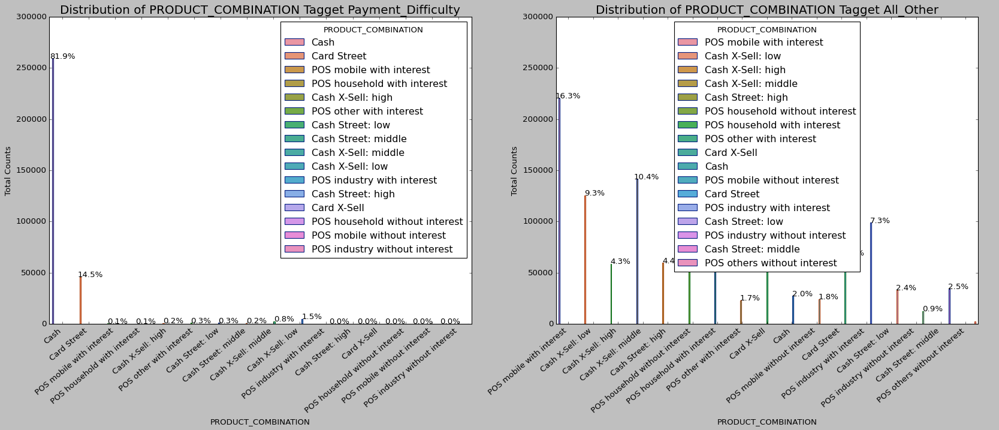

In [26]:
for i in cat_data:
    Target_categorical_Uni(i)

In [27]:
def Target_Numerical_Bi(variable_1, variable_2):
    # other thems of plot seaborn-colorblind,seaborn-dark-palette ,classic

    plt.style.use('ggplot')
    sns.despine
    fig,(ax1,ax2) = plt.subplots(1,2,figsize=(20,6))
    
    sns.scatterplot(x=variable_1, y=variable_2,data=Status0,ax=ax1)
    ax1.set_xlabel(variable_1)    
    ax1.set_ylabel(variable_2)
    ax1.set_title(f'{variable_1} vs {variable_2} Tagget Payment_Difficulty',fontsize=15)
    
    sns.scatterplot(x=variable_1, y=variable_2,data=Status1,ax=ax2)
    ax2.set_xlabel(variable_1)    
    ax2.set_ylabel(variable_2)
    ax2.set_title(f'{variable_1} vs {variable_2} Tagget All_Other',fontsize=15)
            
    plt.show()

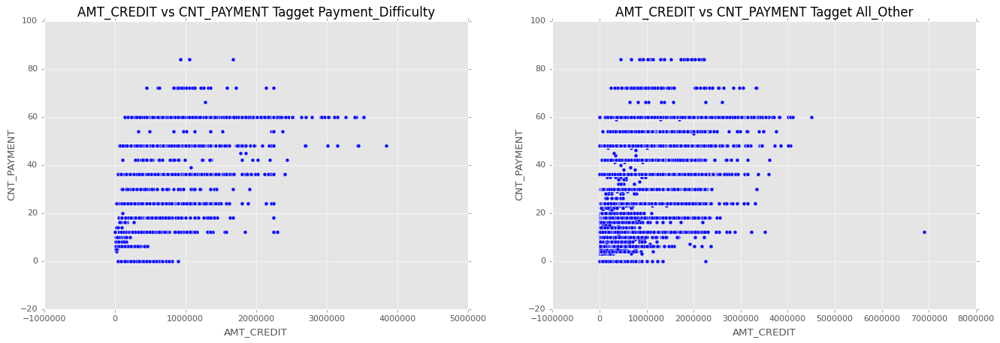

In [31]:
Target_Numerical_Bi('AMT_CREDIT', 'CNT_PAYMENT')

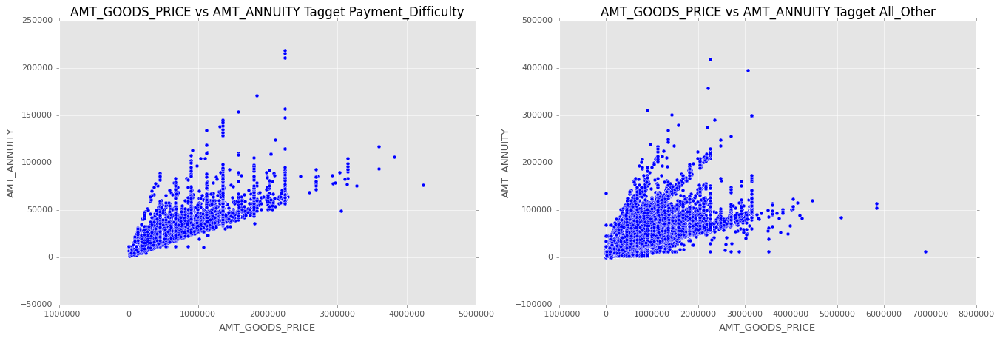

In [30]:
Target_Numerical_Bi('AMT_GOODS_PRICE', 'AMT_ANNUITY')

In [32]:
# Count plotting in logarithmic scale

def uniplot(df,col,title,hue =None):
    
    sns.set_style('whitegrid')
    sns.set_context('talk')
    plt.rcParams["axes.labelsize"] = 20
    plt.rcParams['axes.titlesize'] = 22
    plt.rcParams['axes.titlepad'] = 30
    
    
    temp = pd.Series(data = hue)
    fig, ax = plt.subplots()
    width = len(df[col].unique()) + 7 + 4*len(temp.unique())
    fig.set_size_inches(width , 8)
    plt.xticks(rotation=45)
    plt.yscale('log')
    plt.title(title)
    ax = sns.countplot(data = df, x= col, order=df[col].value_counts().index,hue = hue,palette='magma') 
        
    plt.show()

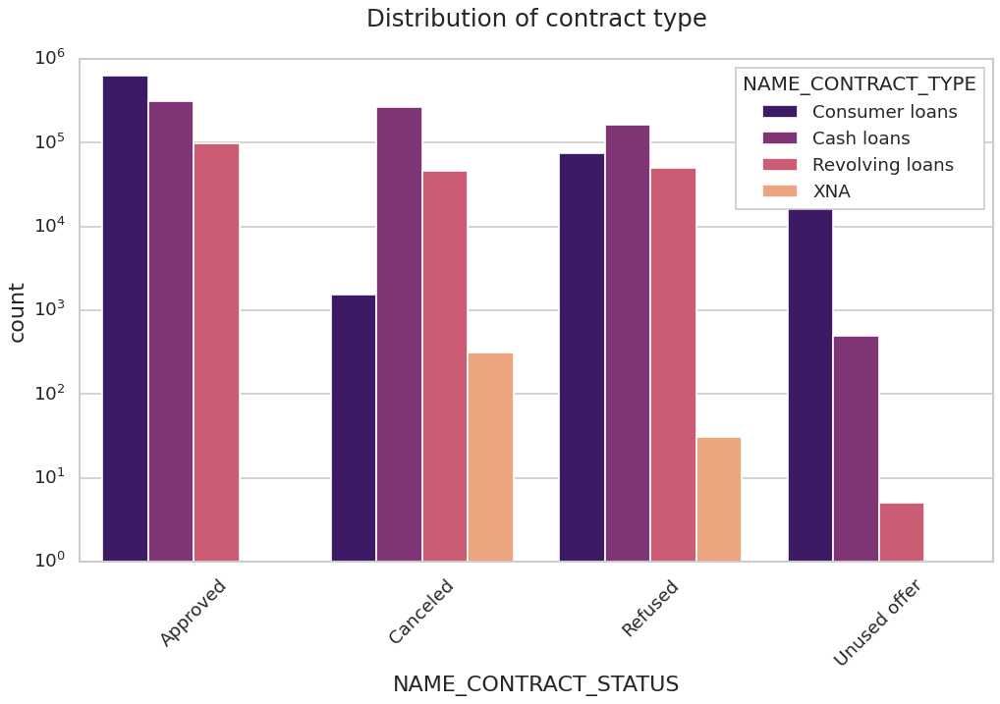

In [35]:
uniplot(previous,col='NAME_CONTRACT_STATUS',title='Distribution of contract type',hue='NAME_CONTRACT_TYPE')

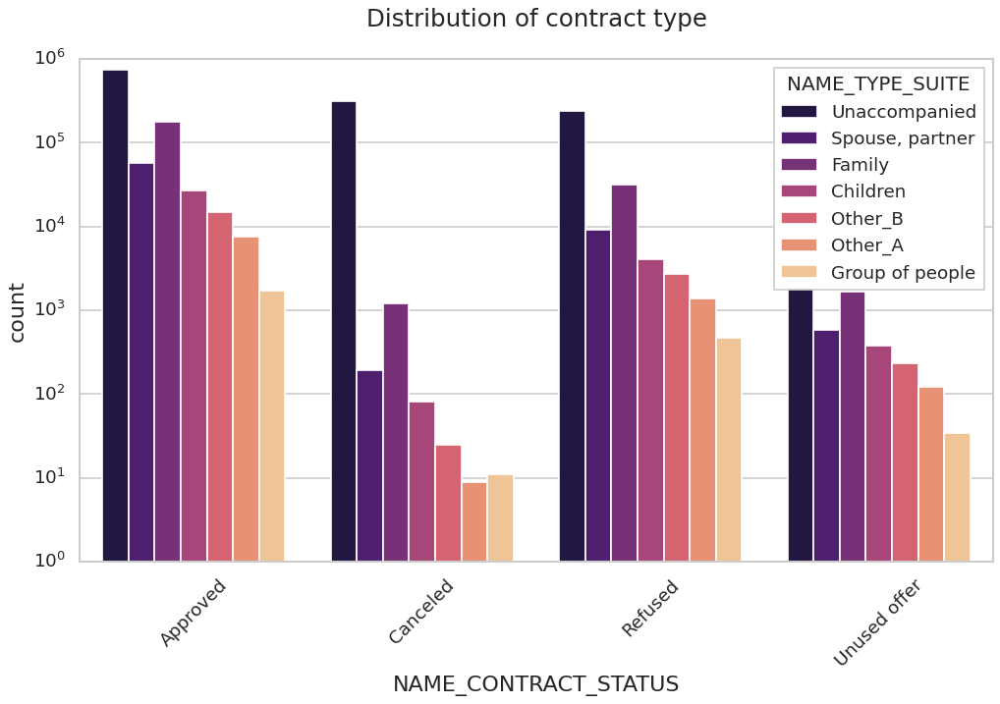

In [36]:
uniplot(previous,col='NAME_CONTRACT_STATUS',title='Distribution of contract type',hue='NAME_TYPE_SUITE')

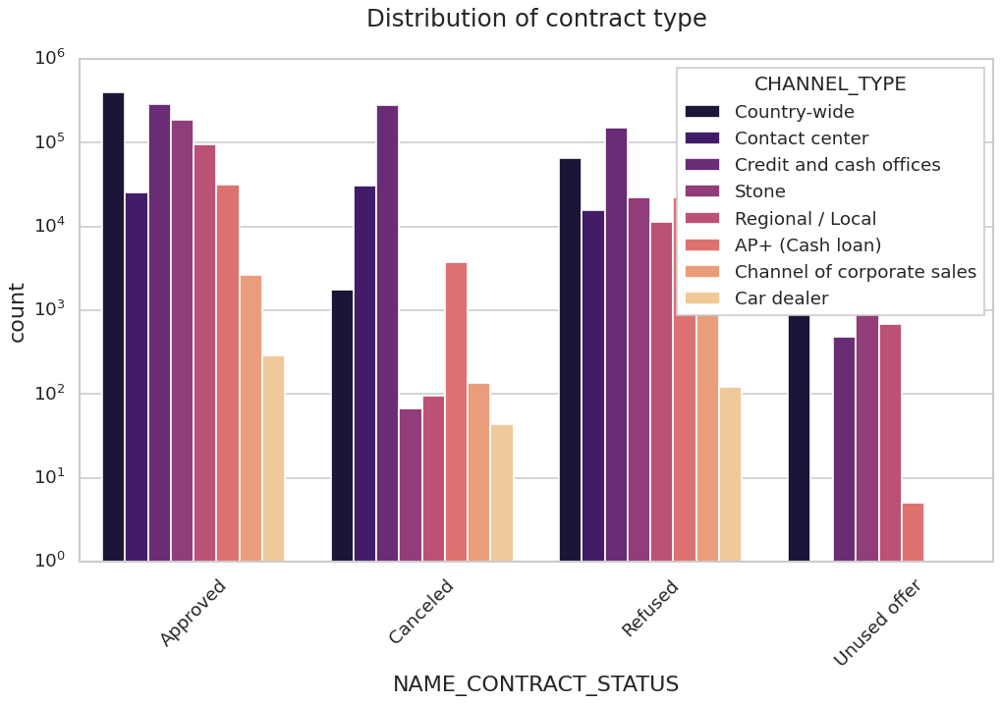

In [37]:
uniplot(previous,col='NAME_CONTRACT_STATUS',title='Distribution of contract type',hue='CHANNEL_TYPE')

In [28]:
num_data.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'AMT_ANNUITY', 'AMT_APPLICATION',
       'AMT_CREDIT', 'AMT_GOODS_PRICE', 'HOUR_APPR_PROCESS_START',
       'NFLAG_LAST_APPL_IN_DAY', 'DAYS_DECISION', 'SELLERPLACE_AREA',
       'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE',
       'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION',
       'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

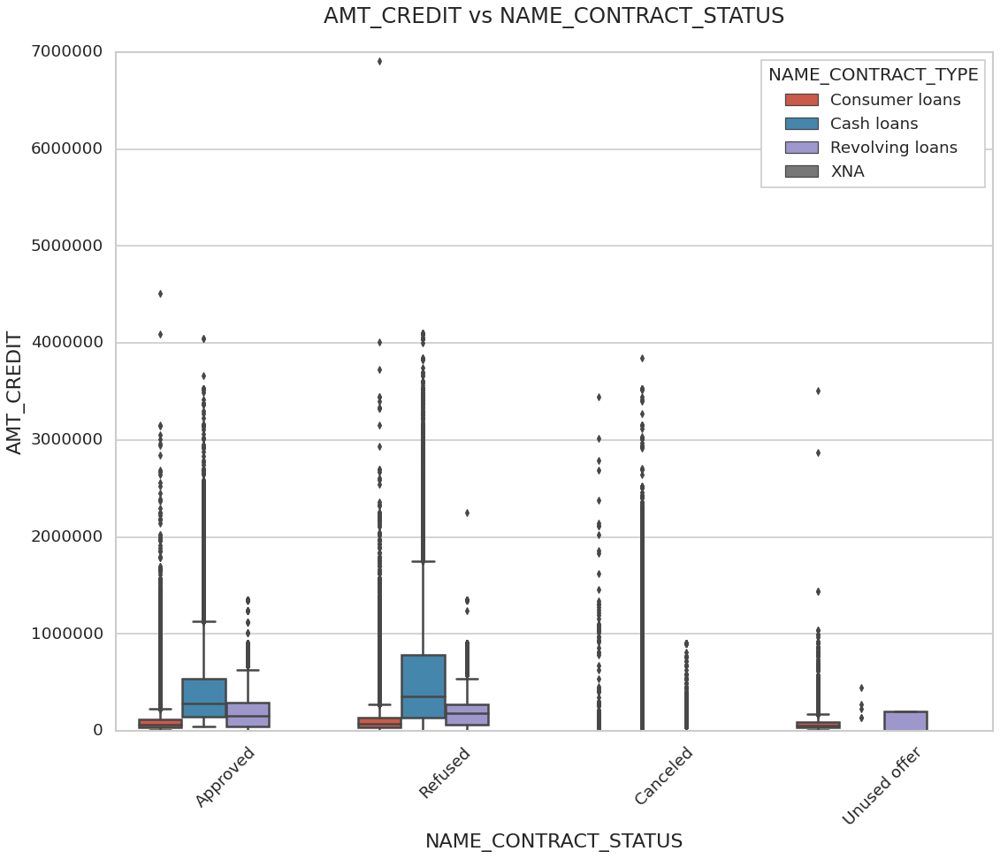

In [43]:
# Box plotting for Credit amount
plt.figure(figsize=(16,12))
plt.xticks(rotation=45)
sns.boxplot(data = previous, x='NAME_CONTRACT_STATUS',y='AMT_CREDIT', hue ='NAME_CONTRACT_TYPE',orient='v')
plt.title('AMT_CREDIT vs NAME_CONTRACT_STATUS')
plt.show()

#Top 10 correlations in the numerical features of the previous application dataset

In [44]:
num_data2 = num_data.copy()
# Select lower triangle of correlation matrix
corr_matrix = num_data2.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
# Find index of feature columns with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]
# Drop features 
num_data2 = num_data2.drop(num_data2[to_drop], axis=1)

def get_redundant_pairs(df):
    '''Get diagonal and lower triangular pairs of correlation matrix'''
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

def get_top_abs_correlations(df, n=10):
    au_corr = df.corr().abs().unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[0:n]

print("Top Absolute Correlations")
print(get_top_abs_correlations(num_data2, 10))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  after removing the cwd from sys.path.


Top Absolute Correlations
DAYS_FIRST_DUE             DAYS_LAST_DUE_1ST_VERSION    0.941535
DAYS_DECISION              DAYS_FIRST_DUE               0.822440
AMT_ANNUITY                AMT_APPLICATION              0.793745
DAYS_DECISION              DAYS_LAST_DUE_1ST_VERSION    0.761231
AMT_APPLICATION            CNT_PAYMENT                  0.634161
DAYS_FIRST_DUE             DAYS_LAST_DUE                0.356632
AMT_ANNUITY                CNT_PAYMENT                  0.354692
DAYS_LAST_DUE_1ST_VERSION  DAYS_LAST_DUE                0.256875
AMT_ANNUITY                DAYS_LAST_DUE_1ST_VERSION    0.243272
AMT_APPLICATION            NFLAG_INSURED_ON_APPROVAL    0.242207
dtype: float64


##Analysis on the Merged Data

In [47]:
merged_data = pd.merge(df,previous,on='SK_ID_CURR')

In [48]:
merged_data.shape

(1413701, 154)

In [49]:
merged_data.sample(5)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
610311,254550,0,Cash loans,F,N,Y,0,135000.0,189000.0,6916.5,...,Connectivity,12.0,high,POS mobile with interest,365243.0,2720.0,2390.0,2390.0,2389.0,0.0
1362274,443306,0,Cash loans,M,Y,Y,0,157500.0,640080.0,31131.0,...,Consumer electronics,10.0,low_normal,POS household without interest,365243.0,2647.0,2377.0,2377.0,2364.0,0.0
703409,278139,0,Cash loans,F,Y,Y,0,90000.0,126000.0,7362.0,...,XNA,18.0,middle,Cash X-Sell: middle,365243.0,536.0,26.0,86.0,78.0,1.0
1188542,398399,0,Cash loans,M,Y,Y,0,270000.0,754740.0,29245.5,...,Consumer electronics,6.0,middle,POS household with interest,365243.0,193.0,43.0,133.0,131.0,1.0
1170351,393844,0,Cash loans,F,N,Y,1,180000.0,747886.5,39973.5,...,Consumer electronics,12.0,middle,POS household with interest,365243.0,1010.0,680.0,950.0,943.0,0.0


In [50]:
merged_data.info("all")

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413701 entries, 0 to 1413700
Data columns (total 154 columns):
 #    Column                        Dtype  
---   ------                        -----  
 0    SK_ID_CURR                    int64  
 1    TARGET                        int64  
 2    NAME_CONTRACT_TYPE_x          object 
 3    CODE_GENDER                   object 
 4    FLAG_OWN_CAR                  object 
 5    FLAG_OWN_REALTY               object 
 6    CNT_CHILDREN                  int64  
 7    AMT_INCOME_TOTAL              float64
 8    AMT_CREDIT_x                  float64
 9    AMT_ANNUITY_x                 float64
 10   AMT_GOODS_PRICE_x             float64
 11   NAME_TYPE_SUITE_x             object 
 12   NAME_INCOME_TYPE              object 
 13   NAME_EDUCATION_TYPE           object 
 14   NAME_FAMILY_STATUS            object 
 15   NAME_HOUSING_TYPE             object 
 16   REGION_POPULATION_RELATIVE    float64
 17   DAYS_BIRTH                    int64  
 18   

#Missing values identification

In [51]:
round((merged_data.isnull().sum()*100/len(merged_data)).sort_values(ascending=False),2)

COMMONAREA_MODE                 69.69
COMMONAREA_AVG                  69.69
COMMONAREA_MEDI                 69.69
NONLIVINGAPARTMENTS_MEDI        69.30
NONLIVINGAPARTMENTS_AVG         69.30
                                ...  
REG_REGION_NOT_LIVE_REGION       0.00
HOUR_APPR_PROCESS_START_x        0.00
WEEKDAY_APPR_PROCESS_START_x     0.00
REGION_RATING_CLIENT_W_CITY      0.00
NFLAG_INSURED_ON_APPROVAL        0.00
Length: 154, dtype: float64

Discarding all the features having more than 50% null values

In [52]:
perc = 50.0
min_count =  int(((100-perc)/100)*merged_data.shape[0] + 1)
merged_data = merged_data.dropna( axis=1, 
                thresh=min_count)
merged_data.shape

(1413701, 120)

In [55]:
#Converting all numeric columns of dataframe to absolute value
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
for c in [c for c in merged_data.columns if merged_data[c].dtype in numerics]:
    merged_data[c] = merged_data[c].abs()

Missing value treatment

In [57]:
#Imputing missing values
#Strategy : Median for numeric columns and Mode imputation for Object or Categorical ones
for i in merged_data.columns: 
  if (merged_data[i].dtype=='float64') | (merged_data[i].dtype=='int64'):
    merged_data[i].fillna(merged_data[i].median(), inplace=True)
  else:
    merged_data[i].fillna(merged_data[i].mode()[0], inplace=True)

In [66]:
m_num_data = merged_data.select_dtypes(include=[np.number])
m_cat_data = merged_data.select_dtypes(exclude=[np.number])
print(m_num_data.shape[1])
print(m_cat_data.shape[1])

90
30


#Outlier detection

In [59]:
merged_data.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,NFLAG_LAST_APPL_IN_DAY,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,...,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06
mean,2.784813e+05,8.655296e-02,4.048933e-01,1.733160e+05,5.875537e+05,2.701688e+04,5.276522e+05,2.074985e-02,1.632105e+04,7.266347e+04,...,9.964321e-01,8.803670e+02,3.158884e+02,1.517141e+01,3.514604e+05,9.779374e+03,2.120309e+04,4.764046e+04,5.104151e+04,1.993661e-01
std,1.028118e+05,2.811789e-01,7.173454e-01,1.985734e+05,3.849173e+05,1.395072e+04,3.531028e+05,1.334702e-02,4.344557e+03,1.433374e+05,...,5.962560e-02,7.835402e+02,7.695045e+03,1.299505e+01,6.949519e+04,5.577241e+04,8.375838e+04,1.216220e+05,1.253102e+05,3.995239e-01
min,1.000020e+05,0.000000e+00,0.000000e+00,2.565000e+04,4.500000e+04,1.615500e+03,4.050000e+04,2.900000e-04,7.489000e+03,0.000000e+00,...,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,2.000000e+00,2.000000e+00,0.000000e+00,2.000000e+00,2.000000e+00,0.000000e+00
25%,1.893640e+05,0.000000e+00,0.000000e+00,1.125000e+05,2.700000e+05,1.682100e+04,2.385000e+05,1.003200e-02,1.273900e+04,1.042000e+03,...,1.000000e+00,2.710000e+02,1.000000e+00,1.000000e+01,3.652430e+05,7.380000e+02,5.280000e+02,8.590000e+02,8.630000e+02,0.000000e+00
50%,2.789920e+05,0.000000e+00,0.000000e+00,1.575000e+05,5.084955e+05,2.492550e+04,4.500000e+05,1.885000e-02,1.604400e+04,2.401000e+03,...,1.000000e+00,5.820000e+02,4.000000e+00,1.200000e+01,3.652430e+05,9.210000e+02,7.410000e+02,1.155000e+03,1.171000e+03,0.000000e+00
75%,3.675560e+05,0.000000e+00,1.000000e+00,2.070000e+05,8.079840e+05,3.454200e+04,6.795000e+05,2.866300e-02,1.998000e+04,6.313000e+03,...,1.000000e+00,1.313000e+03,8.500000e+01,1.800000e+01,3.652430e+05,1.146000e+03,1.010000e+03,1.542000e+03,1.570000e+03,0.000000e+00
max,4.562550e+05,1.000000e+00,1.900000e+01,1.170000e+08,4.050000e+06,2.250000e+05,4.050000e+06,7.250800e-02,2.520100e+04,3.652430e+05,...,1.000000e+00,2.922000e+03,4.000000e+06,8.400000e+01,3.652430e+05,3.652430e+05,3.652430e+05,3.652430e+05,3.652430e+05,1.000000e+00


Using min, max and standard deviation values in the result, we could easily identify the features with outliers

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


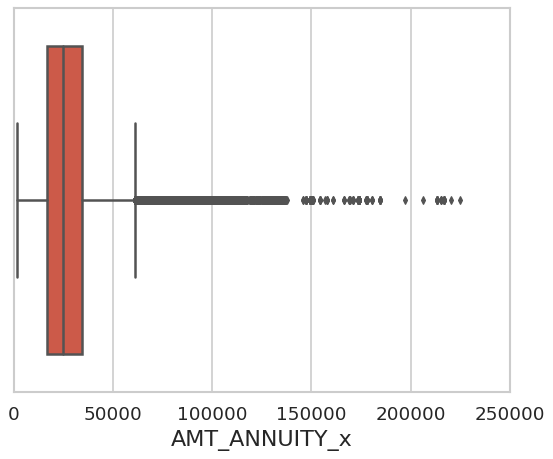

In [62]:
#Observing the outliers
sns.boxplot(merged_data.AMT_ANNUITY_x)
plt.show()

In [67]:
#Removing outliers and storing the treated columns into original dataframe
standard_deviations = 1.5
m_num_data=m_num_data[m_num_data.apply(lambda x: np.abs(x - x.mean()) / x.std() < standard_deviations).all(axis=1)]
merged_data.select_dtypes('number').columns = m_num_data.columns

##Bivariate Analysis


In [71]:
Target_Variable_Payment_Difficulty = merged_data[merged_data.TARGET == 1]
Target_Variable_All_Other = merged_data[merged_data.TARGET == 0]

In [72]:
# function to plot for categorical variables
def Target_categorical_Uni(variable):
    # other thems of plot seaborn-colorblind,seaborn-dark-palette ,classic

    plt.style.use('classic')
    sns.despine
    fig,(ax1,ax2) = plt.subplots(1,2,figsize=(25,8))
    
    sns.countplot(x=variable, data=Target_Variable_Payment_Difficulty,linewidth=1,ax=ax1,edgecolor=sns.color_palette("dark", 3),hue =variable )
    ax1.set_ylabel('Total Counts')
    ax1.set_title(f'Distribution of {variable} Tagget Payment_Difficulty',fontsize=18)
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=40, ha="right")
    
    # Adding the normalized percentage for easier comparision
    for p in ax1.patches:
        ax1.annotate('{:.1f}%'.format((p.get_height()/len(Target_Variable_Payment_Difficulty))*100), (p.get_x()+0.4, p.get_height()+100), ha='center')
        
    sns.countplot(x=variable, data=Target_Variable_All_Other,ax=ax2,linewidth=1,edgecolor=sns.color_palette("dark", 3),hue =variable )
    ax2.set_ylabel('Total Counts')
    ax2.set_title(f'Distribution of {variable} Tagget All_Other',fontsize = 18,)    
    ax2.set_xticklabels(ax2.get_xticklabels(), rotation=40, ha="right")
    
    # Adding the normalized percentage for easier comparision
    for p in ax2.patches:
        ax2.annotate('{:.1f}%'.format((p.get_height()/len(Target_Variable_All_Other))*100), (p.get_x()+0.4, p.get_height()+100), ha='center')
    
    plt.show()

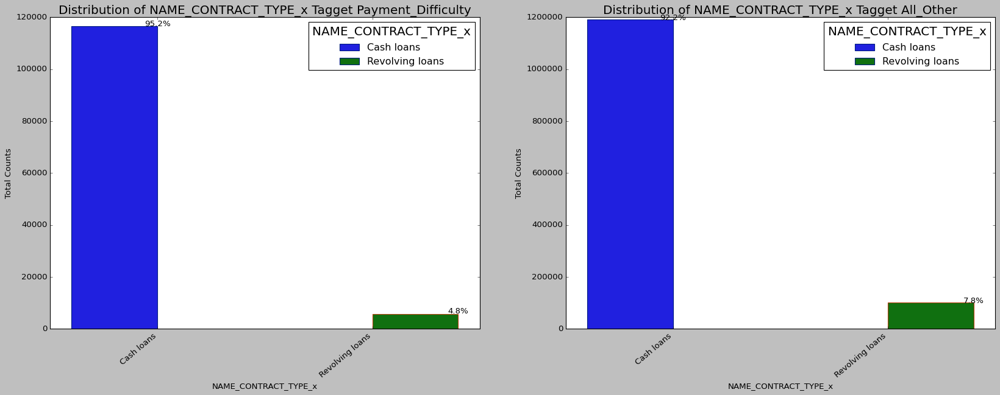

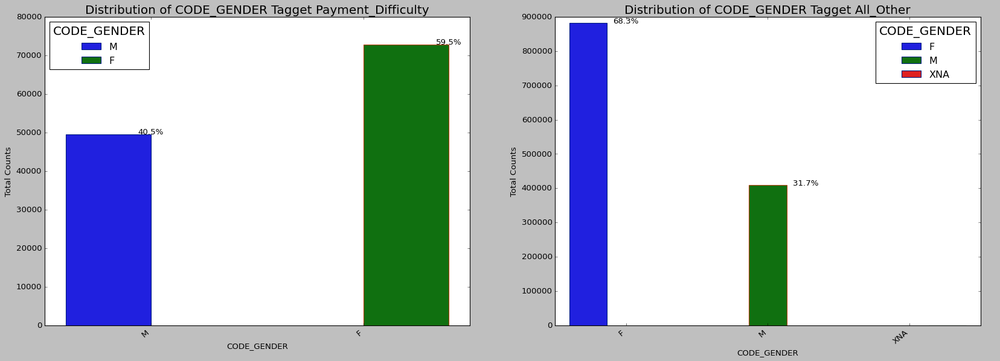

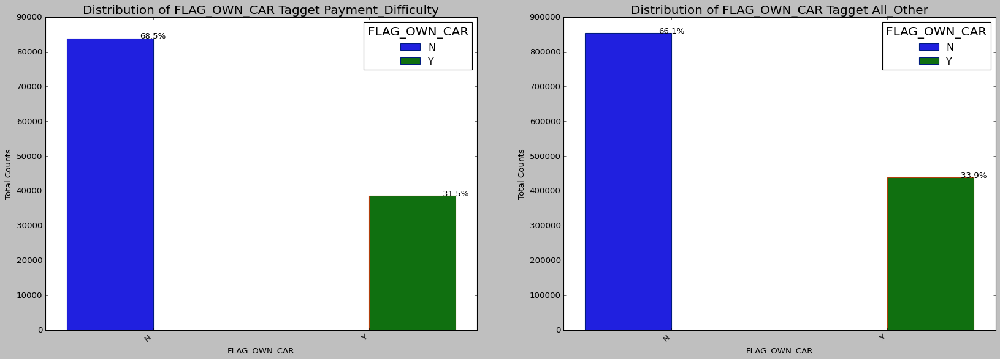

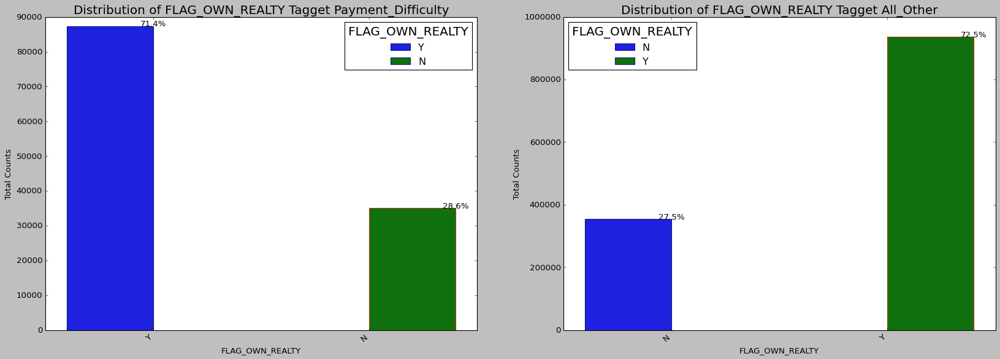

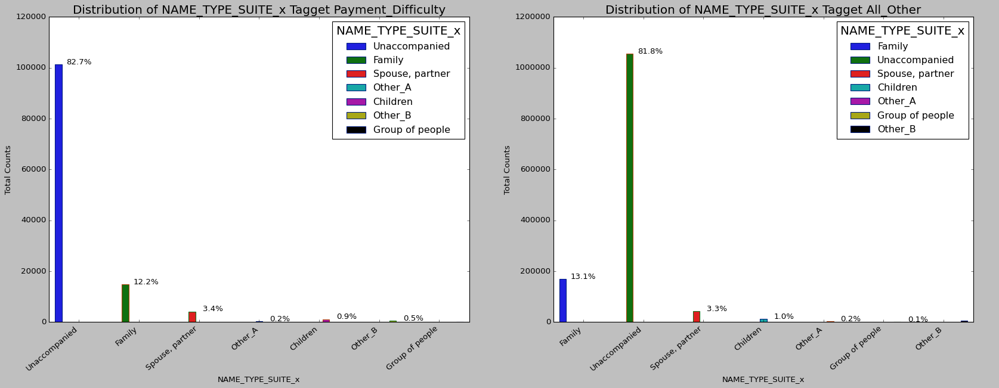

...

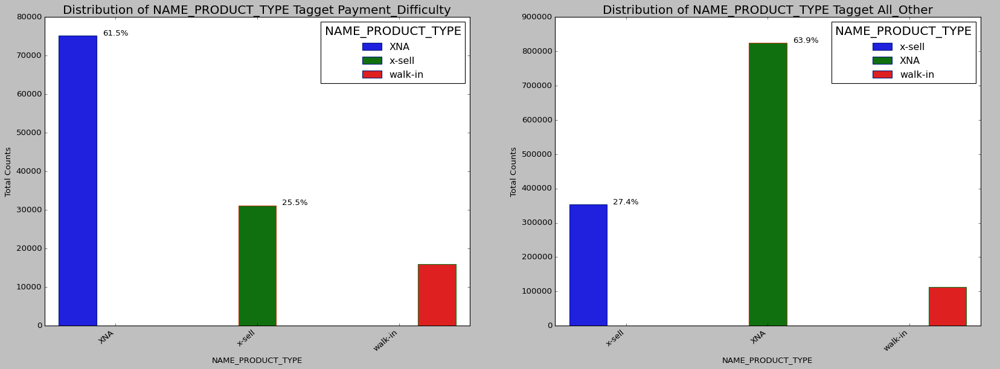

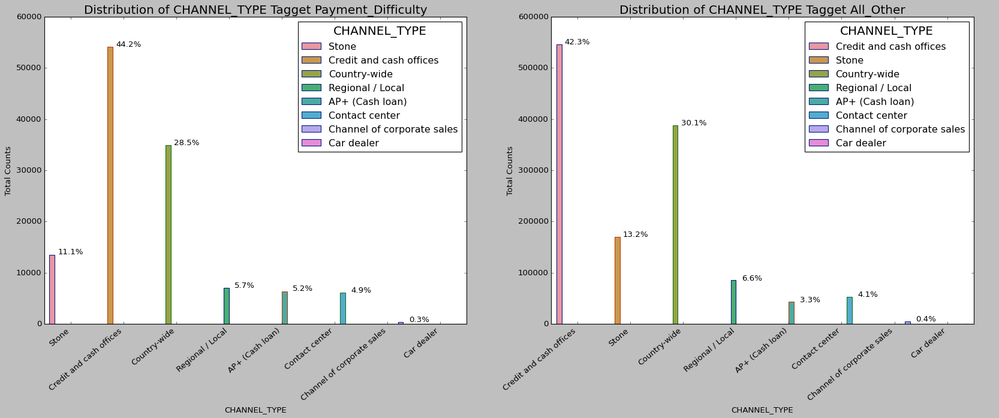

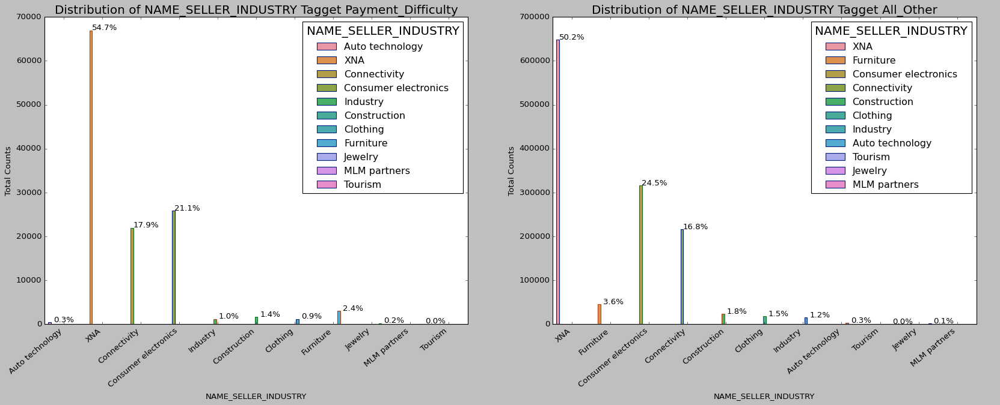

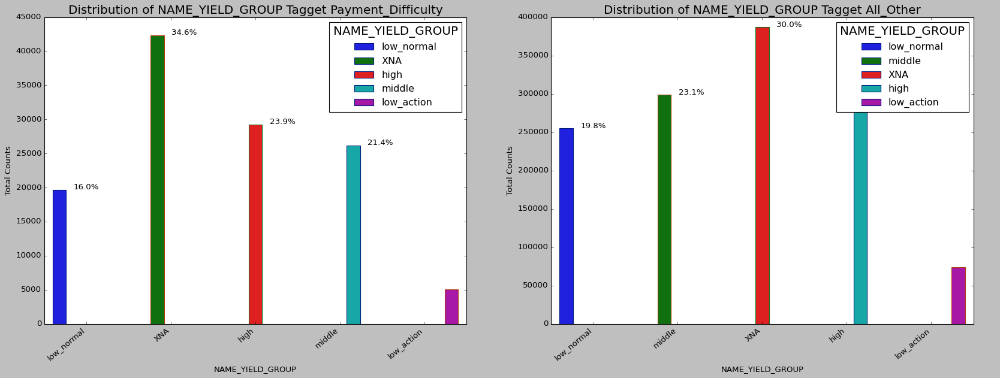

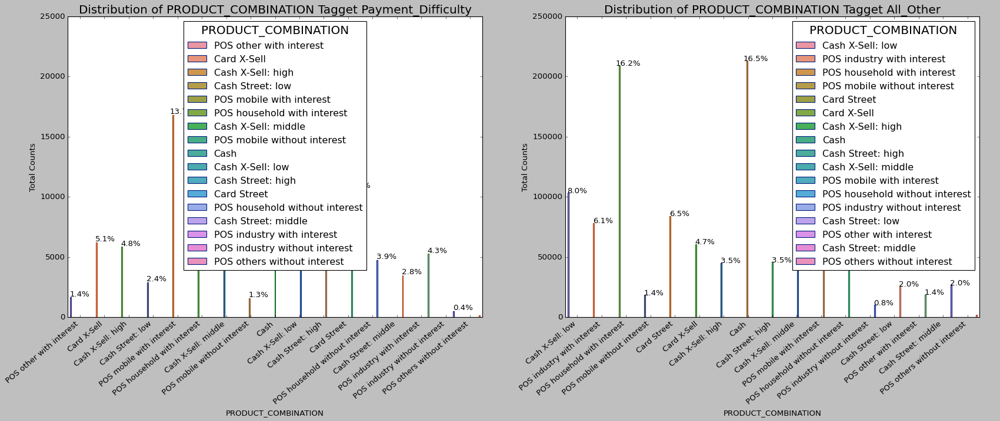

In [74]:
for i in m_cat_data:
  Target_categorical_Uni(i)

In [75]:
def Target_Numerical_Bi(variable_1, variable_2):
    # other thems of plot seaborn-colorblind,seaborn-dark-palette ,classic

    plt.style.use('ggplot')
    sns.despine
    fig,(ax1,ax2) = plt.subplots(1,2,figsize=(20,6))
    
    sns.scatterplot(x=variable_1, y=variable_2,data=Target_Variable_Payment_Difficulty,ax=ax1)
    ax1.set_xlabel(variable_1)    
    ax1.set_ylabel(variable_2)
    ax1.set_title(f'{variable_1} vs {variable_2} Tagget Payment_Difficulty',fontsize=15)
    
    sns.scatterplot(x=variable_1, y=variable_2,data=Target_Variable_All_Other,ax=ax2)
    ax2.set_xlabel(variable_1)    
    ax2.set_ylabel(variable_2)
    ax2.set_title(f'{variable_1} vs {variable_2} Tagget All_Other',fontsize=15)
            
    plt.show()

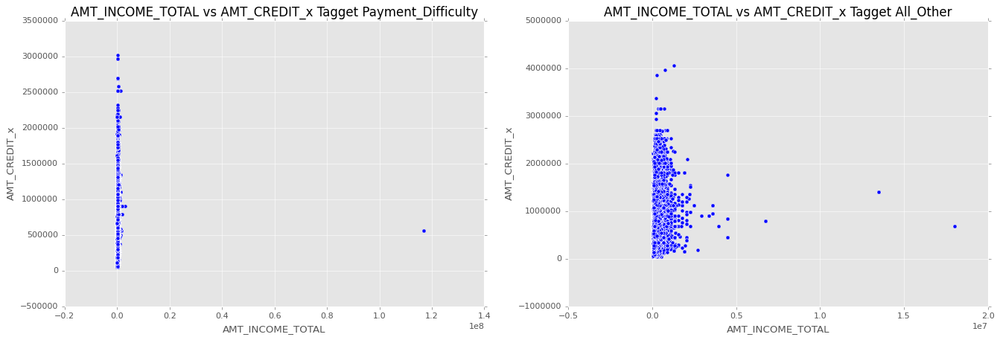

In [78]:
Target_Numerical_Bi('AMT_INCOME_TOTAL', 'AMT_CREDIT_x')

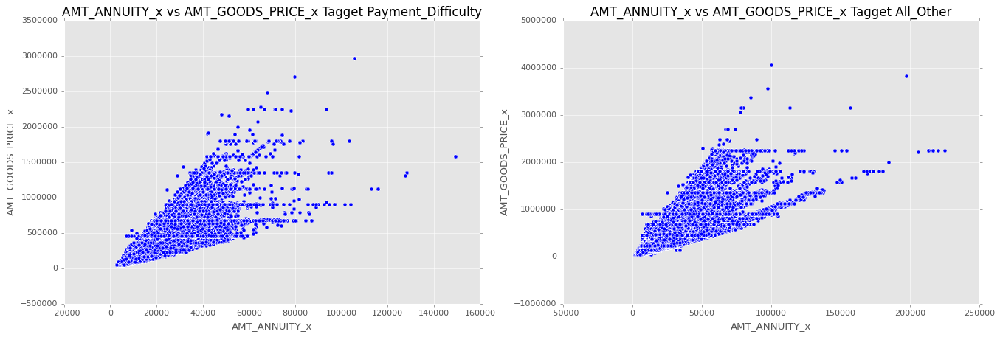

In [79]:
Target_Numerical_Bi('AMT_ANNUITY_x', 'AMT_GOODS_PRICE_x')

##Top Correlations for the target customers with payment difficulties

In [81]:
m_num_data2 = m_num_data.copy()
# Select lower triangle of correlation matrix
corr_matrix = m_num_data2.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
# Find index of feature columns with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]
# Drop features 
m_num_data2 = m_num_data2.drop(m_num_data2[to_drop], axis=1)
def get_redundant_pairs(df):
    '''Get diagonal and lower triangular pairs of correlation matrix'''
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

def get_top_abs_correlations(df, n=10):
    au_corr = df.corr().abs().unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[0:n]

target_payment_difficulties = Target_Variable_Payment_Difficulty.copy()
target_payment_difficulties = target_payment_difficulties.drop(target_payment_difficulties[to_drop], axis=1)
target_payment_difficulties.select_dtypes('number').columns = m_num_data.columns
cat_df = target_payment_difficulties.select_dtypes('object')
dfDummies = pd.get_dummies(cat_df,drop_first=True)
target_payment_difficulties = target_payment_difficulties.drop(target_payment_difficulties.select_dtypes('object'),axis=1)
target_payment_difficulties = pd.concat([target_payment_difficulties,dfDummies],axis=1)
print("Top Absolute Correlations")
print(get_top_abs_correlations(target_payment_difficulties, 10))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  after removing the cwd from sys.path.


Top Absolute Correlations
NAME_PORTFOLIO_Cars          CHANNEL_TYPE_Car dealer         1.000000
DAYS_EMPLOYED                ORGANIZATION_TYPE_XNA           0.999895
FLAG_EMP_PHONE               ORGANIZATION_TYPE_XNA           0.999892
DAYS_EMPLOYED                FLAG_EMP_PHONE                  0.999789
OBS_30_CNT_SOCIAL_CIRCLE     OBS_60_CNT_SOCIAL_CIRCLE        0.998379
NAME_INCOME_TYPE_Pensioner   ORGANIZATION_TYPE_XNA           0.997593
YEARS_BEGINEXPLUATATION_AVG  YEARS_BEGINEXPLUATATION_MEDI    0.997494
DAYS_EMPLOYED                NAME_INCOME_TYPE_Pensioner      0.997489
FLAG_EMP_PHONE               NAME_INCOME_TYPE_Pensioner      0.997486
FLOORSMAX_AVG                FLOORSMAX_MEDI                  0.997139
dtype: float64


In [82]:
print("Top Absolute Correlations")
print(get_top_abs_correlations(target_payment_difficulties, 20))

Top Absolute Correlations
NAME_PORTFOLIO_Cars                  CHANNEL_TYPE_Car dealer         1.000000
DAYS_EMPLOYED                        ORGANIZATION_TYPE_XNA           0.999895
FLAG_EMP_PHONE                       ORGANIZATION_TYPE_XNA           0.999892
DAYS_EMPLOYED                        FLAG_EMP_PHONE                  0.999789
OBS_30_CNT_SOCIAL_CIRCLE             OBS_60_CNT_SOCIAL_CIRCLE        0.998379
NAME_INCOME_TYPE_Pensioner           ORGANIZATION_TYPE_XNA           0.997593
YEARS_BEGINEXPLUATATION_AVG          YEARS_BEGINEXPLUATATION_MEDI    0.997494
DAYS_EMPLOYED                        NAME_INCOME_TYPE_Pensioner      0.997489
FLAG_EMP_PHONE                       NAME_INCOME_TYPE_Pensioner      0.997486
FLOORSMAX_AVG                        FLOORSMAX_MEDI                  0.997139
ENTRANCES_AVG                        ENTRANCES_MEDI                  0.996505
LIVINGAREA_AVG                       LIVINGAREA_MEDI                 0.996181
FLOORSMAX_MODE                       F